In [ ]:
%reset

In [ ]:
import pandas as pd 
import numpy as np 
import numpy as np                   # for multi-dimensional containers
import pandas as pd                  # for DataFrames
import plotly.graph_objects as go    # for data visualisation
from plotly.subplots import make_subplots
import scipy.fftpack                 # discrete Fourier transforms
import matplotlib.pyplot as plt
from numpy.linalg import eig


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np
import json
import glob
from sklearn import preprocessing
import gspread as gs
from scipy.signal import find_peaks
import plotly.figure_factory as ff
import calendar
from scipy.signal import chirp, find_peaks, peak_widths
import scipy.fftpack                 # discrete Fourier transforms
from scipy.signal import find_peaks, peak_prominences
from scipy.signal import butter, lfilter


In [ ]:
from scipy import signal
# time_steps = np.linspace(0, max_time, signal.size)


In [ ]:
# Takes: An n-dimentional numpy array.
# Returns: yf,xf,AMP where yf is the scipi.fft() output, xf is the frequencies of the given fft, and AMP is the amplitude of the given fft. 
def my_fft(df_finger_tapping_2_5_index_norm):
    N = len(df_finger_tapping_2_5_index_norm[0])
    yf = scipy.fftpack.fft(df_finger_tapping_2_5_index_norm[0])
    xf = scipy.fftpack.fftfreq(N,1/40)[:N//2] # get the frequency component Fs = 40 Hz
    #print("xf: ",xf)
    AMP= 2.0/N * np.abs(yf[0:N//2])
    print("AMP: ",AMP)
    return yf,xf,AMP


In [ ]:
# Takes : the fft() output yf.
# Returns: Filtered singal.
def frequency_filtering(yf,AMP):
    bounds = 2
    high_freq_fft = yf.copy()
    high_freq_fft[:np.array(AMP).argmax()-bounds] = 0
    high_freq_fft[np.array(AMP).argmax()+bounds:] = 0
    filtered_sig = scipy.fftpack.ifft(high_freq_fft)
    return filtered_sig


In [106]:
# Returns a list of filepaths and date IDs at which the exercises were performed.
def read_iotex_data(participant_id,reaults_file_name):
    np.set_printoptions(suppress=True)
    root = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/"
    df_rg_paths = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/" + reaults_file_name) # reaults_file - results_p2.csv
    # print(df_rg_paths["Participant"])
    df_rg_paths = df_rg_paths[df_rg_paths["Participant"]==participant_id]
    df_rg_paths = df_rg_paths[df_rg_paths["NOT"]!="X"]
    df_rg_paths["RandomPeaks"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method1_TimeBased"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method3_FreqBased"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["width_threshold"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method3_DominantFreqLowerBound"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["Method3_DominantFreqUpperBound"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    df_rg_paths["SNR_mean_std"] = np.linspace(-911, -911, num=df_rg_paths.shape[0], endpoint=False)
    peak2peak_diff_freq_list = []
    peak2peak_diff_time_list = []
    file_name_list = []
    for index, row in df_rg_paths.iterrows():
        print("",index, row["Participant"] +"/"+ row["DateList"] + "/" + row["FileName"],"===========================")
#         if row["FileName"].startswith("rg_"):
        df = pd.read_csv(root+row["Participant"] +"/"+ row["DateList"] + "/" + row["FileName"])
        print("Index of row index: ",index)
        # Subset the Finger tapping activity.
        if row["FileName"].startswith("rg_"):
            df_finger_tapping = df[df["activity"]==1]
        if row["FileName"].startswith("lg_"):
             df_finger_tapping = df[df["activity"]==0]
        # Subset 2.5 seconds of data.
        start_idx = 100
        end_idx = start_idx+160 
        #print("df_finger_tappin unique(): ",df_finger_tapping["activity"].unique())
        #print("df_finger_tapping.shape: ",df_finger_tapping.shape)
        if df_finger_tapping.shape[0]>=160:
             #################### ------------------------ PREPROCESSING ------------------------ ####################
            df_finger_tapping_2_5 = df_finger_tapping[start_idx:end_idx]
            # Normalize the  raw index finger values.
            # df_finger_tapping_2_5_index_norm is a <class 'numpy.ndarray'> of shape (1, 160) 
            #take df_finger_tapping_2_5_index_norm[0] to get the actual array of values of lingth 160.
            df_finger_tapping_2_5_index_norm = signal.detrend(preprocessing.normalize([df_finger_tapping_2_5["index"]])) #df_lg_activity[column_id]#
            #print("df_finger_tapping_2_5_index_norm:",type(df_finger_tapping_2_5_index_norm[0]))
            
            #################### ------------------------ TIME BASED ------------------------ ####################
            # Run Random peak detector. 
            indices,properties_peaks = find_peaks(df_finger_tapping_2_5_index_norm[0], height=np.quantile(df_finger_tapping_2_5_index_norm[0], 0.50))
            print("Number of Peaks in time based: ", len(indices))
            df_rg_paths.at[index,'RandomPeaks']   =len(indices)
            # find the widths of the peak detected by the random peak detector.
            peak_width = peak_widths(df_finger_tapping_2_5_index_norm[0], indices, rel_height=0.5)
            width_threshold = peak_width[0].mean()
            indicies_p2, properties_peaks_p2 =find_peaks(df_finger_tapping_2_5_index_norm[0], height=np.quantile(df_finger_tapping_2_5_index_norm[0], 0.50),width =width_threshold)
            peaks_timebased =[df_finger_tapping_2_5_index_norm[0][j] for j in indicies_p2]
            df_rg_paths.at[index,'width_threshold'] =width_threshold 
            df_rg_paths.at[index,'Method1_TimeBased'] =len(indicies_p2)
            peak2peak_diff_time = [peaks_timebased[i + 1] - peaks_timebased[i] for i in range(len(peaks_timebased)-1)]
            peak2peak_diff_time_list.append(peak2peak_diff_time)
            #################### ------------------------ FREQUENCY BASED FILTERING------------------------ ####################
            time_steps = np.linspace(0, 40, len(df_finger_tapping_2_5_index_norm[0]))
            yf,xf,AMP = my_fft(df_finger_tapping_2_5_index_norm)
            print("np.array(AMP).argmax(): index of max amp ,AMP ",type(AMP),AMP.argmax(), ",",AMP[AMP.argmax()],", Freq = ",xf[AMP.argmax()])
            # np.array(AMP).argmax(): index of max amp ,AMP  <class 'numpy.ndarray'> 1 , 0.000207940515408654 , Freq =  0.25
            if AMP.argmax() ==1:
                print("Setting new values of yf and aamp")
                yf = yf[2:]
                AMP = AMP[2:]
                xf = xf[2:]
            filtered_sig = frequency_filtering(yf,AMP) # Filtered signal based on inverse fft and dominant frequency component.
            filt_peak_indices, filt_properties_peaks = find_peaks(filtered_sig.real, height=np.quantile(filtered_sig.real, 0.50))
            plt.plot(filtered_sig.real)
            plt.plot(df_finger_tapping_2_5_index_norm[0])
            #plt.xticks(fontsize=20)
            plt.show()
            plt.plot(xf,AMP)
            #plt.xticks(fontsize=20)

            plt.show()

            
            # Get the peak values in the raw data instead of the filtered data. 
            raw_data_peaks = [df_finger_tapping_2_5_index_norm[0][j] for j in filt_peak_indices]
            # Calculate the peak to peak differenc in freequency based filtereing method.
            peak2peak_diff_freq = [raw_data_peaks[i + 1] - raw_data_peaks[i] for i in range(len(raw_data_peaks)-1)]
            peak2peak_diff_freq_list.append(peak2peak_diff_freq)
            file_name_list.append(row["FileName"])
            # Append results to a pandas data frame.
            df_rg_paths.at[index,'Method3_FreqBased'] = len(peak2peak_diff_freq)
            df_rg_paths.at[index,'DominantFreq'] = xf[np.array(AMP).argmax()].real
            df_rg_paths.at[index,'SNR_mean_std'] = np.mean(df_finger_tapping_2_5_index_norm[0])/np.std(df_finger_tapping_2_5_index_norm[0])
    p2p_freq_df = pd.DataFrame(peak2peak_diff_freq_list)
    p2p_freq_df["filename"] = file_name_list
    return df_rg_paths, p2p_freq_df,  pd.DataFrame(peak2peak_diff_time_list)# Row is Session number, columsn are peak indexes


    
    

In [107]:
root_results_write = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/"


 0 Participant1/2021-06-25/rg_20210625-172211.csv ===========================
Index of row index:  0
Number of Peaks in time based:  9
AMP:  [0.         0.00025483 0.00004117 0.00027491 0.00017003 0.00038724
 0.00040556 0.00065633 0.00051357 0.00295549 0.00070878 0.00077835
 0.00017453 0.00013696 0.00019701 0.00067816 0.00068937 0.00026925
 0.00094599 0.00069591 0.0002     0.00025149 0.00031104 0.00014352
 0.00063607 0.00035775 0.00009251 0.00039873 0.00028595 0.00022432
 0.000169   0.00009626 0.00008609 0.00022314 0.00007457 0.00013222
 0.00016024 0.00016521 0.00010852 0.00013617 0.00013704 0.00017048
 0.00015263 0.00002191 0.00009668 0.00008002 0.00015731 0.00002458
 0.0001211  0.00009178 0.00003146 0.00009278 0.00006976 0.00012409
 0.00009272 0.00005417 0.00010406 0.00001886 0.00010552 0.00008617
 0.00001347 0.00006908 0.00007123 0.00009827 0.00013548 0.00004009
 0.0000665  0.00008604 0.00004157 0.00009664 0.00007277 0.00002523
 0.00007774 0.00002537 0.00010427 0.00008322 0.00004789

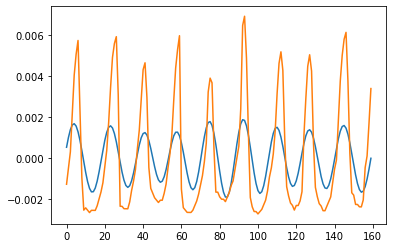

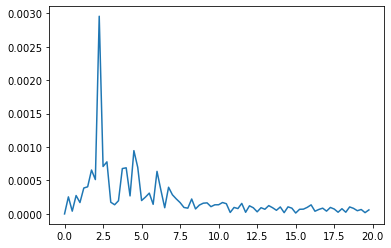

 1 Participant1/2021-06-25/rg_20210625-071807.csv ===========================
Index of row index:  1
Number of Peaks in time based:  7
AMP:  [0.         0.00060455 0.00119235 0.00160657 0.00194182 0.00186269
 0.00362235 0.00453627 0.00809091 0.00143353 0.00139057 0.0003659
 0.00030522 0.00089388 0.00146968 0.00281737 0.00186653 0.00054644
 0.00009814 0.00033034 0.00017986 0.00051009 0.0002761  0.00096957
 0.00042504 0.00019862 0.00039352 0.00027883 0.00033651 0.0003354
 0.00024885 0.00048339 0.00003468 0.00028364 0.00009221 0.0001423
 0.00015556 0.00025491 0.00021068 0.00007108 0.00014591 0.0001441
 0.00005507 0.00003111 0.00008491 0.00012446 0.00011471 0.00004519
 0.00012548 0.00012961 0.00005947 0.0000774  0.00007085 0.00012567
 0.00007045 0.00003463 0.00007463 0.00007169 0.00009438 0.0000649
 0.00013433 0.00014025 0.0000615  0.00004767 0.00006182 0.00007047
 0.00009395 0.00005553 0.00009291 0.00005943 0.00003329 0.00006848
 0.00004387 0.00006021 0.00006435 0.00007953 0.00006586 0.00

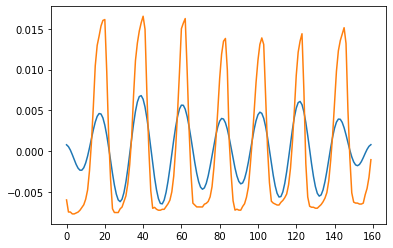

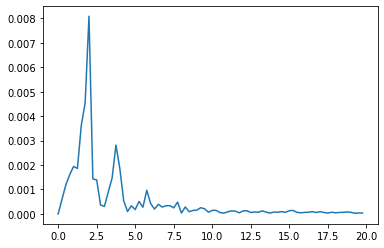

 2 Participant1/2021-06-24/rg_20210624-170825.csv ===========================
Index of row index:  2
Number of Peaks in time based:  8
AMP:  [0.         0.00026992 0.00081247 0.00126253 0.00051848 0.00087144
 0.00045236 0.00227776 0.00515693 0.00148399 0.00025449 0.00103511
 0.00086671 0.00100691 0.00060736 0.00230744 0.00126026 0.00062985
 0.00023913 0.00031257 0.00046853 0.00022943 0.00026899 0.00116856
 0.00028167 0.00017463 0.00024563 0.00017912 0.00028964 0.00017621
 0.00036819 0.00040336 0.00026193 0.00011156 0.00035792 0.00020626
 0.0000227  0.00001717 0.00031707 0.00006258 0.00011324 0.00002908
 0.00017882 0.00018192 0.00009341 0.00012935 0.00016113 0.00008356
 0.00007325 0.00010397 0.00008287 0.0000748  0.00004535 0.00011917
 0.0000195  0.00009103 0.00002942 0.00011302 0.00010339 0.00006892
 0.00002963 0.00005821 0.00005243 0.00008247 0.00008686 0.00007069
 0.00002309 0.00010322 0.00008468 0.00001528 0.00007558 0.00003259
 0.00008806 0.00006424 0.0000562  0.00005727 0.00005163

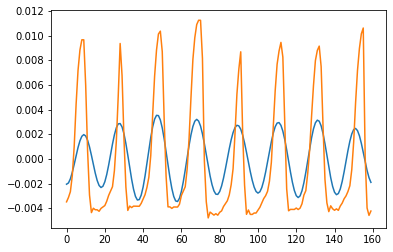

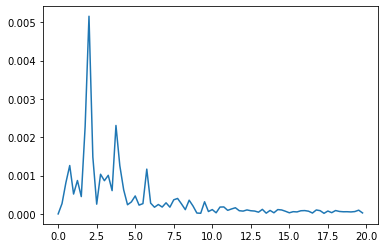

 3 Participant1/2021-07-06/rg_20210706-070145.csv ===========================
Index of row index:  3
Number of Peaks in time based:  9
AMP:  [0.         0.00057967 0.00045048 0.00059457 0.00078828 0.00097012
 0.00043067 0.00132459 0.00149597 0.00465933 0.00232292 0.00075297
 0.00063046 0.00049168 0.00019685 0.0008855  0.00127581 0.00045276
 0.00072887 0.00224399 0.00048858 0.0003807  0.00024506 0.00016908
 0.0008036  0.0005514  0.00028932 0.00006037 0.00055009 0.0003575
 0.00015375 0.00021386 0.00012543 0.00024493 0.00025146 0.00030579
 0.00013072 0.00017874 0.00028841 0.00006361 0.00014078 0.00007404
 0.00003973 0.00013807 0.00006822 0.00010592 0.0001336  0.0000151
 0.00014438 0.00012188 0.00010725 0.00015637 0.00003597 0.00006679
 0.00014102 0.00010696 0.00013385 0.00007391 0.00002536 0.00017568
 0.00010227 0.00013929 0.00009966 0.00005462 0.00017936 0.00013222
 0.00009798 0.00009513 0.00006986 0.00013065 0.00007813 0.00001724
 0.00005422 0.000021   0.00010458 0.00006353 0.00001641 0

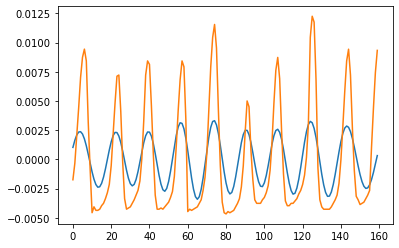

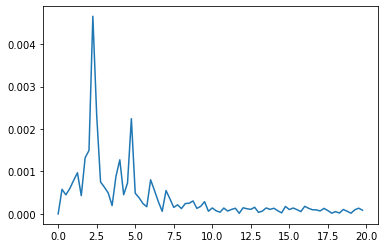

 4 Participant1/2021-07-01/rg_20210701-212116.csv ===========================
Index of row index:  4
Number of Peaks in time based:  9
AMP:  [0.         0.00006077 0.00025699 0.00012901 0.00025705 0.00040395
 0.00045348 0.0009692  0.00131569 0.00220531 0.00233991 0.00068437
 0.00005018 0.00038273 0.00056997 0.00039    0.00053181 0.00045406
 0.00044661 0.00122677 0.0002367  0.00008973 0.00013644 0.00017544
 0.00021427 0.00006088 0.00023481 0.00039971 0.0001451  0.00018873
 0.00001704 0.00000829 0.00002902 0.00015632 0.00003109 0.00011408
 0.00006822 0.00014008 0.00013875 0.00004749 0.00003342 0.0000296
 0.00002442 0.00003707 0.00003702 0.00006847 0.00009068 0.00003095
 0.00002024 0.00005207 0.00003737 0.00003707 0.00003947 0.00002531
 0.00003923 0.00001665 0.00000979 0.00002125 0.00001904 0.00002343
 0.00001044 0.00000932 0.00001385 0.00001451 0.00000922 0.0000078
 0.00002011 0.00000943 0.00002734 0.00002515 0.00002146 0.00004164
 0.00000885 0.00002307 0.0000262  0.00003815 0.00001575 0

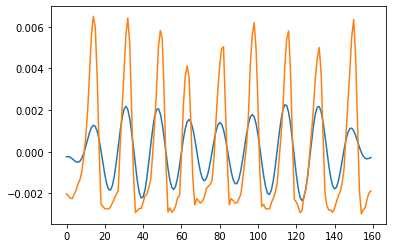

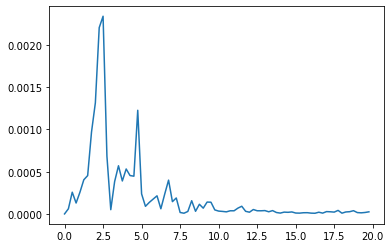

 5 Participant1/2021-07-01/rg_20210701-070904.csv ===========================
Index of row index:  5
Number of Peaks in time based:  9
AMP:  [0.         0.00068121 0.00052559 0.00034799 0.00016932 0.00094117
 0.00098988 0.00071319 0.00178381 0.00502435 0.00131593 0.00094289
 0.0004927  0.00039351 0.00081329 0.00084583 0.00034094 0.00112345
 0.00132308 0.0006433  0.00065916 0.00068883 0.00013057 0.00053017
 0.0001245  0.00034493 0.00023659 0.00036604 0.00039805 0.00017383
 0.00043008 0.00011035 0.00030412 0.00021    0.00015016 0.00014083
 0.0001394  0.00013191 0.00006699 0.00015682 0.00011373 0.00010549
 0.0001156  0.0000869  0.00010985 0.00009161 0.00007491 0.00009925
 0.0001164  0.00011541 0.00004839 0.00007089 0.00006494 0.00006812
 0.00010254 0.0000617  0.00003327 0.00009246 0.00009689 0.00008957
 0.0000346  0.00006053 0.00007054 0.00014345 0.00005728 0.00004945
 0.00011803 0.00007611 0.00009847 0.00003169 0.00004844 0.00007683
 0.00007224 0.00005755 0.00003743 0.00003857 0.00001253

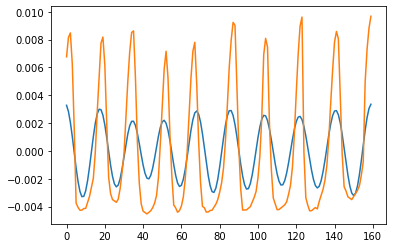

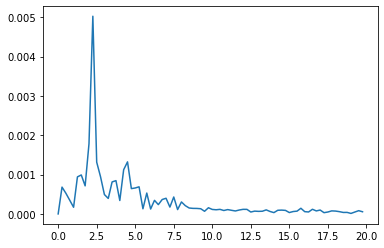

 6 Participant1/2021-06-30/rg_20210630-071412.csv ===========================
Index of row index:  6
Number of Peaks in time based:  8
AMP:  [0.         0.00012052 0.0004961  0.00047867 0.0002256  0.00026322
 0.00014306 0.00043241 0.00751968 0.0004604  0.00031803 0.00067122
 0.00034315 0.00083154 0.00044033 0.00037644 0.00319307 0.00043405
 0.00010006 0.0001335  0.00013931 0.00046074 0.00025922 0.0002363
 0.00094567 0.00020316 0.00020794 0.00027027 0.00019522 0.00015018
 0.00003544 0.0002476  0.00037056 0.00023421 0.00012455 0.00010056
 0.00018093 0.00009327 0.00007265 0.00015614 0.00009549 0.00012887
 0.00003981 0.00006992 0.00012358 0.00008532 0.00009846 0.00008787
 0.00012909 0.00011228 0.00000636 0.00007789 0.00007393 0.00010963
 0.00008616 0.00007037 0.00015138 0.0000804  0.00006767 0.00006193
 0.00003341 0.00006317 0.00005157 0.00010294 0.00013539 0.00004431
 0.00008028 0.00007791 0.00009855 0.00006082 0.0000333  0.0001126
 0.00007172 0.00008749 0.00005384 0.00007223 0.00009755 0

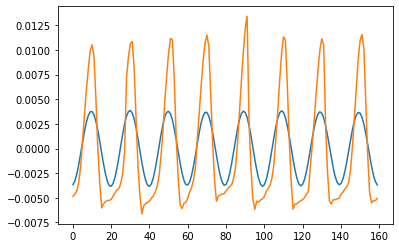

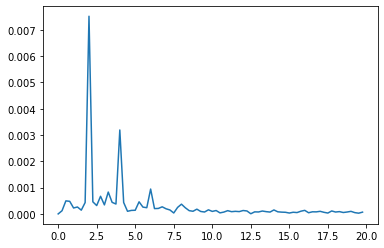

 7 Participant1/2021-06-30/rg_20210630-221335.csv ===========================
Index of row index:  7
Number of Peaks in time based:  9
AMP:  [0.         0.00072142 0.00046358 0.00061861 0.00044695 0.00059965
 0.00229577 0.00294768 0.0020234  0.00265889 0.00219349 0.00077176
 0.00039717 0.00076072 0.00067586 0.00036477 0.00076838 0.00059267
 0.00124073 0.00066667 0.00045373 0.00015057 0.00020634 0.00019733
 0.00072291 0.00031675 0.00047884 0.0003594  0.00025112 0.00044615
 0.00007594 0.0003551  0.00015486 0.00013677 0.00028749 0.0000217
 0.00021888 0.00019325 0.00003483 0.00018333 0.00012578 0.00015567
 0.00006913 0.00009051 0.00016669 0.00008109 0.00012087 0.00008762
 0.00001823 0.00007464 0.00015032 0.00009888 0.00009533 0.0000525
 0.00013017 0.0000834  0.00007596 0.00005005 0.00003944 0.00003395
 0.00012436 0.00002511 0.00003767 0.00000621 0.00009928 0.00005175
 0.00008116 0.00007306 0.00003956 0.0000871  0.00006637 0.00007438
 0.00001909 0.00002258 0.0001054  0.00001967 0.00008966 0

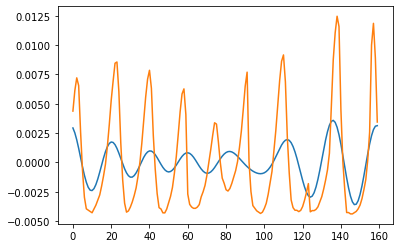

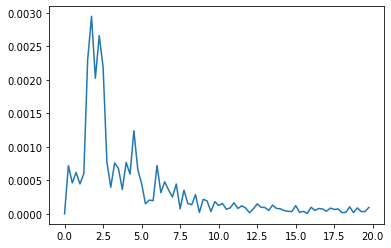

 8 Participant1/2021-06-28/rg_20210628-081600.csv ===========================
Index of row index:  8
Number of Peaks in time based:  9
AMP:  [0.         0.00037606 0.0003312  0.00031166 0.00068438 0.00075991
 0.00090996 0.00154613 0.0034288  0.00284372 0.00098409 0.00046501
 0.00026024 0.00022134 0.00026568 0.00025243 0.00020963 0.00219784
 0.00034581 0.00018896 0.00006358 0.00035234 0.00048862 0.00039529
 0.00023517 0.00076416 0.0004027  0.00030984 0.00014037 0.00005141
 0.00021536 0.00006344 0.00013616 0.00013499 0.0003335  0.00026144
 0.00005417 0.00012084 0.00012374 0.00010038 0.00018091 0.00009254
 0.00011685 0.00005264 0.00009453 0.00006609 0.00009867 0.00006888
 0.00005244 0.00003463 0.00008688 0.00008779 0.00005108 0.00004312
 0.00002846 0.00007174 0.00003244 0.00005051 0.0000394  0.00005563
 0.00002267 0.00003984 0.00001238 0.00001408 0.00002551 0.0000122
 0.00002599 0.00002594 0.00004283 0.00002924 0.00005552 0.00002297
 0.00004806 0.0000122  0.00003596 0.00002118 0.00002148 

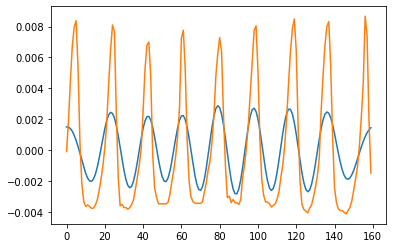

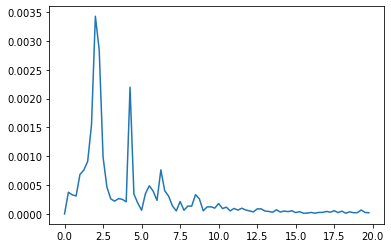

 9 Participant1/2021-06-28/rg_20210628-070900.csv ===========================
Index of row index:  9
Number of Peaks in time based:  9
AMP:  [0.         0.00024294 0.000152   0.00009108 0.0000952  0.00030309
 0.00032967 0.00070499 0.00147869 0.00069078 0.00031386 0.00021613
 0.00030429 0.00033987 0.00015768 0.00036117 0.00070796 0.00075174
 0.00017466 0.00010516 0.00021611 0.00014841 0.00013347 0.00024758
 0.00039464 0.00033251 0.00022275 0.00005659 0.0000484  0.00003471
 0.00014051 0.00012344 0.00013485 0.00017202 0.0001016  0.00010408
 0.00001816 0.00006288 0.00006263 0.00006567 0.00008959 0.00010904
 0.00007137 0.00005844 0.00004954 0.00003491 0.00002622 0.00001382
 0.00007571 0.00009175 0.00004257 0.00006841 0.00003089 0.00003973
 0.00002975 0.00001877 0.00005506 0.00003922 0.0000476  0.00006746
 0.00003418 0.00004961 0.00002195 0.00000982 0.00003578 0.00003901
 0.0000298  0.00005464 0.00003994 0.00004522 0.00001376 0.00001385
 0.00002911 0.0000293  0.00002384 0.00003914 0.00003277

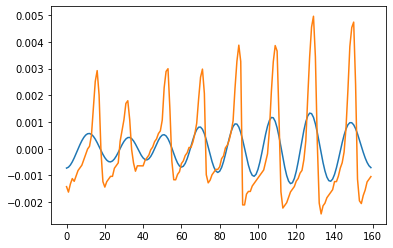

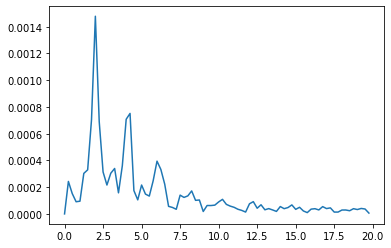

 10 Participant1/2021-06-29/rg_20210629-063713.csv ===========================
Index of row index:  10
Number of Peaks in time based:  9
AMP:  [0.         0.00069613 0.00031086 0.00019823 0.00082708 0.00059219
 0.00078927 0.0014694  0.00173958 0.00304728 0.00107272 0.00067333
 0.00048529 0.00054213 0.00054371 0.00039805 0.00122966 0.00155026
 0.00053176 0.00068591 0.00015091 0.00054959 0.00004354 0.00020533
 0.00015166 0.00051382 0.00059259 0.00065856 0.00014409 0.00016463
 0.00037296 0.00012828 0.00019504 0.00032535 0.00012068 0.00008739
 0.00033325 0.00018492 0.00018995 0.00022994 0.00015791 0.00007491
 0.0002648  0.00019067 0.00010281 0.0001715  0.00006542 0.00017618
 0.00020349 0.00007641 0.0000285  0.00010274 0.0001687  0.00011209
 0.00008176 0.00004222 0.00008865 0.00017196 0.00010875 0.00007016
 0.00003148 0.00009187 0.00013471 0.00008898 0.0000466  0.00002016
 0.00011436 0.00015077 0.00012019 0.00001638 0.00002617 0.00006522
 0.00012874 0.00011658 0.00008289 0.00001167 0.000085

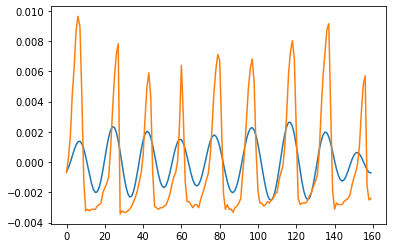

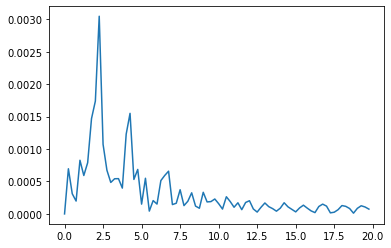

 11 Participant1/2021-06-29/rg_20210629-194025.csv ===========================
Index of row index:  11
Number of Peaks in time based:  10
AMP:  [0.         0.00023268 0.00013052 0.00030262 0.00011943 0.0003038
 0.00022996 0.00061625 0.00071939 0.00122209 0.00155483 0.00052866
 0.00022409 0.00020457 0.00014243 0.00031401 0.00051201 0.00014957
 0.00032879 0.00105583 0.00009605 0.00018895 0.00020658 0.0000679
 0.00028776 0.00023306 0.00052427 0.00029585 0.00024505 0.00048834
 0.00012122 0.00003798 0.00006754 0.00013206 0.00018197 0.00027574
 0.00014687 0.00015979 0.00026702 0.0000496  0.00017263 0.0000582
 0.0000584  0.00009908 0.00012226 0.00013071 0.00005514 0.00002462
 0.00010988 0.00010263 0.00006394 0.00004484 0.0000676  0.00008687
 0.00008148 0.00005545 0.0000293  0.00007848 0.00002177 0.00012618
 0.00002857 0.00008652 0.00001719 0.00009048 0.00001411 0.00005169
 0.00004552 0.00004181 0.00005397 0.00004098 0.00005502 0.0000544
 0.00006926 0.00002554 0.00003256 0.00000823 0.00004159 

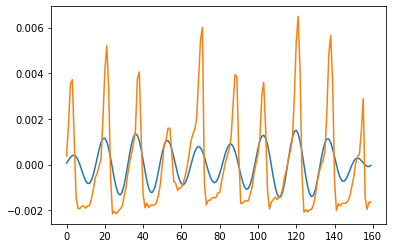

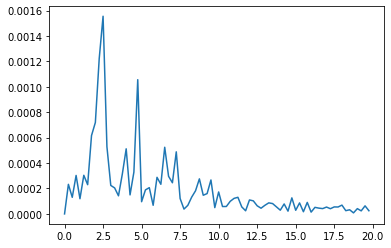

 12 Participant1/2021-06-27/rg_20210627-122353.csv ===========================
Index of row index:  12
Number of Peaks in time based:  9
AMP:  [0.         0.0006128  0.00025988 0.00014846 0.0006144  0.00047452
 0.00006145 0.00039719 0.001178   0.00399602 0.00047606 0.00021286
 0.00034901 0.00068768 0.00054449 0.00015734 0.00027708 0.00093261
 0.00176573 0.00076009 0.00016714 0.00028141 0.00047171 0.00031127
 0.00031924 0.00019419 0.00042027 0.00061547 0.00055869 0.00010879
 0.00023727 0.00023335 0.00018742 0.00025589 0.00010895 0.00003812
 0.00025606 0.00034039 0.00018386 0.00020122 0.00014786 0.000102
 0.00021618 0.00011824 0.00016783 0.00005626 0.00021907 0.00010895
 0.00014967 0.00015628 0.00007235 0.00017521 0.00012746 0.0001121
 0.00010584 0.0000848  0.00008008 0.00009838 0.00011651 0.00011376
 0.00005372 0.00008917 0.00010926 0.0000899  0.00009694 0.00003006
 0.0000871  0.00009122 0.00009543 0.00007496 0.00000635 0.00010177
 0.00009116 0.00009936 0.00006221 0.00003052 0.00008362 

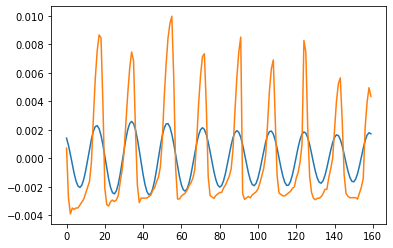

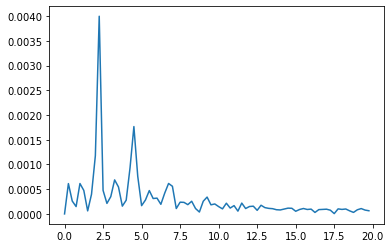

 13 Participant1/2021-06-27/rg_20210627-093647.csv ===========================
Index of row index:  13
Number of Peaks in time based:  9
AMP:  [0.         0.00064247 0.00022712 0.00092189 0.00094233 0.00019238
 0.00090197 0.00135931 0.00076685 0.00852427 0.00075555 0.00041611
 0.00044991 0.00099998 0.00088881 0.00039516 0.00117848 0.00057882
 0.00343609 0.0008101  0.00058971 0.00013035 0.00064099 0.0006946
 0.00038025 0.00054515 0.00018914 0.00076457 0.00062148 0.00032888
 0.00004214 0.00026853 0.00022488 0.00033524 0.00020654 0.00012591
 0.00027139 0.00028407 0.00017858 0.00010774 0.00015716 0.00016025
 0.00012266 0.00017594 0.00010803 0.00007325 0.00016838 0.00012722
 0.00008308 0.00017763 0.000053   0.00009187 0.00003059 0.00010222
 0.00013194 0.00013527 0.00012928 0.00002078 0.00008026 0.00010529
 0.00007836 0.00008675 0.00007796 0.00009268 0.00004821 0.00008997
 0.00006665 0.00002966 0.00011727 0.00007832 0.00003862 0.00011848
 0.00002405 0.00002599 0.00006731 0.00003764 0.0000541

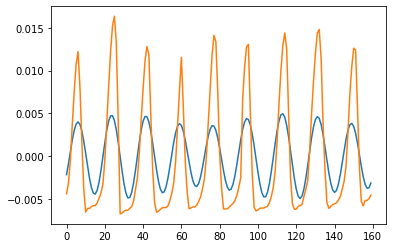

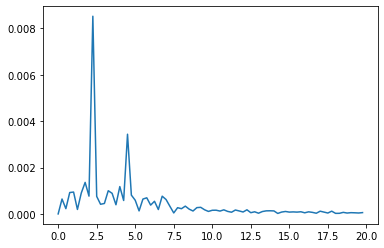

 14 Participant1/2021-07-04/rg_20210704-145340.csv ===========================
Index of row index:  14
Number of Peaks in time based:  11
AMP:  [0.         0.00063504 0.00111822 0.00066543 0.00065293 0.00071993
 0.00120004 0.00101298 0.00140346 0.00286201 0.00312319 0.00043462
 0.00028805 0.00010726 0.00044172 0.00062899 0.00063827 0.00029246
 0.00055949 0.00199696 0.00046434 0.00037861 0.00034857 0.00050926
 0.00047081 0.00026833 0.00009955 0.00024906 0.0003249  0.00059356
 0.00014779 0.00010078 0.00008845 0.00030654 0.00027643 0.00021293
 0.00003775 0.00014861 0.00019193 0.00024739 0.00023335 0.00009219
 0.00017919 0.000034   0.00014292 0.00018328 0.00014954 0.00008268
 0.00010763 0.00013696 0.00011084 0.00012455 0.00010184 0.00000581
 0.00015423 0.00005696 0.00014985 0.0000937  0.00003002 0.00016933
 0.00002392 0.00018108 0.00004257 0.0000461  0.00018114 0.00004252
 0.00012753 0.00002575 0.00006901 0.00013608 0.000086   0.00012925
 0.0000255  0.00003973 0.00013262 0.00007984 0.00007

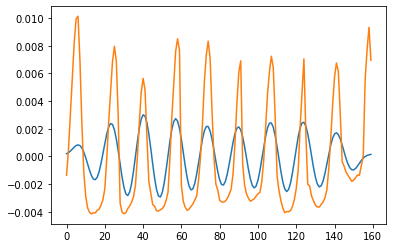

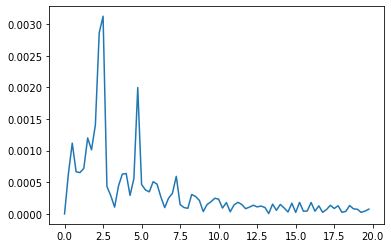

 15 Participant1/2021-07-04/rg_20210704-074924.csv ===========================
Index of row index:  15
Number of Peaks in time based:  10
AMP:  [0.         0.00116646 0.00024877 0.00050458 0.00136384 0.00043213
 0.00088157 0.00085071 0.00208184 0.00687442 0.00106673 0.00035983
 0.00043979 0.00120128 0.00019539 0.00039048 0.00067113 0.00131256
 0.00275666 0.00147519 0.00005394 0.00043683 0.00050701 0.00010465
 0.00069193 0.00034259 0.00030606 0.00058434 0.0006055  0.00041849
 0.00027265 0.00011695 0.0001932  0.00055352 0.00005582 0.00007482
 0.00022395 0.00012742 0.0003494  0.00005778 0.00006954 0.0001516
 0.00022209 0.00013501 0.0001576  0.00006127 0.00008875 0.00016595
 0.00013676 0.00002947 0.00008718 0.00013948 0.00003527 0.00012675
 0.00004463 0.00001637 0.00011242 0.00005299 0.00005356 0.0001313
 0.00000975 0.00004452 0.00006555 0.00004761 0.00008008 0.00001059
 0.00010862 0.00007724 0.00010015 0.00010329 0.00002701 0.00007568
 0.0001354  0.00004525 0.00009902 0.00004408 0.0000763

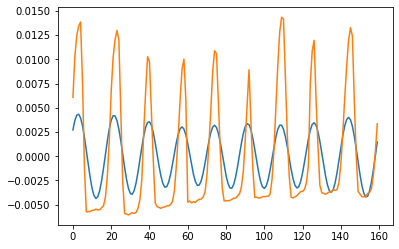

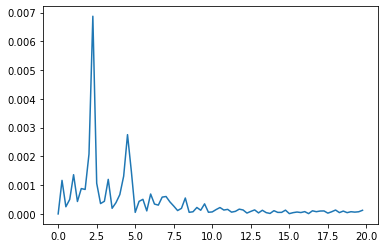

 16 Participant1/2021-07-03/rg_20210703-070405.csv ===========================
Index of row index:  16
 17 Participant1/2021-07-02/rg_20210702-065005.csv ===========================
Index of row index:  17
Number of Peaks in time based:  9
AMP:  [0.         0.00055991 0.00031564 0.00012061 0.00044116 0.00028263
 0.00047644 0.00078674 0.00146315 0.00368723 0.00055944 0.00041494
 0.00037216 0.00050754 0.00029706 0.00014069 0.00074417 0.00074591
 0.00100664 0.00061951 0.0001993  0.00039401 0.00032304 0.00007396
 0.00028712 0.00035695 0.00025953 0.00021726 0.00028543 0.00006052
 0.00019799 0.00023546 0.00011869 0.00013157 0.00029279 0.00009022
 0.00006484 0.00008685 0.00003048 0.00014399 0.00009192 0.00014524
 0.00008653 0.00013291 0.00009126 0.00004041 0.00009813 0.00005618
 0.00007108 0.000092   0.00006799 0.00007371 0.00005277 0.00005141
 0.00006078 0.00006511 0.0000533  0.0000444  0.00003788 0.00009382
 0.00003719 0.00003002 0.00001984 0.00002614 0.00008023 0.00004276
 0.00006056 0.000

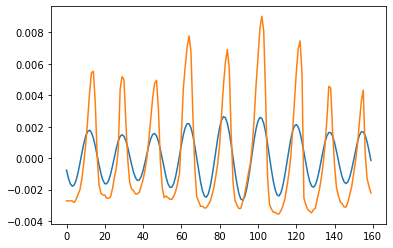

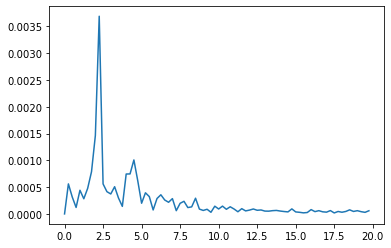

 18 Participant1/2021-07-02/rg_20210702-185148.csv ===========================
Index of row index:  18
Number of Peaks in time based:  9
AMP:  [0.         0.00014438 0.00013842 0.00015529 0.00017713 0.00073222
 0.0006444  0.00102028 0.00115634 0.00270733 0.0016686  0.00076486
 0.00037616 0.00025516 0.00074109 0.00043162 0.00042146 0.0002331
 0.00056538 0.00085752 0.00040274 0.00021774 0.00022251 0.00028326
 0.00024504 0.00012041 0.00024941 0.00037809 0.00043436 0.00021327
 0.00021661 0.00004214 0.00026016 0.00024613 0.00015607 0.00015157
 0.00010276 0.00005622 0.00011608 0.0001175  0.00017059 0.00016134
 0.0000631  0.00008523 0.00006092 0.00005543 0.00006754 0.00005338
 0.00001351 0.00009841 0.00012296 0.00008655 0.00000873 0.00003563
 0.00004751 0.00007161 0.00002745 0.00001696 0.00002248 0.00001472
 0.00010093 0.00000781 0.00001264 0.00001012 0.00001473 0.00007432
 0.00001453 0.0000133  0.00001975 0.00001158 0.00003642 0.00001724
 0.0000036  0.00001456 0.00001929 0.00004521 0.0000478

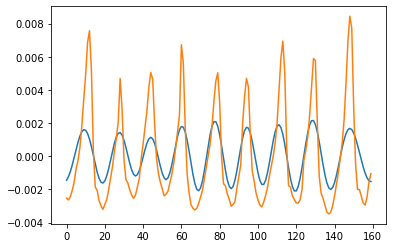

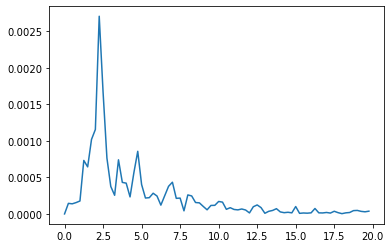

 19 Participant1/2021-07-05/rg_20210705-191026.csv ===========================
Index of row index:  19
Number of Peaks in time based:  10
AMP:  [0.         0.00044766 0.00050801 0.00018565 0.00054896 0.00026702
 0.00068507 0.00078994 0.00063226 0.00345025 0.00198022 0.00127859
 0.00045481 0.00048891 0.00052294 0.00012185 0.00049038 0.00043279
 0.00071905 0.00179606 0.00081825 0.0002492  0.00004997 0.00008206
 0.00048515 0.00044167 0.00035869 0.00009435 0.0005644  0.00021384
 0.0002178  0.00009161 0.00011151 0.00022006 0.00024709 0.00007184
 0.00004102 0.00018723 0.00005556 0.00006184 0.00011803 0.00013188
 0.00005315 0.00008521 0.00005745 0.00010313 0.00010816 0.00010771
 0.00012133 0.00014155 0.00007556 0.00010965 0.00010674 0.00011253
 0.00012886 0.0000698  0.00011463 0.00011361 0.00010559 0.00006693
 0.00012492 0.00010361 0.00010689 0.00009882 0.0000618  0.00008931
 0.00009643 0.00007149 0.00008909 0.00011948 0.00008052 0.0000799
 0.00003839 0.00003862 0.0000686  0.00008185 0.000057

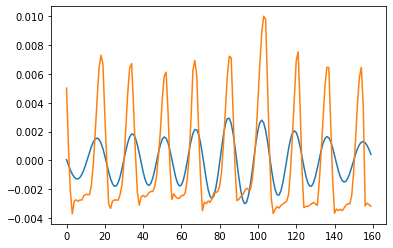

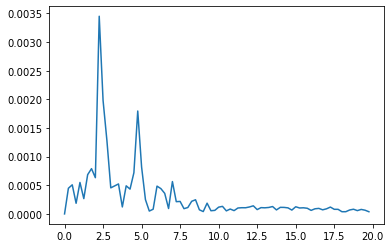

 20 Participant1/2021-07-05/rg_20210705-125950.csv ===========================
Index of row index:  20
Number of Peaks in time based:  10
AMP:  [0.         0.00036871 0.00047139 0.00068716 0.00050162 0.00077817
 0.0011065  0.00055931 0.00144717 0.00460923 0.00259838 0.00097192
 0.00075686 0.00062034 0.00001889 0.00026691 0.00047987 0.00028332
 0.000621   0.00222453 0.00062241 0.00048444 0.00034295 0.00023324
 0.00050425 0.00026899 0.00021383 0.0003633  0.00093527 0.00022127
 0.0003137  0.00007126 0.0001734  0.00019267 0.0002027  0.00009697
 0.00015493 0.00014605 0.00037523 0.0001975  0.00006662 0.00006222
 0.00009814 0.00019798 0.00007246 0.00008968 0.00011437 0.00020155
 0.00005761 0.00008168 0.00008091 0.00006388 0.00010033 0.00008974
 0.00009222 0.00012139 0.00013979 0.00002221 0.00006019 0.0001095
 0.00008609 0.00010606 0.00006773 0.00002739 0.00010888 0.00009212
 0.0000729  0.00002293 0.000089   0.00010566 0.00010565 0.0001035
 0.00003754 0.00003782 0.00010645 0.00007182 0.0000308

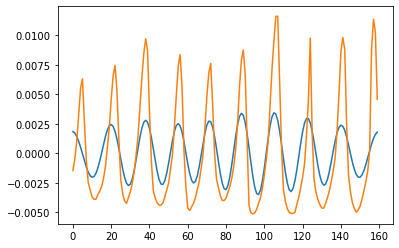

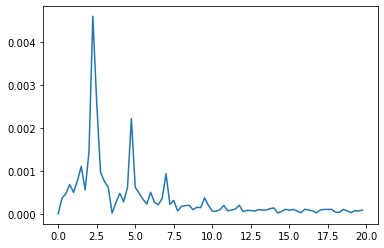

 21 Participant1/2021-06-25/lg_20210625-172211.csv ===========================
Index of row index:  21
Number of Peaks in time based:  19
AMP:  [0.         0.00011765 0.00006523 0.00008755 0.00019893 0.00006982
 0.00003795 0.00016082 0.00028773 0.00013024 0.00023724 0.00014247
 0.00026519 0.00005831 0.00007204 0.00002538 0.00004819 0.00011199
 0.00003427 0.00003226 0.00002349 0.00001601 0.00008301 0.00003844
 0.00000216 0.00005408 0.00004419 0.00001022 0.00001032 0.00002027
 0.00002063 0.0000147  0.00001096 0.0000103  0.0000167  0.00001855
 0.00003146 0.00002489 0.00002321 0.00002076 0.00000132 0.00000945
 0.0000099  0.00001437 0.00000802 0.00001578 0.00001313 0.00001574
 0.00001402 0.00001941 0.00000623 0.00002329 0.00000975 0.00001717
 0.00000625 0.00000445 0.00000614 0.00001098 0.00001205 0.00000876
 0.00000371 0.00000465 0.00000875 0.00001504 0.00000733 0.0000159
 0.00001088 0.00000459 0.00001086 0.00001127 0.00000759 0.00001112
 0.00000966 0.00000125 0.00001515 0.00000252 0.000007

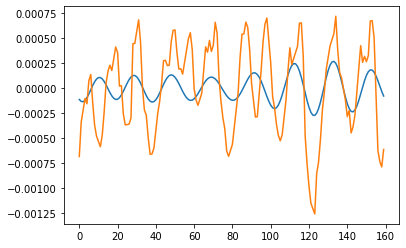

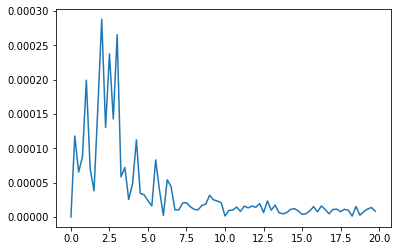

 22 Participant1/2021-06-25/lg_20210625-071807.csv ===========================
Index of row index:  22
Number of Peaks in time based:  7
AMP:  [0.         0.00128437 0.00082862 0.00050758 0.00122936 0.00100099
 0.00133456 0.00673215 0.00056319 0.00069205 0.00051958 0.00024266
 0.00097221 0.00063636 0.00137082 0.00017608 0.00014469 0.00027506
 0.00024914 0.0003108  0.00030748 0.00057173 0.00012767 0.00004577
 0.00017046 0.00014763 0.00021004 0.00026536 0.00017909 0.00016694
 0.00006499 0.00013057 0.0001469  0.00019349 0.00009585 0.00017035
 0.00005314 0.00015158 0.00008294 0.00008866 0.00007966 0.00004666
 0.00016121 0.0000834  0.0000776  0.00002117 0.00006568 0.0000823
 0.00007193 0.00007607 0.00002633 0.00009356 0.00005029 0.00007229
 0.0000346  0.00003878 0.00008495 0.00001953 0.00006242 0.00001585
 0.00003039 0.00007853 0.00005498 0.00006133 0.00004385 0.00004509
 0.00004762 0.00005316 0.00004687 0.00003411 0.00006058 0.0000351
 0.0000623  0.0000186  0.00005395 0.00004156 0.00002915

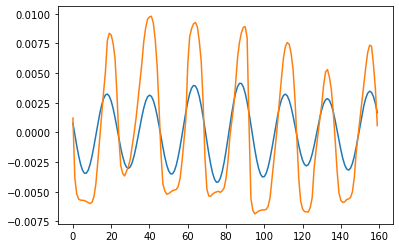

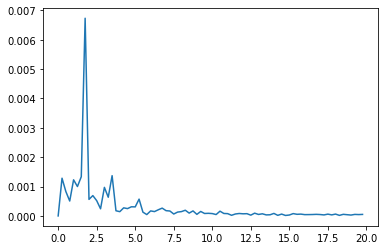

 23 Participant1/2021-06-24/lg_20210624-170825.csv ===========================
Index of row index:  23
Number of Peaks in time based:  17
AMP:  [0.         0.00046187 0.00034016 0.00033025 0.00009841 0.00015107
 0.00028251 0.00022707 0.00133303 0.00113201 0.000493   0.00033063
 0.00024795 0.00014641 0.00026445 0.00018957 0.00023157 0.00046308
 0.00011472 0.00022964 0.00024506 0.00019796 0.00021404 0.00026955
 0.00035848 0.00028369 0.00032229 0.00021899 0.0002047  0.00006962
 0.0001669  0.00009109 0.00012211 0.00010808 0.00002315 0.00013537
 0.00009348 0.00006812 0.00007715 0.00002844 0.00006281 0.0000688
 0.00006056 0.00003235 0.00002476 0.00003802 0.00005857 0.00009756
 0.0000483  0.00003184 0.00006278 0.00003689 0.00004706 0.0000324
 0.00000899 0.00002724 0.00004382 0.00006426 0.00001414 0.00004744
 0.00003557 0.00003006 0.00003359 0.00004786 0.0000333  0.00001581
 0.00003542 0.0000522  0.00003878 0.00001189 0.00003842 0.00000637
 0.00003223 0.00002414 0.00001687 0.00005142 0.0000224

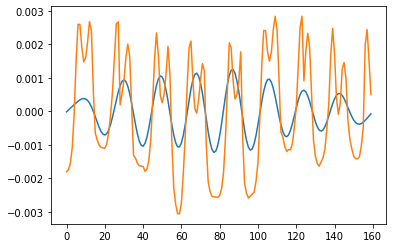

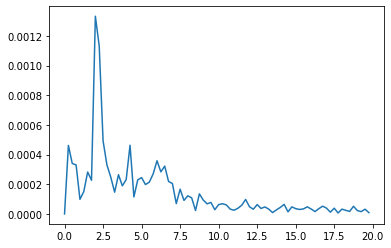

 24 Participant1/2021-07-06/lg_20210706-070145.csv ===========================
Index of row index:  24
Number of Peaks in time based:  15
AMP:  [0.         0.00011867 0.00014737 0.00006483 0.00009761 0.00008701
 0.0000882  0.0001883  0.00018421 0.00037167 0.00005702 0.00023532
 0.0000779  0.00006066 0.00009468 0.00004548 0.00004691 0.00003638
 0.00005018 0.00004181 0.00001276 0.00000942 0.00003464 0.00001959
 0.00002646 0.0000197  0.00003001 0.00002344 0.00000382 0.0000362
 0.00002856 0.00001375 0.00002548 0.00001091 0.00001118 0.00001808
 0.00001407 0.00002351 0.00001939 0.00000446 0.00001588 0.00000996
 0.00000724 0.00001123 0.00001079 0.0000093  0.00001412 0.00001218
 0.00001244 0.00000499 0.00001106 0.00001626 0.0000106  0.00000878
 0.00000457 0.000013   0.00001381 0.0000049  0.0000058  0.00001394
 0.00000901 0.00001069 0.0000072  0.00000806 0.00000608 0.00000483
 0.0000042  0.00000937 0.00000577 0.0000099  0.00000882 0.00000526
 0.00000198 0.00000039 0.00000795 0.00000645 0.000006

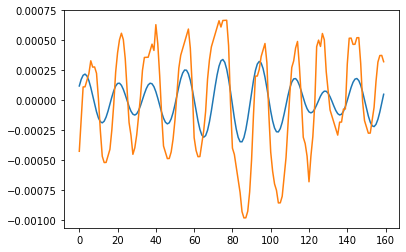

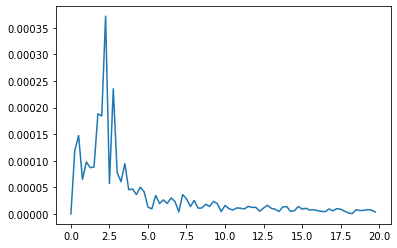

 25 Participant1/2021-07-01/lg_20210701-212116.csv ===========================
Index of row index:  25
Number of Peaks in time based:  20
AMP:  [0.         0.00025782 0.00021442 0.00016335 0.00024735 0.00032046
 0.00037311 0.0000947  0.00011024 0.00013874 0.00061322 0.00022729
 0.00015375 0.00018629 0.00015872 0.00019984 0.00010294 0.00001131
 0.00002946 0.00012662 0.000175   0.00010312 0.00007608 0.00004355
 0.00005677 0.00017776 0.00012866 0.00009885 0.00002141 0.00002983
 0.0001226  0.00008025 0.00005143 0.00002951 0.00003753 0.00004866
 0.00006462 0.00003238 0.00002103 0.00002363 0.00003109 0.00001076
 0.00003781 0.00002618 0.00005009 0.00003232 0.00002866 0.00000399
 0.00000502 0.00003028 0.0000013  0.00002336 0.000009   0.00002066
 0.00002068 0.00000983 0.00001904 0.00001448 0.00002825 0.00000818
 0.00002766 0.00002003 0.00001054 0.00000457 0.00001226 0.00003172
 0.0000048  0.00000688 0.00000662 0.00001942 0.00001491 0.0000062
 0.00001498 0.00001022 0.000013   0.00000905 0.000009

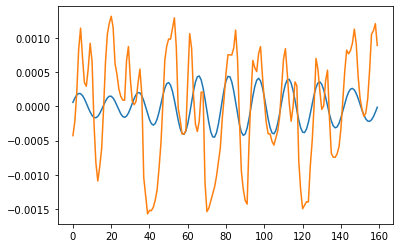

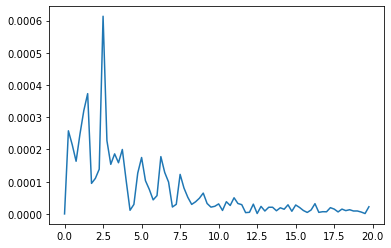

 26 Participant1/2021-07-01/lg_20210701-070904.csv ===========================
Index of row index:  26
Number of Peaks in time based:  20
AMP:  [0.         0.0002196  0.0001183  0.00004584 0.00007242 0.00010896
 0.00014627 0.00016219 0.00001142 0.00020697 0.00011768 0.00018493
 0.00011534 0.00000646 0.00003687 0.00006719 0.00011359 0.00005179
 0.00002615 0.00006523 0.00005419 0.00004971 0.0000609  0.00001354
 0.00002752 0.00003018 0.00005412 0.00007553 0.0000327  0.00001513
 0.00003292 0.00006754 0.00003566 0.00004223 0.00001751 0.00000362
 0.00002084 0.00001035 0.00006291 0.00000603 0.00001657 0.00003861
 0.00002015 0.00002278 0.00002336 0.00001535 0.00001426 0.00001413
 0.00000366 0.00001967 0.00001393 0.00001235 0.00000865 0.00000937
 0.00000644 0.00001137 0.00001478 0.00000625 0.00000912 0.00001601
 0.0000075  0.0000119  0.00000551 0.00000204 0.00000515 0.00000679
 0.00001229 0.0000027  0.00000707 0.00000597 0.00000485 0.00000522
 0.00000827 0.00001344 0.00000907 0.00001864 0.00000

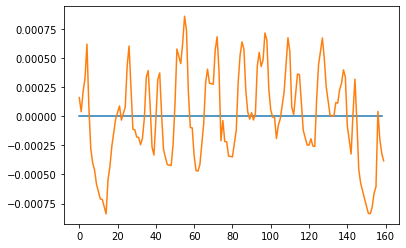

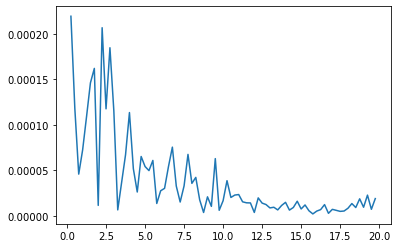

 27 Participant1/2021-06-30/lg_20210630-071412.csv ===========================
Index of row index:  27
Number of Peaks in time based:  11
AMP:  [0.         0.00104566 0.00079693 0.00143126 0.00135493 0.00091242
 0.00095946 0.00065665 0.00250794 0.00210885 0.0026026  0.00233553
 0.0021924  0.00115004 0.00114298 0.00059813 0.00025805 0.00059766
 0.00138873 0.00076078 0.00071457 0.00008368 0.00063091 0.00020193
 0.00020758 0.00007034 0.00007268 0.00058405 0.00059621 0.00028711
 0.00020755 0.00008966 0.00020811 0.00009625 0.00021804 0.00010834
 0.00016629 0.00027827 0.00016984 0.00011571 0.00003041 0.00006808
 0.00015819 0.00010677 0.00012829 0.00008098 0.00015714 0.00010674
 0.00013097 0.00003481 0.00007449 0.00007999 0.00016507 0.0001473
 0.0000488  0.00004676 0.00009551 0.00009649 0.00011692 0.00008737
 0.00004524 0.0000406  0.00015603 0.00014143 0.00006841 0.00004519
 0.00004712 0.00012226 0.00005915 0.00010683 0.00003636 0.00004158
 0.0001418  0.00006423 0.00008736 0.00002924 0.000041

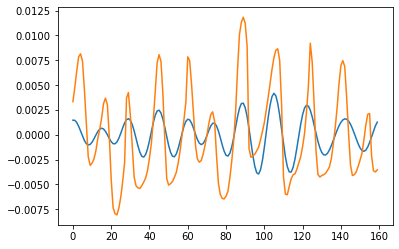

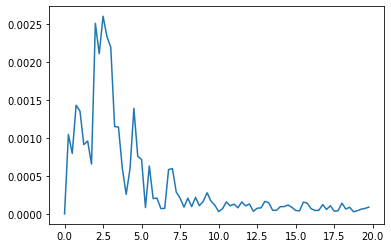

 28 Participant1/2021-06-30/lg_20210630-221335.csv ===========================
Index of row index:  28
Number of Peaks in time based:  15
AMP:  [0.         0.00041915 0.00051691 0.00068826 0.00038172 0.00037617
 0.00041794 0.00067913 0.00024597 0.0008943  0.00146094 0.00117005
 0.00105117 0.00052138 0.00031631 0.0003502  0.00032824 0.00029263
 0.00022716 0.00015478 0.00019495 0.00015805 0.00013715 0.00012797
 0.00007513 0.00007152 0.00009469 0.00005391 0.00012092 0.00024138
 0.00005392 0.00009765 0.00007473 0.00004043 0.00007166 0.0000514
 0.00002391 0.00003323 0.00001979 0.00003962 0.00003135 0.00000424
 0.00000989 0.00002513 0.00007818 0.00002174 0.00002309 0.00002657
 0.00004283 0.00000825 0.00002884 0.00002151 0.00003269 0.00005508
 0.00005195 0.0000247  0.00004631 0.00003847 0.00005813 0.00003995
 0.00005947 0.00004718 0.00003877 0.00004404 0.00002958 0.00003101
 0.00005327 0.000024   0.00003823 0.00001578 0.00002537 0.00001996
 0.00001816 0.00004867 0.00001305 0.00001058 0.000030

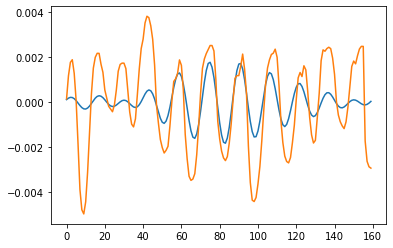

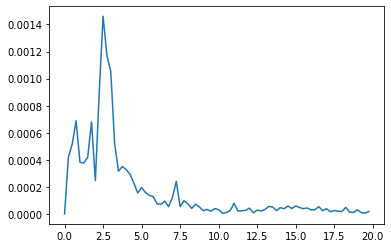

 29 Participant1/2021-06-28/lg_20210628-081600.csv ===========================
Index of row index:  29
Number of Peaks in time based:  7
AMP:  [0.         0.00064269 0.00045162 0.00027044 0.00070307 0.00056558
 0.00186124 0.00340967 0.00113094 0.00028942 0.00044429 0.00014634
 0.00035498 0.00037209 0.0001432  0.00020167 0.0000277  0.00031852
 0.00017007 0.00028189 0.00052675 0.00021724 0.0002619  0.00011596
 0.00010916 0.00010994 0.00009813 0.00022737 0.00012142 0.00008166
 0.00008532 0.00006063 0.00013331 0.000134   0.00009075 0.00011179
 0.00001289 0.0000828  0.0000837  0.00004204 0.00005531 0.00001236
 0.00014346 0.00009549 0.00002145 0.00006406 0.00001344 0.00011049
 0.00012997 0.00002524 0.00006181 0.00001556 0.00007799 0.00005832
 0.00001815 0.0000554  0.00002779 0.00007736 0.00008434 0.0000272
 0.00004607 0.00004042 0.00009029 0.00009388 0.00002344 0.00004721
 0.00000914 0.00007334 0.00006983 0.0000115  0.00006498 0.00001993
 0.00007784 0.00006027 0.00001087 0.00004585 0.0000548

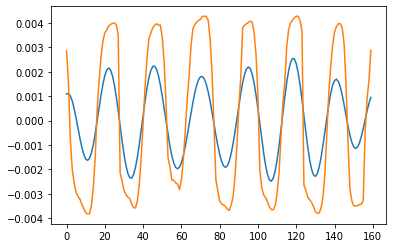

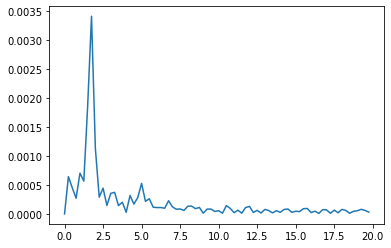

 30 Participant1/2021-06-28/lg_20210628-070900.csv ===========================
Index of row index:  30
Number of Peaks in time based:  11
AMP:  [0.         0.00009708 0.00004653 0.00001519 0.00002967 0.00002588
 0.00007383 0.0001242  0.00029078 0.00007421 0.00022004 0.00006151
 0.00005815 0.00010576 0.00001365 0.0000263  0.00002567 0.00004069
 0.00002365 0.00002056 0.00003438 0.00001194 0.00001708 0.00005548
 0.00005157 0.00001437 0.00003029 0.00002035 0.00001985 0.00002068
 0.00001586 0.000008   0.00001832 0.00000706 0.00000802 0.0000123
 0.00002057 0.00000397 0.00000827 0.00000994 0.00000303 0.00001168
 0.0000234  0.00001459 0.0000101  0.00001817 0.00000801 0.00001261
 0.00000683 0.00000578 0.00001026 0.00000688 0.00000653 0.00000392
 0.00001012 0.00000522 0.00000963 0.00001094 0.00000682 0.00000493
 0.00000492 0.00000193 0.00000786 0.00001392 0.00000492 0.00000513
 0.0000014  0.00000244 0.00000731 0.00000645 0.00000668 0.00000456
 0.00000386 0.00000217 0.00000983 0.00001329 0.000002

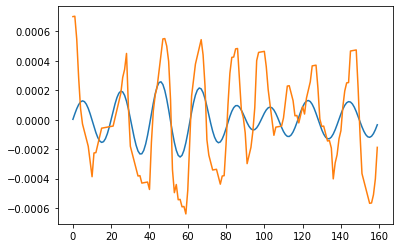

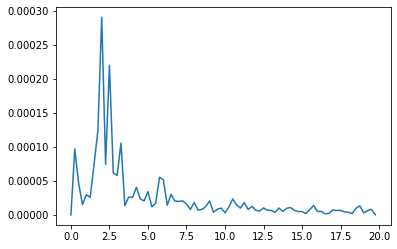

 31 Participant1/2021-06-29/lg_20210629-063713.csv ===========================
Index of row index:  31
Number of Peaks in time based:  14
AMP:  [0.         0.00025151 0.00016239 0.00035406 0.0001329  0.00008451
 0.00032948 0.00023077 0.00024553 0.00018482 0.00007889 0.00043609
 0.00030667 0.0003206  0.00012034 0.0000795  0.00007534 0.00003293
 0.00003911 0.00006685 0.00008073 0.00011435 0.0000911  0.00005823
 0.00001002 0.00002221 0.00007514 0.00008001 0.0000115  0.00002178
 0.00003248 0.00003031 0.00006727 0.00002329 0.00001663 0.000018
 0.00002191 0.00004696 0.00001979 0.00004267 0.00003156 0.00003394
 0.00001631 0.00001586 0.00003959 0.00000909 0.00003575 0.00002045
 0.00001521 0.00001962 0.0000214  0.00004546 0.00001451 0.00002076
 0.0000189  0.00002615 0.00002078 0.00000605 0.00002817 0.00002347
 0.0000175  0.00000415 0.00001686 0.00001414 0.00001287 0.00001194
 0.00000988 0.00000493 0.00000993 0.00002131 0.00001996 0.00000418
 0.0000045  0.00000825 0.00001006 0.00001853 0.0000043

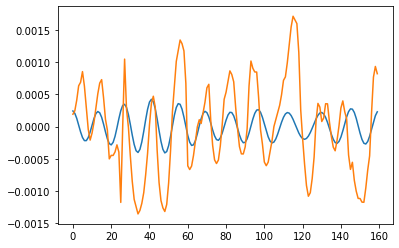

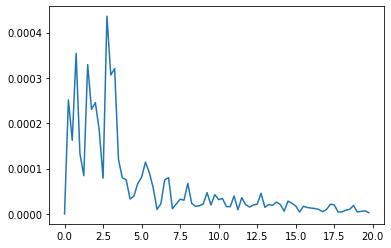

 32 Participant1/2021-06-29/lg_20210629-194025.csv ===========================
Index of row index:  32
Number of Peaks in time based:  15
AMP:  [0.         0.00019384 0.0001167  0.00015967 0.00024468 0.00023311
 0.00055203 0.00018033 0.00018115 0.0000265  0.00048219 0.00041489
 0.00035395 0.00022074 0.0000664  0.00016033 0.00005423 0.00004222
 0.00002942 0.00005647 0.00010681 0.00008144 0.00010003 0.00009551
 0.0000698  0.00005913 0.00006892 0.0000325  0.00003682 0.00010602
 0.00003278 0.00005952 0.00005609 0.00006451 0.00004003 0.00005034
 0.00001161 0.00003185 0.00003114 0.00002997 0.00005234 0.00001607
 0.00003566 0.00002295 0.0000334  0.00001262 0.00002347 0.0000317
 0.00001847 0.00001134 0.00001816 0.00002912 0.00003858 0.00000964
 0.00000241 0.00001557 0.00002544 0.00003098 0.00000965 0.00000753
 0.00000075 0.00001781 0.00002212 0.00002477 0.00002515 0.0000084
 0.00002163 0.00001161 0.00002317 0.00002755 0.00001133 0.0000119
 0.0000119  0.00002828 0.00001059 0.00002078 0.00001009

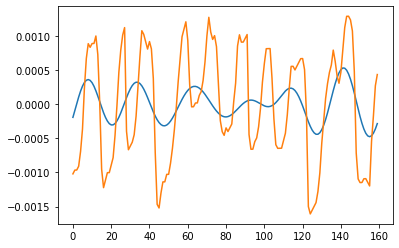

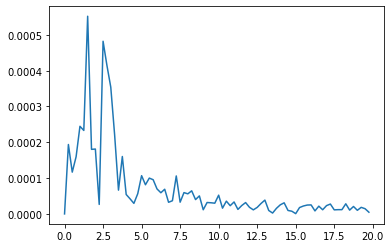

 33 Participant1/2021-06-27/lg_20210627-122353.csv ===========================
Index of row index:  33
Number of Peaks in time based:  12
AMP:  [0.         0.00010797 0.00006144 0.00017534 0.00007459 0.00007702
 0.00020929 0.00023558 0.00006449 0.00055642 0.00061468 0.00035294
 0.000168   0.00003707 0.00007237 0.00011225 0.00001446 0.00002173
 0.00002539 0.00010542 0.00005266 0.00005469 0.0000645  0.00000896
 0.00002426 0.00005924 0.00003112 0.00002844 0.00003033 0.00004619
 0.00000606 0.00002488 0.00001656 0.00000926 0.00002629 0.00004069
 0.0000209  0.00001017 0.00002586 0.00002286 0.00001861 0.00003404
 0.00000977 0.00002259 0.00001919 0.00001853 0.00000355 0.00001947
 0.0000106  0.00001429 0.0000212  0.00001066 0.00001107 0.00001201
 0.00000942 0.00001759 0.00000512 0.00000951 0.00000945 0.00001734
 0.00001718 0.00000953 0.00000359 0.00000042 0.00001474 0.00001132
 0.00001541 0.00001015 0.00001273 0.00001267 0.00001309 0.00000881
 0.0000053  0.00001043 0.00000736 0.00002053 0.00000

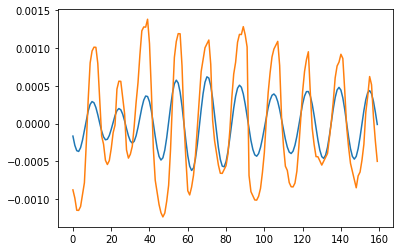

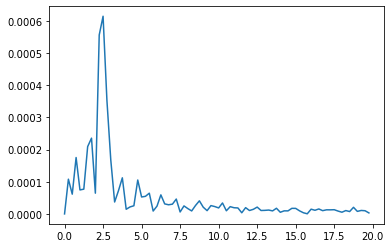

 34 Participant1/2021-06-27/lg_20210627-093647.csv ===========================
Index of row index:  34
Number of Peaks in time based:  10
AMP:  [0.         0.00026843 0.00009866 0.00013798 0.00019898 0.00030223
 0.00029345 0.00038915 0.00036919 0.00018035 0.00174414 0.00012152
 0.00008741 0.00007294 0.00013358 0.00021701 0.00005527 0.00011084
 0.00009401 0.00004319 0.00023646 0.00003019 0.00005108 0.00005157
 0.00009596 0.00016956 0.0000886  0.00003466 0.00002785 0.00002487
 0.00009376 0.00004848 0.00000541 0.0000026  0.00004659 0.00004385
 0.00004449 0.00001058 0.00000365 0.00001068 0.00010205 0.00003365
 0.00001269 0.00001118 0.0000357  0.00006002 0.00001511 0.00001438
 0.00001594 0.00004011 0.00003196 0.00001358 0.00000835 0.00002272
 0.00002832 0.00002865 0.00001095 0.00002788 0.00001347 0.00001917
 0.00001275 0.00002808 0.00001714 0.00001978 0.00001234 0.00003023
 0.00001953 0.0000202  0.00001515 0.00000288 0.00003702 0.00001769
 0.00001682 0.00000909 0.00001714 0.00004377 0.00001

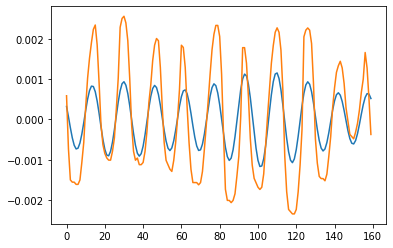

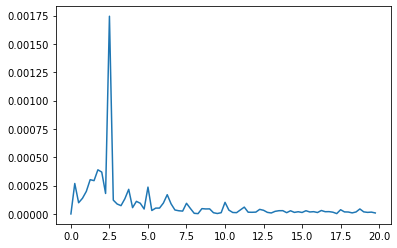

 35 Participant1/2021-07-04/lg_20210704-145340.csv ===========================
Index of row index:  35
Number of Peaks in time based:  13
AMP:  [0.         0.00031376 0.00022649 0.00015544 0.00041461 0.0002268
 0.00032203 0.000207   0.00052727 0.00029159 0.00026025 0.0004807
 0.00064861 0.00048717 0.00028699 0.00012656 0.00001127 0.00018679
 0.00013367 0.0001161  0.00008721 0.0001395  0.00005776 0.00006746
 0.00008703 0.00014869 0.00012832 0.00008174 0.00002739 0.00005785
 0.00004718 0.00006405 0.00006506 0.00001553 0.000027   0.00002927
 0.00005272 0.00004174 0.00003795 0.00002178 0.00001486 0.00003673
 0.00002579 0.00000193 0.00003004 0.00001273 0.00001749 0.00000752
 0.00004358 0.00002347 0.0000104  0.00000905 0.00000956 0.00003049
 0.00002369 0.00002462 0.00002457 0.00002481 0.0000331  0.0000198
 0.00003064 0.00003587 0.00003115 0.00002666 0.0000263  0.00003215
 0.00003764 0.00003826 0.00001338 0.00000761 0.00002494 0.00002849
 0.00002836 0.00001587 0.000005   0.00001891 0.00003488

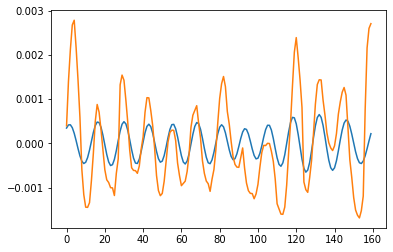

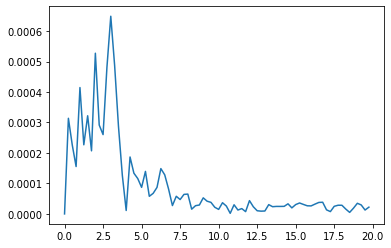

 36 Participant1/2021-07-04/lg_20210704-074924.csv ===========================
Index of row index:  36
Number of Peaks in time based:  16
AMP:  [0.         0.00040645 0.00020692 0.00018116 0.00014303 0.00015239
 0.00030092 0.00059452 0.00022248 0.00013605 0.00030346 0.00009108
 0.00045604 0.00016338 0.00008105 0.00007826 0.00014295 0.00004834
 0.00012272 0.00008241 0.00013333 0.0000323  0.00006011 0.0001144
 0.00000784 0.00000977 0.00004648 0.00005716 0.00000192 0.00004545
 0.00003275 0.00005244 0.00001797 0.00004033 0.00002124 0.00002385
 0.00003898 0.00001529 0.00001182 0.00002637 0.00001324 0.00001587
 0.00001127 0.00001218 0.00002805 0.00001894 0.00001008 0.00001739
 0.0000224  0.00002146 0.00000584 0.00001258 0.00000393 0.00001267
 0.00001879 0.00000278 0.00000822 0.00002565 0.00001908 0.00001531
 0.00001111 0.00001831 0.00001552 0.00001781 0.00001585 0.00001585
 0.00001703 0.00000528 0.00000351 0.00000686 0.00001599 0.00001898
 0.00001816 0.00001946 0.00002117 0.00000965 0.000019

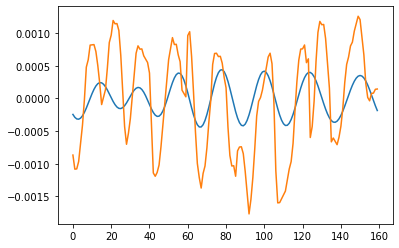

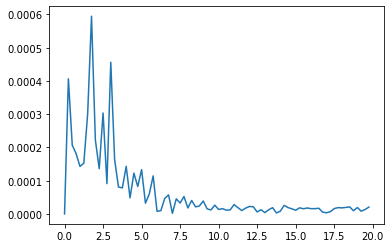

 37 Participant1/2021-07-03/lg_20210703-070405.csv ===========================
Index of row index:  37
Number of Peaks in time based:  19
AMP:  [0.         0.00013413 0.00009458 0.00006881 0.00000776 0.00001056
 0.00008453 0.00003395 0.00009825 0.00003101 0.00000399 0.00009797
 0.00003245 0.00002953 0.00002839 0.00004083 0.00002179 0.00003683
 0.00001611 0.00001148 0.00001428 0.00001477 0.0000211  0.00000991
 0.00000324 0.00001958 0.00001565 0.000021   0.00002234 0.0000068
 0.00001446 0.00000576 0.00001269 0.0000038  0.00001375 0.00000224
 0.00000592 0.00000791 0.00000547 0.00000567 0.00000904 0.00000735
 0.00000268 0.00000501 0.00000721 0.0000065  0.00000979 0.00000463
 0.00000791 0.00000889 0.00000591 0.00000322 0.00000382 0.00000606
 0.00000655 0.00000606 0.00000183 0.00000819 0.00000698 0.00000458
 0.00000417 0.00000826 0.00000465 0.0000098  0.00000535 0.00000462
 0.00000383 0.00000246 0.00000203 0.000004   0.00000207 0.00000212
 0.00000317 0.00000213 0.00001227 0.00000188 0.000005

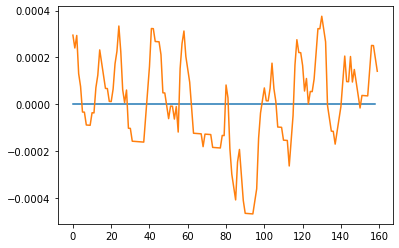

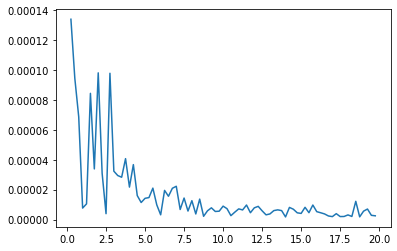

 38 Participant1/2021-07-02/lg_20210702-065005.csv ===========================
Index of row index:  38
Number of Peaks in time based:  19
AMP:  [0.         0.00008314 0.00013257 0.00009323 0.00006604 0.00004628
 0.00005056 0.00009396 0.00008395 0.00010441 0.00004188 0.00011067
 0.00008372 0.00009615 0.00002195 0.00003604 0.00004981 0.00002946
 0.00006145 0.00001915 0.00000521 0.00000927 0.00004835 0.00004693
 0.00004249 0.00003658 0.00002365 0.00003752 0.00001105 0.00001829
 0.00002334 0.00002038 0.00003857 0.00001234 0.000019   0.00000075
 0.00002859 0.00001868 0.00001687 0.00001575 0.00001619 0.00002033
 0.00001328 0.00000555 0.00001836 0.00001407 0.00000935 0.00000854
 0.00000823 0.00000671 0.0000111  0.00001368 0.00000857 0.00001589
 0.0000088  0.000017   0.00001175 0.00001229 0.00001044 0.0000051
 0.00001717 0.00000692 0.00000164 0.00001094 0.00000939 0.00000885
 0.00000607 0.00000426 0.00001457 0.00000696 0.0000025  0.0000084
 0.00000432 0.00000443 0.00000429 0.00000386 0.0000094

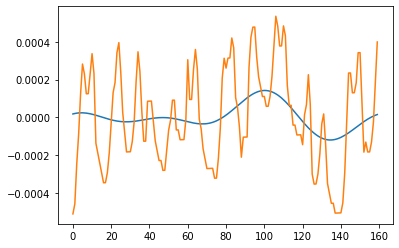

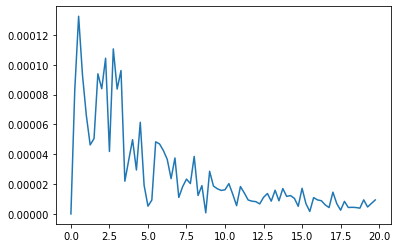

 39 Participant1/2021-07-02/lg_20210702-185148.csv ===========================
Index of row index:  39
Number of Peaks in time based:  20
AMP:  [0.         0.00016963 0.00013612 0.00013689 0.00002976 0.00005472
 0.00011447 0.00020261 0.00022588 0.00014299 0.00008826 0.00019498
 0.00016099 0.00010726 0.00007653 0.00010259 0.00006608 0.00002894
 0.00001364 0.00001445 0.00002176 0.00001508 0.00001194 0.0000286
 0.00003729 0.00002188 0.00003501 0.00003919 0.00004585 0.00000857
 0.00001284 0.00002575 0.00003214 0.00003391 0.00001625 0.00003081
 0.00001303 0.0000323  0.00003385 0.00000137 0.00001991 0.00001819
 0.00000796 0.00003203 0.00001418 0.0000101  0.00000777 0.00002087
 0.00001113 0.00003012 0.00001758 0.00001209 0.00001455 0.00001597
 0.00000801 0.0000081  0.00001032 0.00001165 0.00000558 0.00000899
 0.00000386 0.00000298 0.00001902 0.00000928 0.00001844 0.00001387
 0.00000829 0.00001342 0.00001602 0.00000925 0.00000355 0.00001796
 0.00001067 0.00000833 0.00000823 0.00000501 0.000004

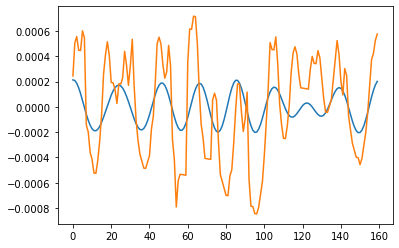

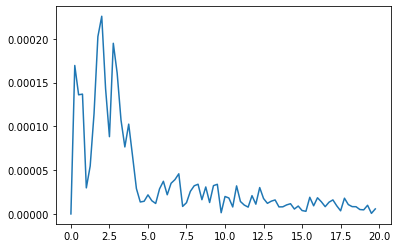

 40 Participant1/2021-07-05/lg_20210705-191026.csv ===========================
Index of row index:  40
Number of Peaks in time based:  15
AMP:  [0.         0.00003278 0.00012535 0.0000373  0.0000383  0.00011079
 0.00004755 0.00010753 0.00009812 0.00012634 0.00013234 0.00008803
 0.00016156 0.00007054 0.00004249 0.00001048 0.00002734 0.00003323
 0.00005758 0.0000225  0.00000856 0.00001125 0.00002108 0.00001145
 0.0000092  0.00001455 0.00000743 0.00000689 0.00001407 0.00003333
 0.00001941 0.00002677 0.00002792 0.00000681 0.0000153  0.0000162
 0.00000977 0.00001223 0.00000434 0.00000328 0.00000721 0.00000751
 0.00000626 0.00000237 0.00001058 0.00000808 0.00000707 0.00000709
 0.0000153  0.00000773 0.00000443 0.00000256 0.00000527 0.00000157
 0.00000723 0.0000134  0.00000222 0.00000984 0.00000525 0.00000189
 0.00000265 0.00000337 0.00000791 0.00000176 0.00000817 0.00000318
 0.000006   0.00000702 0.00000405 0.00000302 0.00000305 0.00000443
 0.00000566 0.0000023  0.00000408 0.00000729 0.000009

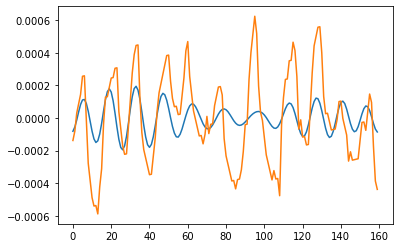

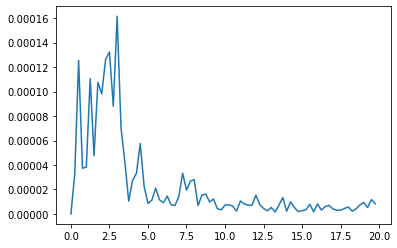

 41 Participant1/2021-07-05/lg_20210705-125950.csv ===========================
Index of row index:  41
Number of Peaks in time based:  22
AMP:  [0.         0.00016033 0.00034925 0.0003085  0.00063651 0.00015009
 0.00024783 0.00048343 0.00053103 0.00034749 0.00056284 0.0003541
 0.00090757 0.00031091 0.00009738 0.00007162 0.00029808 0.00039768
 0.0001101  0.00006211 0.00011762 0.00021519 0.00009369 0.0001942
 0.00004402 0.00009223 0.00003365 0.00015604 0.00003179 0.00012591
 0.00011311 0.00007364 0.00008346 0.00006996 0.00008434 0.00008349
 0.00010209 0.00006033 0.00004989 0.00004304 0.00004421 0.00005277
 0.00007048 0.00001576 0.00008475 0.00004616 0.00005512 0.00007804
 0.00001055 0.00004186 0.00001827 0.00003623 0.00004199 0.0000267
 0.00002743 0.00004424 0.00002134 0.00004639 0.0000371  0.00000885
 0.00001507 0.00001584 0.00002796 0.0000318  0.00001618 0.0000189
 0.00002602 0.00001691 0.00002939 0.00001714 0.00002279 0.00002642
 0.00000381 0.00002691 0.00002319 0.00001729 0.00003352 

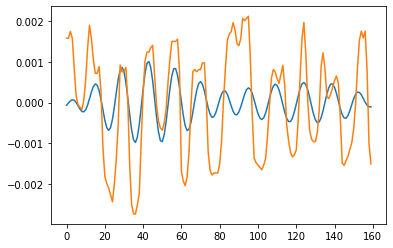

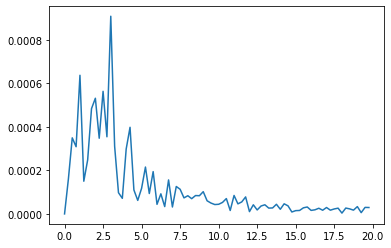

In [108]:

results_p1, peak2peak_diff_freq_list1, peak2peak_diff_time_list1 = read_iotex_data("Participant1","results_p1.csv")



 0 Participant2/2021-07-06/rg_20210706-105513.csv ===========================
Index of row index:  0
Number of Peaks in time based:  25
AMP:  [0.         0.00010881 0.00009277 0.0001218  0.00004259 0.00009902
 0.00004044 0.00008278 0.00034183 0.0001147  0.00008715 0.00008147
 0.00004352 0.00001516 0.00002414 0.00003737 0.00008619 0.00003305
 0.00003555 0.00004435 0.00002035 0.00001068 0.00001712 0.0000193
 0.00005373 0.0000329  0.00002501 0.00001666 0.00001716 0.00001515
 0.00000676 0.00001865 0.00003109 0.00002344 0.0000112  0.00001093
 0.00002666 0.00001097 0.00002827 0.00001548 0.00001837 0.00001101
 0.00003049 0.00000874 0.00002675 0.00002818 0.00002157 0.00000737
 0.00001934 0.00000914 0.00001476 0.00000763 0.00001471 0.00000883
 0.00000853 0.00001331 0.00002221 0.00001589 0.00001164 0.00000382
 0.00000335 0.00000463 0.00000758 0.00001765 0.00000637 0.00000618
 0.00000512 0.00000571 0.00002835 0.0000138  0.00000363 0.00001465
 0.00001398 0.00000916 0.00001087 0.00000989 0.00001112

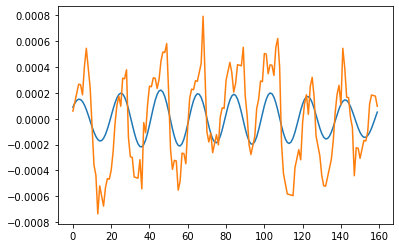

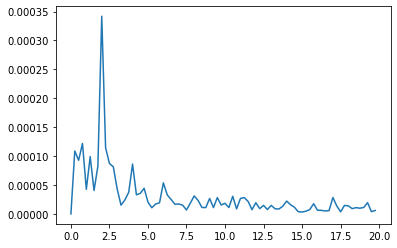

 1 Participant2/2021-07-06/rg_20210706-095943.csv ===========================
Index of row index:  1
Number of Peaks in time based:  26
AMP:  [0.         0.00020395 0.00003823 0.00014045 0.00009183 0.00004321
 0.00006973 0.0004218  0.00009186 0.0000357  0.00002565 0.00000836
 0.00005042 0.00002809 0.00009241 0.00003209 0.00000404 0.00001136
 0.00000649 0.0000295  0.00006104 0.00006156 0.00002272 0.0000279
 0.00001804 0.00002893 0.00003207 0.00003241 0.00005294 0.00001056
 0.00001363 0.00001579 0.00001889 0.00003541 0.00004029 0.00001323
 0.00000723 0.00000553 0.00002074 0.00001281 0.00001413 0.00002447
 0.0000335  0.00002076 0.00001239 0.00002277 0.00001242 0.00000909
 0.0000269  0.00002179 0.00001338 0.00002132 0.00002428 0.00002069
 0.00001523 0.00000993 0.00001938 0.00001195 0.00000753 0.00001596
 0.00001515 0.00000588 0.00001173 0.00000987 0.00001111 0.00001071
 0.0000022  0.00001936 0.00000933 0.00000569 0.00001605 0.00000516
 0.00001272 0.00000316 0.00000313 0.00000208 0.00000066

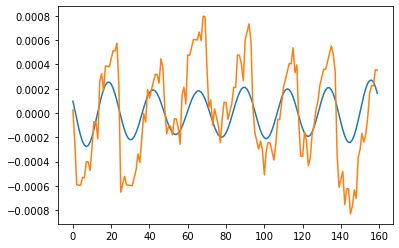

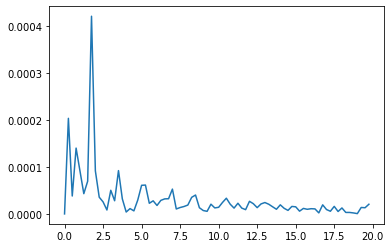

 2 Participant2/2021-07-01/rg_20210701-001106.csv ===========================
Index of row index:  2
Number of Peaks in time based:  22
AMP:  [0.         0.00019466 0.00009661 0.00007803 0.00016773 0.00005577
 0.00006701 0.00010069 0.00022281 0.000178   0.00007591 0.00001186
 0.00004439 0.00001704 0.00002949 0.00002678 0.00005661 0.00008894
 0.00003534 0.00000561 0.00004256 0.00004018 0.00001981 0.00002001
 0.00005669 0.0000349  0.00004779 0.00000678 0.00001671 0.00001031
 0.00001154 0.00000961 0.00003202 0.00002573 0.00001861 0.00002658
 0.00001479 0.00002656 0.00001903 0.00002299 0.00001904 0.00000716
 0.00000475 0.00001041 0.00001338 0.00000685 0.00000313 0.00001187
 0.00001765 0.00002202 0.0000292  0.00000063 0.00000958 0.00002123
 0.00000764 0.00001607 0.00002032 0.00001695 0.00002061 0.00000853
 0.0000188  0.00001816 0.0000104  0.00001185 0.00001565 0.00000661
 0.00000876 0.00000208 0.00000174 0.00001278 0.00000584 0.00001138
 0.00000835 0.00000839 0.00000261 0.00001379 0.0000123

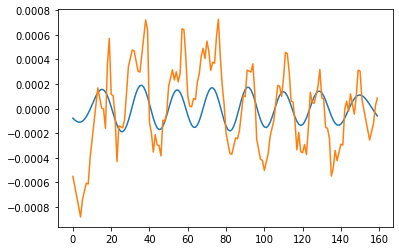

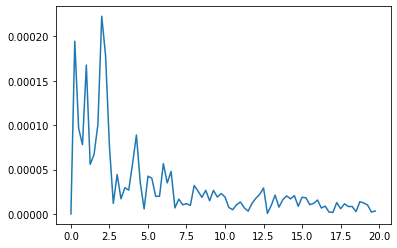

 3 Participant2/2021-07-01/rg_20210701-092555.csv ===========================
Index of row index:  3
Number of Peaks in time based:  18
AMP:  [0.         0.00010021 0.00014373 0.00003304 0.00016295 0.00008794
 0.00011806 0.00049664 0.000066   0.00006173 0.00002246 0.00004717
 0.00012315 0.00006698 0.00017373 0.000075   0.00008233 0.00006948
 0.00003305 0.00009885 0.00004098 0.00011697 0.00004603 0.00005362
 0.00007531 0.00002542 0.00008968 0.0000187  0.00007983 0.0000201
 0.00005743 0.00006068 0.00002102 0.00006562 0.00000404 0.00003497
 0.00003278 0.00002994 0.00006103 0.000019   0.00004043 0.000013
 0.00006613 0.0000169  0.00001163 0.00002971 0.00002249 0.00000965
 0.0000173  0.00002434 0.00002323 0.00002225 0.00002837 0.00002538
 0.00000726 0.00001443 0.00002688 0.00003699 0.00000873 0.00001292
 0.00002936 0.00002046 0.00000685 0.0000099  0.00001894 0.00001514
 0.00001527 0.00001202 0.00000918 0.00001232 0.00001653 0.00001212
 0.00001768 0.00001316 0.00000526 0.00001259 0.00001014 0

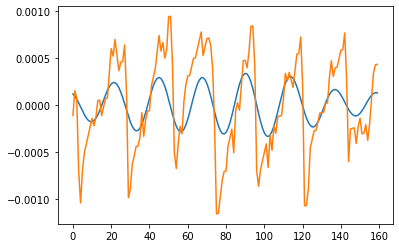

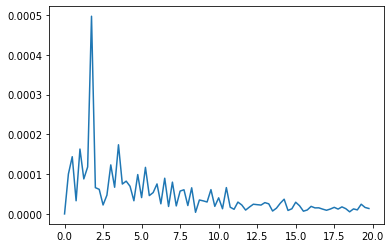

 4 Participant2/2021-07-08/rg_20210708-213728.csv ===========================
Index of row index:  4
Number of Peaks in time based:  28
AMP:  [0.         0.00005301 0.00012263 0.0000581  0.00004684 0.0000371
 0.00007568 0.0000723  0.00007045 0.00004403 0.00003807 0.00001665
 0.00001329 0.00001219 0.00004462 0.0000455  0.0000381  0.00002618
 0.00000252 0.00001534 0.00002451 0.00005382 0.00002265 0.0000185
 0.00003379 0.00002221 0.0000181  0.00001842 0.00001997 0.00002539
 0.00001059 0.00001968 0.00000625 0.00000842 0.00003253 0.00001441
 0.00001515 0.00001281 0.000008   0.00001332 0.00001575 0.00001576
 0.00001153 0.000014   0.00001755 0.00000357 0.00001972 0.00000445
 0.0000158  0.00000323 0.00001723 0.00000515 0.00000878 0.00001245
 0.00000889 0.00001802 0.00002109 0.00001935 0.00001728 0.00001789
 0.00000623 0.00001381 0.00000663 0.00001316 0.00000147 0.00001083
 0.00001538 0.00001607 0.00001631 0.00001057 0.00001782 0.00001812
 0.00000968 0.00001323 0.00000626 0.00000399 0.00000436 

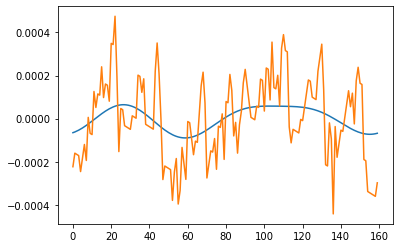

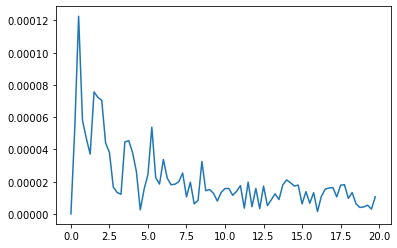

 6 Participant2/2021-06-28/rg_20210628-153436.csv ===========================
Index of row index:  6
Number of Peaks in time based:  21
AMP:  [0.         0.00025475 0.00013044 0.00029261 0.00024989 0.00004815
 0.00010996 0.00057298 0.00033273 0.00010834 0.00005086 0.00002513
 0.00005119 0.00004974 0.00009846 0.00013245 0.00007467 0.00005037
 0.0000412  0.00006793 0.00002353 0.0000585  0.00009519 0.00002747
 0.00002172 0.00004257 0.00002014 0.00002473 0.00003183 0.00004349
 0.00002004 0.00001061 0.000013   0.00001619 0.00002274 0.00002007
 0.0000223  0.00001743 0.00001271 0.00001162 0.00000481 0.00001096
 0.00001143 0.0000236  0.00000404 0.00001105 0.00000383 0.00002136
 0.00000192 0.00000263 0.00002124 0.00000423 0.00001865 0.00000915
 0.00001047 0.00001138 0.00000498 0.00000996 0.00000667 0.00001095
 0.00001549 0.00001366 0.00000423 0.00000785 0.00001148 0.00000692
 0.00001264 0.00000592 0.00001319 0.0000043  0.00000458 0.00000288
 0.00000032 0.00001858 0.00000281 0.00000617 0.0000057

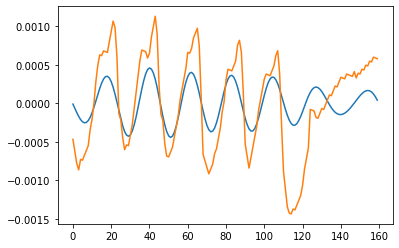

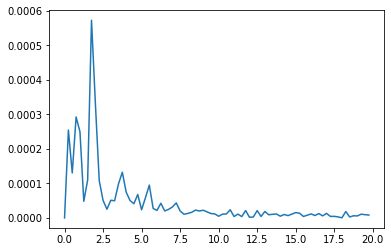

 7 Participant2/2021-06-28/rg_20210628-151121.csv ===========================
Index of row index:  7
Number of Peaks in time based:  17
AMP:  [0.         0.00044121 0.00008898 0.00015648 0.00010692 0.00006006
 0.00009047 0.00049875 0.00052861 0.00042927 0.00025732 0.00016968
 0.00012375 0.00011406 0.00009062 0.00008226 0.00011052 0.00003659
 0.00003728 0.00003435 0.00000237 0.00005895 0.00001759 0.0000641
 0.000057   0.00001727 0.00000383 0.00001606 0.00002553 0.00002071
 0.0000299  0.00004207 0.00005607 0.00001242 0.00000348 0.00000961
 0.00001148 0.00003974 0.0000208  0.00002057 0.00000699 0.00000983
 0.00001843 0.00001823 0.00001088 0.00000321 0.00001053 0.00001849
 0.00002371 0.00000863 0.00002143 0.00001625 0.0000072  0.00002072
 0.0000213  0.00000719 0.00001799 0.00001232 0.00001009 0.00000918
 0.00000655 0.00000955 0.00001398 0.00001801 0.00001628 0.00000721
 0.0000215  0.00001418 0.0000104  0.00001465 0.00000516 0.00001302
 0.00002313 0.00001422 0.00000664 0.00000504 0.0000094 

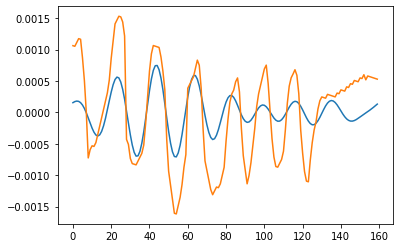

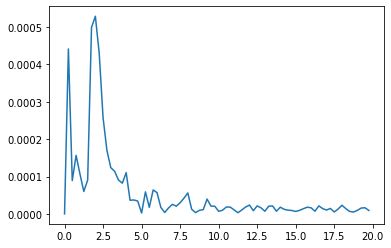

 8 Participant2/2021-07-04/rg_20210704-080419.csv ===========================
Index of row index:  8
Number of Peaks in time based:  27
AMP:  [0.         0.00012553 0.00001657 0.00002468 0.00002761 0.00001604
 0.00004227 0.00008985 0.0001587  0.00004415 0.0000254  0.00003975
 0.00003072 0.0000235  0.00001807 0.0000773  0.00001711 0.00001652
 0.00003616 0.0000218  0.00005964 0.00002239 0.00003598 0.0000377
 0.00001461 0.00004339 0.00001022 0.00000611 0.00003083 0.00002913
 0.00004015 0.00001399 0.00001889 0.00001459 0.00002679 0.00003159
 0.00000189 0.0000048  0.00000982 0.00000193 0.00003492 0.00003023
 0.00001241 0.00001741 0.00001187 0.0000167  0.00000278 0.0000253
 0.00000967 0.00000558 0.0000153  0.00002329 0.00001037 0.00001034
 0.00000746 0.00000408 0.00001514 0.00000275 0.00000797 0.00001307
 0.00001114 0.00000692 0.00002299 0.00001128 0.00000521 0.0000205
 0.00000379 0.00001491 0.00001415 0.00001358 0.00000657 0.00000283
 0.00001204 0.00000825 0.00001051 0.00001032 0.00000259 0

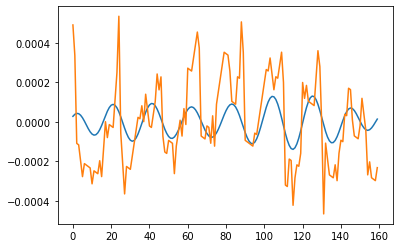

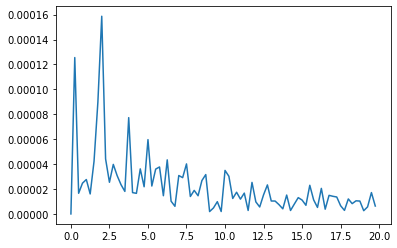

 11 Participant2/2021-07-02/rg_20210702-144253.csv ===========================
Index of row index:  11
Number of Peaks in time based:  33
AMP:  [0.         0.00012887 0.00013248 0.00006317 0.00004406 0.00005344
 0.00011428 0.00011103 0.0002187  0.00004731 0.0000239  0.0000502
 0.00009805 0.00004706 0.00006326 0.00003872 0.00002306 0.00005161
 0.00004946 0.0000176  0.00002209 0.00007125 0.0000472  0.00001921
 0.00003152 0.00002462 0.00003754 0.0000342  0.00004044 0.00002161
 0.00002552 0.00007291 0.0000456  0.00008019 0.00003824 0.00004972
 0.000039   0.00004166 0.0000311  0.00005627 0.00001296 0.00002068
 0.00002802 0.00004438 0.00001355 0.00003158 0.00004379 0.00001925
 0.00003184 0.00005368 0.00000911 0.0000328  0.00000325 0.00002866
 0.00003855 0.00002777 0.00001357 0.0000262  0.00001329 0.00001676
 0.00001264 0.0000154  0.0000125  0.00002368 0.00004433 0.00002589
 0.00003585 0.00002262 0.00000851 0.00002271 0.00001169 0.00000945
 0.00002366 0.00001644 0.00001558 0.00001173 0.000013

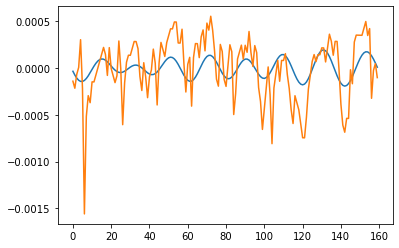

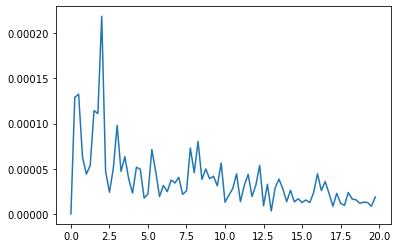

 12 Participant2/2021-07-02/rg_20210702-171944.csv ===========================
Index of row index:  12
Number of Peaks in time based:  31
AMP:  [0.         0.00020794 0.00011545 0.00007233 0.000034   0.00006237
 0.00001064 0.00002607 0.00006349 0.00003932 0.00001741 0.00001699
 0.00001444 0.00002658 0.00001239 0.00002295 0.00001992 0.00002411
 0.00004503 0.00000634 0.00000149 0.0000306  0.00001813 0.00004961
 0.0000284  0.00003462 0.00002145 0.00001081 0.00000736 0.00000726
 0.00000629 0.00003409 0.00002689 0.00001866 0.00001826 0.00001096
 0.00001374 0.00000947 0.00001241 0.00002952 0.00000068 0.00002124
 0.00001284 0.00001508 0.00002846 0.00001612 0.00001376 0.00001805
 0.00000052 0.00002375 0.0000182  0.00002779 0.00002458 0.00003202
 0.00000129 0.00001836 0.00002493 0.00000459 0.00000271 0.00001575
 0.00000747 0.00001141 0.00001144 0.00001419 0.00001062 0.0000212
 0.00000081 0.0000187  0.00001674 0.00001676 0.00001187 0.00001202
 0.00001396 0.00001143 0.00000447 0.00000466 0.000009

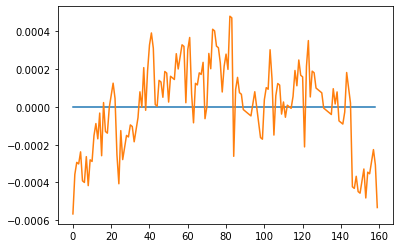

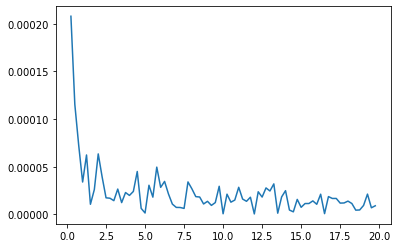

 13 Participant2/2021-07-05/rg_20210705-100219.csv ===========================
Index of row index:  13
Number of Peaks in time based:  10
AMP:  [0.         0.00045529 0.00032151 0.00033041 0.00007341 0.00022252
 0.00017098 0.00064383 0.00012115 0.00007115 0.00004639 0.00003283
 0.0001188  0.00008195 0.00010552 0.00004989 0.00005487 0.00006184
 0.00004158 0.00006154 0.00006196 0.0000878  0.00001635 0.00001832
 0.00004301 0.00005503 0.00002382 0.00003002 0.00004888 0.00003036
 0.00000685 0.00003957 0.00004523 0.00001791 0.00002005 0.00001378
 0.0000167  0.0000103  0.00002905 0.00001698 0.00001819 0.00003865
 0.00001528 0.00000207 0.0000032  0.00001032 0.00001304 0.00001821
 0.00001178 0.00001825 0.00001358 0.00001203 0.00000229 0.00002355
 0.00001102 0.00001279 0.00000826 0.00000538 0.00000875 0.00001426
 0.0000017  0.0000091  0.00000698 0.00001408 0.00000953 0.00000341
 0.00000432 0.0000076  0.00002157 0.00000592 0.00000743 0.00000261
 0.00001299 0.0000078  0.00000422 0.00001268 0.00000

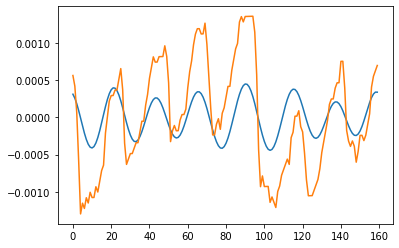

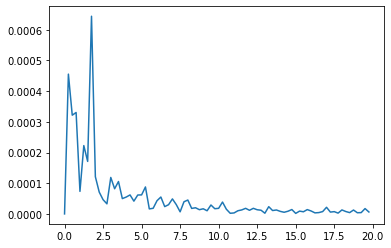

 14 Participant2/2021-07-05/rg_20210705-105203.csv ===========================
Index of row index:  14
Number of Peaks in time based:  27
AMP:  [0.         0.00000474 0.00003381 0.00005836 0.0001017  0.00003492
 0.00005445 0.00014091 0.00000975 0.00003578 0.00002742 0.00001049
 0.00002897 0.00002477 0.00009351 0.00000764 0.00002272 0.00001195
 0.00003629 0.00002606 0.00002941 0.00007188 0.00003307 0.00001081
 0.00001808 0.00001496 0.00001191 0.00001483 0.00004068 0.00002579
 0.00001135 0.00001502 0.00001575 0.00001313 0.00001034 0.00002157
 0.00001375 0.00001177 0.00001121 0.00001305 0.00001172 0.00000772
 0.00001465 0.00001473 0.00000109 0.0000135  0.00000372 0.00001674
 0.00001556 0.00002191 0.00001376 0.00001452 0.00000939 0.0000105
 0.00002009 0.00000127 0.00003207 0.0000053  0.0000036  0.00003207
 0.00001044 0.00001253 0.00000846 0.00000734 0.00001115 0.00001412
 0.00001973 0.0000065  0.00001354 0.00000763 0.00001364 0.00001198
 0.00000181 0.00000633 0.00001631 0.00000992 0.000009

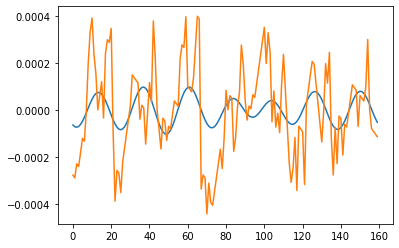

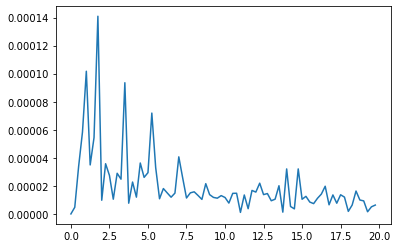

 15 Participant2/2021-07-06/lg_20210706-105513.csv ===========================
Index of row index:  15
Number of Peaks in time based:  35
AMP:  [0.         0.00003535 0.00008978 0.00004775 0.00007668 0.00003963
 0.00004227 0.00001211 0.00006292 0.00005571 0.00003529 0.00002583
 0.00002661 0.00001918 0.00001781 0.00000949 0.00001507 0.00000781
 0.0000165  0.00001137 0.00000574 0.00002804 0.00000453 0.0000124
 0.00000407 0.00000964 0.00000221 0.0000063  0.00001339 0.00000259
 0.00001836 0.0000057  0.00001427 0.0000108  0.00001016 0.00000132
 0.000016   0.00001483 0.00000839 0.0000242  0.0000033  0.00000905
 0.00001002 0.00000379 0.00001629 0.00000889 0.00001591 0.0000115
 0.00001473 0.00001262 0.00000331 0.00000574 0.00001419 0.0000045
 0.00001915 0.00001453 0.00000703 0.00001689 0.00000526 0.00001728
 0.00000453 0.00000498 0.00000581 0.00001158 0.00002113 0.00000868
 0.0000088  0.00000497 0.00000578 0.00001125 0.00000426 0.00001333
 0.00001067 0.00001024 0.00001266 0.00001821 0.00001206

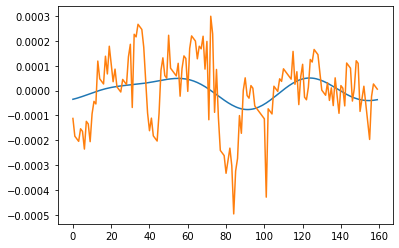

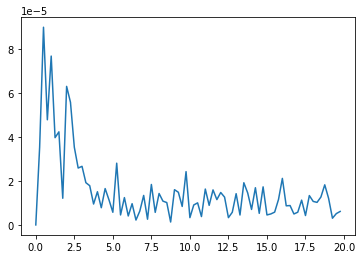

 18 Participant2/2021-07-01/lg_20210701-001106.csv ===========================
Index of row index:  18
Number of Peaks in time based:  22
AMP:  [0.         0.00013401 0.00007543 0.00005701 0.00007155 0.00002843
 0.00008472 0.00003572 0.00013345 0.00007905 0.00000896 0.00002078
 0.00002266 0.00003266 0.00001882 0.00000131 0.00001847 0.0000067
 0.00001543 0.00002217 0.00001261 0.00001351 0.00001062 0.00001151
 0.00000947 0.00000849 0.00000456 0.00001103 0.00001153 0.00000756
 0.00000878 0.00000647 0.00000211 0.00000216 0.00001029 0.00000362
 0.00000126 0.00000629 0.00000408 0.0000029  0.00000847 0.00000497
 0.0000041  0.00000318 0.00000638 0.00000169 0.00000149 0.0000042
 0.00000429 0.00000534 0.00000161 0.00000528 0.00000585 0.00000561
 0.0000059  0.00000351 0.00000298 0.00000313 0.0000073  0.00000271
 0.00000323 0.00000463 0.00000428 0.00000542 0.00000651 0.0000059
 0.00000595 0.00000316 0.0000037  0.00000104 0.00000344 0.00000886
 0.00000135 0.00000627 0.00000717 0.00000339 0.00000587

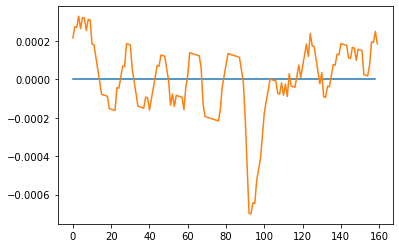

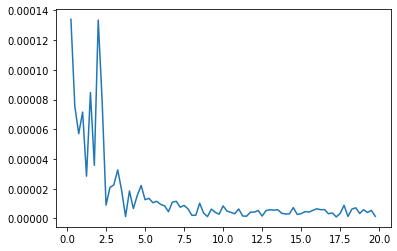

 19 Participant2/2021-07-08/lg_20210708-213728.csv ===========================
Index of row index:  19
Number of Peaks in time based:  25
AMP:  [0.         0.00006746 0.00004011 0.00001449 0.00001514 0.00002829
 0.00002889 0.00003289 0.00005667 0.00000816 0.000009   0.00001895
 0.00000152 0.0000148  0.00000539 0.00001023 0.00002145 0.00000295
 0.00001104 0.00000467 0.00001628 0.00001193 0.00001671 0.00001063
 0.00000972 0.00001916 0.00000208 0.00000425 0.00000318 0.00000416
 0.00000454 0.0000084  0.00000476 0.00000899 0.00001008 0.0000082
 0.00000286 0.00000678 0.00000191 0.00000657 0.00001694 0.00000407
 0.00001174 0.00001544 0.00001007 0.00000578 0.00000604 0.00001959
 0.00000497 0.00000418 0.00000317 0.00001084 0.00001424 0.00001219
 0.00000885 0.00000808 0.00001086 0.00000509 0.00000735 0.00000798
 0.00000689 0.00001126 0.00000146 0.00001401 0.00000441 0.00000661
 0.00000983 0.00001015 0.00001219 0.00000132 0.00000731 0.00000477
 0.00000904 0.00000562 0.00000407 0.00000839 0.000003

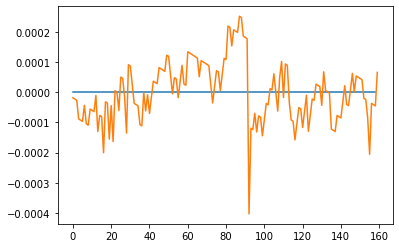

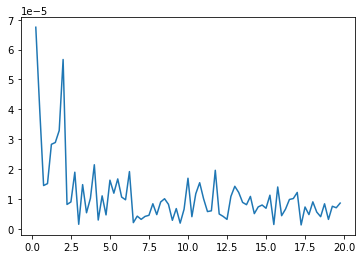

 20 Participant2/2021-06-30/lg_20210630-153050.csv ===========================
Index of row index:  20
Number of Peaks in time based:  18
AMP:  [0.         0.00031596 0.00012403 0.00008851 0.00013143 0.0001076
 0.00013337 0.00010938 0.00010472 0.00009845 0.00003191 0.00000118
 0.00000835 0.0000264  0.00002408 0.00002413 0.00001744 0.00002396
 0.00003867 0.00001667 0.00001835 0.00000723 0.00001656 0.00001153
 0.00001711 0.00001336 0.00001333 0.0000059  0.00001294 0.00002035
 0.00000735 0.00001083 0.00000667 0.00000837 0.000016   0.00000616
 0.00001416 0.00000791 0.00000962 0.0000052  0.00000941 0.00001201
 0.00000661 0.00000446 0.00000766 0.00001081 0.0000079  0.00000824
 0.00000224 0.00000438 0.00001167 0.00000841 0.00000832 0.00000796
 0.00000358 0.00000885 0.00000874 0.00001107 0.00000817 0.00000408
 0.00001005 0.00001109 0.00001224 0.00000887 0.00000171 0.00000808
 0.00001033 0.00000824 0.00001186 0.00000555 0.00000819 0.00001214
 0.00001008 0.00001038 0.00000529 0.00000711 0.000008

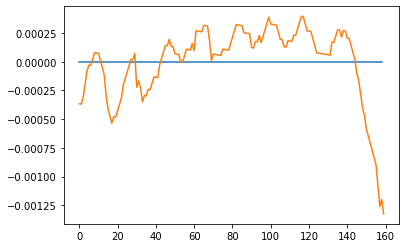

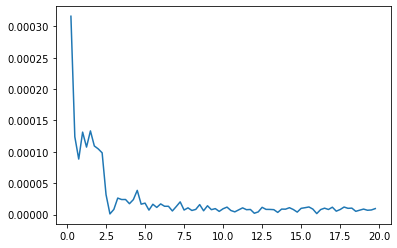

 21 Participant2/2021-06-28/lg_20210628-153436.csv ===========================
Index of row index:  21
Number of Peaks in time based:  17
AMP:  [0.         0.0000609  0.0000951  0.00004577 0.00004321 0.00001359
 0.00001377 0.00018301 0.00021836 0.00004526 0.000012   0.00002704
 0.00003675 0.00002954 0.00003113 0.00004236 0.00001284 0.00001478
 0.00000832 0.00001168 0.00001323 0.00001311 0.00003741 0.00003452
 0.00001503 0.00001109 0.0000134  0.00001138 0.00002144 0.00000282
 0.00000617 0.00001787 0.00001074 0.00000907 0.00000231 0.00001082
 0.00000621 0.00000296 0.00000346 0.00000626 0.00000758 0.0000026
 0.0000031  0.00000653 0.00000972 0.00000426 0.00000615 0.00000528
 0.00000564 0.0000052  0.000002   0.00000544 0.00000823 0.00000276
 0.00000321 0.00000593 0.00000719 0.00000606 0.00001088 0.00000455
 0.00000143 0.00000262 0.00000419 0.00001167 0.00000246 0.0000047
 0.00000598 0.00000828 0.00001043 0.00000217 0.00000357 0.00000463
 0.00000373 0.00000837 0.0000043  0.0000084  0.0000096

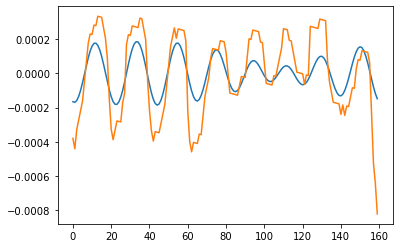

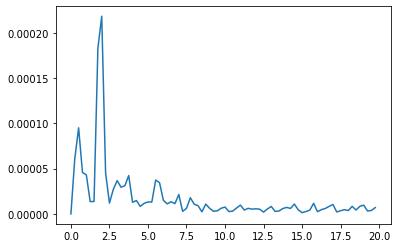

 23 Participant2/2021-07-04/lg_20210704-080419.csv ===========================
Index of row index:  23
Number of Peaks in time based:  23
AMP:  [0.         0.00005419 0.00000382 0.00000933 0.00003182 0.00001662
 0.00003798 0.00000877 0.00008977 0.00007301 0.00004437 0.00000877
 0.00001304 0.00001626 0.00000936 0.0000219  0.00001658 0.00001029
 0.00000513 0.00000547 0.00000622 0.00000989 0.00000896 0.00000983
 0.00001287 0.00000422 0.00000278 0.00000573 0.00000656 0.00000697
 0.00000994 0.00000164 0.0000083  0.0000102  0.0000072  0.0000014
 0.00000602 0.00000784 0.00000276 0.00000412 0.00001004 0.00000364
 0.00000394 0.00000251 0.00000351 0.00000595 0.00000503 0.00000684
 0.00000288 0.00000579 0.00001078 0.00000405 0.00000289 0.00000565
 0.00000786 0.00000725 0.0000033  0.00000658 0.00000253 0.00000319
 0.00000412 0.00000644 0.00000545 0.00000341 0.00000716 0.00000626
 0.00000608 0.00000339 0.00000375 0.00000937 0.00000391 0.00000563
 0.00000878 0.00000304 0.00000518 0.0000037  0.000006

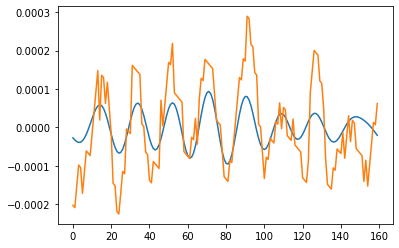

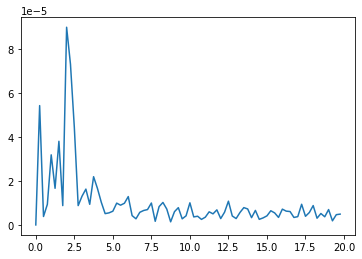

 24 Participant2/2021-07-04/lg_20210704-115503.csv ===========================
Index of row index:  24
Number of Peaks in time based:  23
AMP:  [0.         0.00001873 0.00002191 0.00002623 0.0000352  0.000005
 0.00003825 0.00006479 0.00011262 0.00003406 0.00001945 0.00001216
 0.00000495 0.00003712 0.00002552 0.0000349  0.00001438 0.00000775
 0.00000727 0.00000136 0.00001744 0.0000061  0.00000317 0.00001483
 0.00000788 0.00001876 0.0000156  0.00001375 0.00001194 0.00000583
 0.00000578 0.00000303 0.00000537 0.00000584 0.00000901 0.00001497
 0.00000631 0.00000412 0.00001356 0.00000414 0.00001355 0.00001166
 0.00001987 0.00000391 0.00000866 0.00001096 0.00000377 0.00001233
 0.00001493 0.00000868 0.00000841 0.00001023 0.00000859 0.00000829
 0.00001394 0.00000685 0.00000544 0.00001197 0.0000057  0.0000079
 0.00000617 0.00000766 0.00000432 0.00000849 0.00000733 0.00000822
 0.000006   0.00001151 0.00000439 0.00000511 0.0000013  0.00000781
 0.00000119 0.0000072  0.0000155  0.00000429 0.00000744

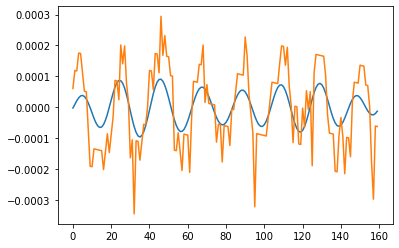

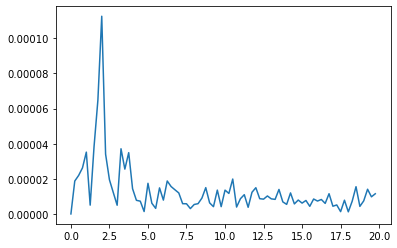

 25 Participant2/2021-07-03/lg_20210703-083853.csv ===========================
Index of row index:  25
Number of Peaks in time based:  26
AMP:  [0.         0.00002014 0.00001626 0.00012146 0.00008599 0.00008943
 0.00007364 0.00025631 0.00006293 0.00002348 0.00001882 0.00002583
 0.00005742 0.0000291  0.00004168 0.0000431  0.00002664 0.00004347
 0.00002924 0.00002468 0.0000276  0.00003113 0.00001591 0.00000565
 0.00003349 0.00001759 0.00001508 0.00001277 0.00001784 0.00001273
 0.00001877 0.0000175  0.00002392 0.00000568 0.00001377 0.00000661
 0.00000966 0.00001379 0.00002818 0.00001585 0.0000246  0.00001809
 0.00003032 0.00000834 0.00001698 0.00000866 0.0000047  0.00003837
 0.00000674 0.00001932 0.00000957 0.00001635 0.00000761 0.00000692
 0.00003099 0.00001202 0.00000737 0.00001237 0.00001256 0.00001542
 0.00002226 0.00000415 0.0000102  0.00001098 0.00001532 0.00000935
 0.0000128  0.00001237 0.00001496 0.00001283 0.00000718 0.00000977
 0.00001193 0.00000996 0.00001233 0.00000876 0.00002

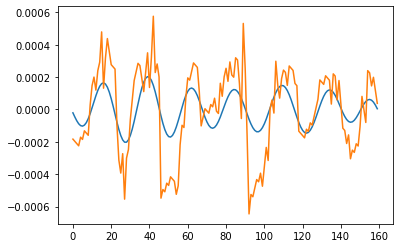

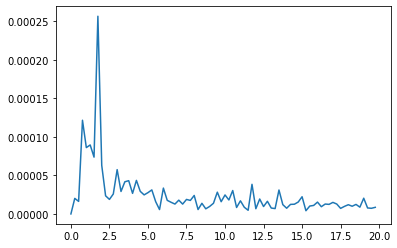

 26 Participant2/2021-07-02/lg_20210702-171944.csv ===========================
Index of row index:  26
Number of Peaks in time based:  31
AMP:  [0.         0.00006281 0.00005388 0.00004537 0.00004429 0.00002196
 0.00002648 0.00004128 0.00007538 0.0000447  0.00003091 0.00000457
 0.00000517 0.00001101 0.00002932 0.0000179  0.00000643 0.00000223
 0.00001622 0.00001318 0.00001849 0.00000992 0.00000957 0.00000867
 0.00000907 0.00000608 0.00001836 0.00000213 0.00001454 0.00000893
 0.00000258 0.00001205 0.00000299 0.0000102  0.00000695 0.00000752
 0.00001188 0.00000905 0.00000913 0.0000158  0.00001133 0.00000532
 0.00000388 0.00000865 0.00001169 0.00000727 0.00000957 0.0000077
 0.00001351 0.00000659 0.00001065 0.00001258 0.00000847 0.00001876
 0.00001017 0.00000917 0.00000785 0.00000715 0.00000904 0.0000193
 0.00000372 0.00001557 0.00000253 0.00000571 0.00000472 0.00001284
 0.0000081  0.00001654 0.00000721 0.00000788 0.00000322 0.00000826
 0.00000552 0.00000861 0.00001464 0.00001008 0.0000052

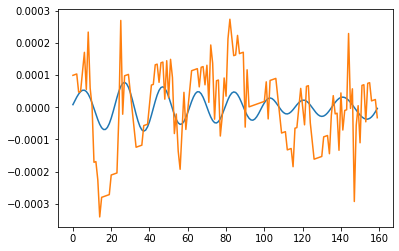

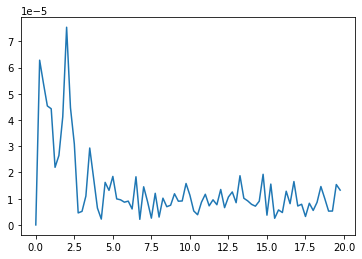

 28 Participant2/2021-07-05/lg_20210705-105203.csv ===========================
Index of row index:  28
Number of Peaks in time based:  24
AMP:  [0.         0.00019182 0.00017788 0.00016881 0.00013375 0.00007812
 0.00012993 0.00012063 0.00029663 0.00025579 0.00004511 0.00001403
 0.00007936 0.00002347 0.00001255 0.00005563 0.00003154 0.00008798
 0.00001159 0.00003308 0.00000742 0.00003188 0.0000133  0.00001553
 0.00004205 0.00004023 0.00005681 0.00002263 0.00002321 0.00002193
 0.00000414 0.00001852 0.00001904 0.00003213 0.00003067 0.00000862
 0.00001734 0.00000726 0.00001653 0.00001513 0.00001359 0.00001727
 0.00002947 0.00000114 0.00001478 0.00000795 0.00001889 0.00002484
 0.00001451 0.00002869 0.00000835 0.00000386 0.0000037  0.00001457
 0.00001225 0.00001976 0.00001623 0.00000353 0.00000917 0.00000541
 0.00001426 0.00001341 0.00001142 0.000002   0.00000902 0.00000952
 0.0000139  0.0000073  0.0000124  0.00001217 0.00000116 0.0000105
 0.00001101 0.0000046  0.00000304 0.000007   0.000007

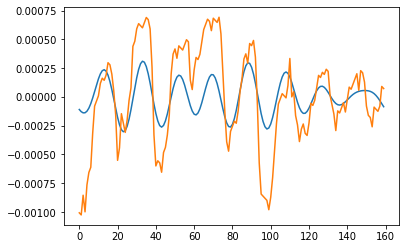

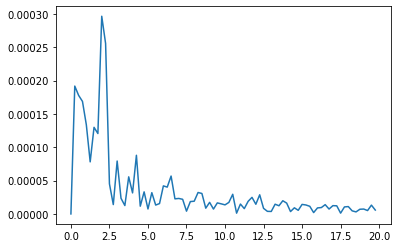

 29 Participant2/2021-07-05/lg_20210705-100219.csv ===========================
Index of row index:  29
Number of Peaks in time based:  9
AMP:  [0.         0.00124758 0.0026748  0.0008978  0.0002753  0.00280114
 0.00171005 0.0048609  0.00260779 0.00129021 0.00101961 0.00021148
 0.00074558 0.00125735 0.00057672 0.00111292 0.00048463 0.00047494
 0.00021084 0.00024515 0.00020299 0.00045817 0.00006754 0.00014704
 0.00014995 0.00017386 0.00026074 0.00015716 0.00013674 0.00005453
 0.00022223 0.00018083 0.00024771 0.00004268 0.00010024 0.00018099
 0.00012941 0.00019444 0.00011106 0.00011721 0.00003048 0.00008036
 0.00012683 0.00014054 0.00008733 0.00003167 0.00004411 0.00007595
 0.00012663 0.00010357 0.00008628 0.0000489  0.00003271 0.00012486
 0.00010387 0.00010847 0.0000673  0.00002895 0.00008362 0.00008764
 0.00014593 0.00008533 0.00006897 0.00003693 0.00006509 0.00011032
 0.00008802 0.00010138 0.00001607 0.00004041 0.000086   0.00008322
 0.00011741 0.00006121 0.00003413 0.00004985 0.000064

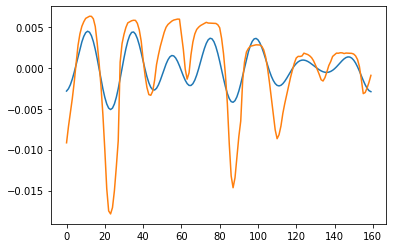

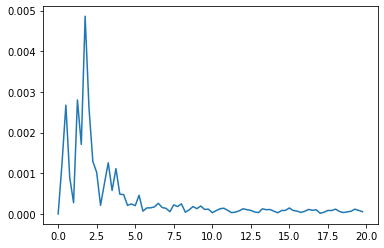

In [109]:
results_p2,peak2peak_diff_freq_list2,peak2peak_diff_time_list2 = read_iotex_data("Participant2","results_p2.csv")


 0 Participant3/2021-07-12/rg_20210712-105043.csv ===========================
Index of row index:  0
Number of Peaks in time based:  19
AMP:  [0.         0.00008673 0.00005782 0.00013444 0.00052369 0.00006898
 0.00007847 0.0000659  0.00018918 0.00007919 0.00007019 0.00006577
 0.00005401 0.00006717 0.00006108 0.00006687 0.00004782 0.00004021
 0.00005805 0.00000933 0.00000744 0.00004044 0.00002306 0.00002447
 0.00000885 0.00003283 0.00002587 0.00001743 0.0000089  0.00000702
 0.00002541 0.00001503 0.00002344 0.00001547 0.00000517 0.00000692
 0.00001213 0.00002186 0.00001249 0.00001788 0.00001607 0.00000373
 0.00001284 0.00000389 0.00000791 0.00000567 0.00000552 0.00000292
 0.00001237 0.00001091 0.00000306 0.00000486 0.00000639 0.00000595
 0.00001319 0.00000915 0.00001354 0.0000093  0.0000107  0.00000816
 0.00002215 0.00000582 0.00001133 0.00000535 0.00000215 0.00000888
 0.0000017  0.00000719 0.00000448 0.00000809 0.00000527 0.00001059
 0.00000911 0.00000985 0.00000479 0.00000287 0.0000062

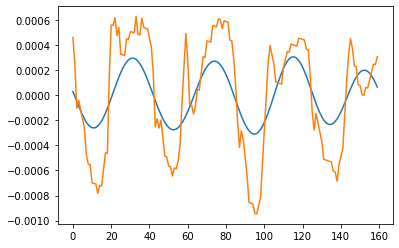

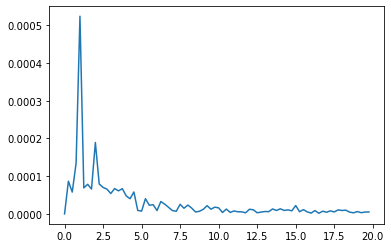

 1 Participant3/2021-07-12/rg_20210712-084406.csv ===========================
Index of row index:  1
Number of Peaks in time based:  10
AMP:  [0.         0.00153899 0.00090481 0.00147221 0.00669709 0.00094717
 0.00035619 0.00045158 0.00060992 0.00036032 0.00039525 0.00109124
 0.0013572  0.00056855 0.00039536 0.00062422 0.00024302 0.00019848
 0.00018331 0.00052215 0.00013982 0.00011908 0.00032909 0.00045168
 0.0001318  0.00006824 0.00018469 0.00025235 0.00013579 0.00008716
 0.00017388 0.00015608 0.00010931 0.00016816 0.00012604 0.00006483
 0.00012339 0.00012792 0.00007179 0.00008291 0.00006977 0.00014181
 0.0000303  0.00006522 0.00012611 0.00005885 0.00005068 0.00005897
 0.0001026  0.0000845  0.00003737 0.00003208 0.00010803 0.00005097
 0.00009072 0.00003457 0.00004308 0.00008532 0.00006357 0.00004844
 0.00003377 0.00005451 0.00008324 0.00006007 0.00002978 0.00004179
 0.00005327 0.00005144 0.0000541  0.00000966 0.00004706 0.00005576
 0.00006662 0.00002834 0.00003269 0.00003898 0.0000419

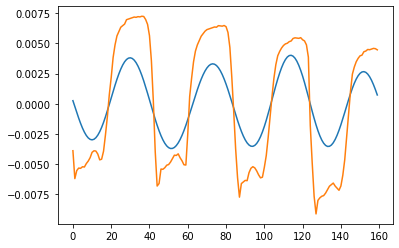

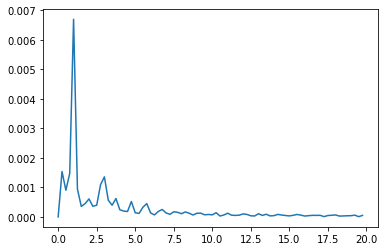

 2 Participant3/2021-07-15/rg_20210715-085044.csv ===========================
Index of row index:  2
Number of Peaks in time based:  15
AMP:  [0.         0.00048709 0.00043867 0.00184669 0.0028772  0.00069834
 0.00057967 0.00037809 0.00055758 0.00066086 0.00060351 0.00054591
 0.00017993 0.0001462  0.0003237  0.00015289 0.00012981 0.00006389
 0.00038405 0.0001173  0.00009967 0.00006946 0.00031981 0.00013207
 0.0000957  0.00008759 0.00014942 0.00017809 0.00014636 0.00009488
 0.00010058 0.00009681 0.00013145 0.00001585 0.00003081 0.00003404
 0.00015999 0.00003299 0.00002069 0.00004186 0.00013052 0.00008948
 0.00003416 0.00002676 0.00010678 0.00007742 0.00004616 0.00001199
 0.00005515 0.00007553 0.00006905 0.00002152 0.00002229 0.00004659
 0.00007585 0.00004532 0.00002646 0.00004928 0.00006871 0.00005149
 0.00002277 0.00003822 0.00007072 0.00005786 0.00004377 0.00003151
 0.00004333 0.00005667 0.00005405 0.00002374 0.00003739 0.00004915
 0.00005275 0.00003676 0.00003805 0.00005235 0.0000467

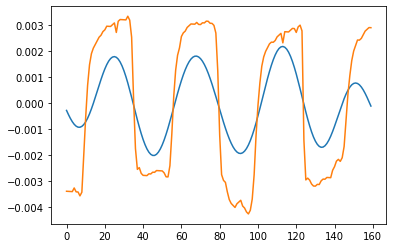

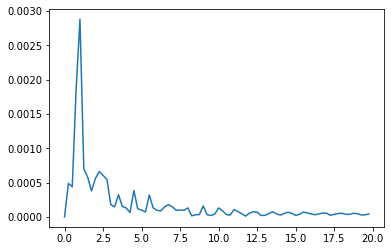

 3 Participant3/2021-07-15/rg_20210715-074541.csv ===========================
Index of row index:  3
Number of Peaks in time based:  14
AMP:  [0.         0.00041814 0.00043323 0.0006031  0.00176427 0.00062614
 0.00019194 0.00021362 0.0001462  0.00009125 0.00008988 0.00033694
 0.00005815 0.00012457 0.000089   0.0000936  0.0001251  0.00002884
 0.00006712 0.00012942 0.00009024 0.0000281  0.0000228  0.00008699
 0.00004651 0.00001711 0.00005588 0.00002232 0.00004613 0.00004847
 0.00004611 0.00003581 0.00003591 0.0000328  0.00001823 0.00001791
 0.00002705 0.00003676 0.00002415 0.00002736 0.0000336  0.00001272
 0.00002731 0.00003208 0.00001763 0.00001574 0.00001109 0.00000662
 0.00000905 0.0000085  0.00002512 0.0000298  0.00002254 0.00000168
 0.00001109 0.00000641 0.00001705 0.00001002 0.00001631 0.0000042
 0.0000102  0.00001871 0.000019   0.00001603 0.00001285 0.00002424
 0.00001007 0.00000974 0.00000653 0.00000663 0.0000161  0.00001085
 0.00002056 0.00002283 0.00000177 0.00001172 0.00002432

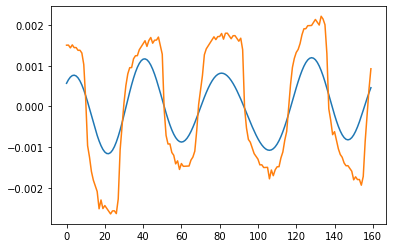

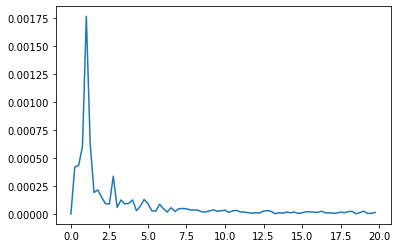

 4 Participant3/2021-07-14/rg_20210714-074534.csv ===========================
Index of row index:  4
Number of Peaks in time based:  23
AMP:  [0.         0.00014196 0.00016796 0.00021608 0.00023323 0.00007315
 0.00004691 0.00009497 0.00006035 0.00003487 0.0000483  0.00001228
 0.00004213 0.00001146 0.00001922 0.0000158  0.00000989 0.00000515
 0.00000776 0.00001733 0.00001316 0.00001423 0.00000239 0.00000727
 0.00000799 0.00001654 0.00001321 0.00000563 0.00001501 0.0000074
 0.00001926 0.00000952 0.0000078  0.00000644 0.00000842 0.00001106
 0.00001482 0.00000792 0.00000782 0.00000922 0.00000834 0.00000347
 0.00000514 0.00000663 0.00001115 0.0000129  0.00000233 0.00000534
 0.00000374 0.00001621 0.00000745 0.00000179 0.00001064 0.00000406
 0.00001182 0.00000687 0.0000161  0.00001236 0.00000625 0.00001043
 0.00001035 0.00000479 0.00000178 0.00000979 0.00001447 0.00001712
 0.00000133 0.00001614 0.00000256 0.00001489 0.00000644 0.00000879
 0.00000583 0.00000295 0.00000363 0.00000994 0.00001385

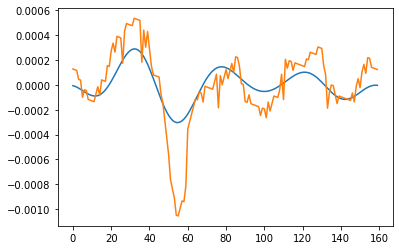

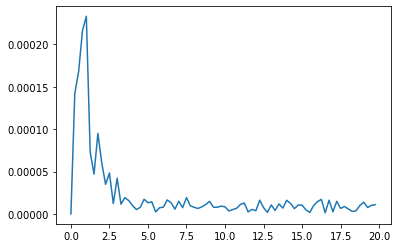

 5 Participant3/2021-07-14/rg_20210714-104520.csv ===========================
Index of row index:  5
Number of Peaks in time based:  9
AMP:  [0.         0.00048537 0.00037908 0.00028509 0.00165587 0.00050025
 0.00010203 0.000381   0.00040863 0.0001585  0.00012993 0.00009478
 0.00018112 0.00013301 0.00005902 0.00017142 0.00005847 0.00005248
 0.00002025 0.00020263 0.00006544 0.00007233 0.00004358 0.00002814
 0.00004201 0.00001727 0.00005165 0.00009091 0.00005698 0.00002055
 0.00001918 0.00003666 0.00003401 0.00002591 0.00004691 0.00001345
 0.00004574 0.00001868 0.00002285 0.00002623 0.00001059 0.00001369
 0.0000142  0.00000177 0.00003572 0.00000541 0.00003049 0.0000185
 0.00000549 0.00002631 0.00002013 0.00002821 0.0000191  0.00001261
 0.00002992 0.00002361 0.00001776 0.00001963 0.0000113  0.00002302
 0.00002344 0.00002615 0.00001537 0.00001157 0.00000484 0.0000177
 0.00002966 0.00001189 0.0000297  0.00001242 0.0000043  0.00003983
 0.0000156  0.0000077  0.00001336 0.00000756 0.0000125  0

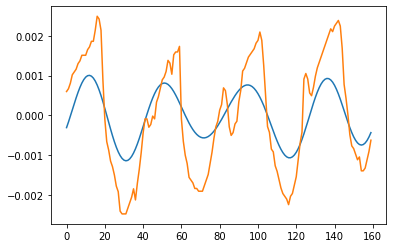

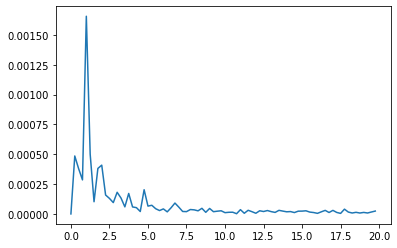

 6 Participant3/2021-07-13/rg_20210713-104541.csv ===========================
Index of row index:  6
Number of Peaks in time based:  4
AMP:  [0.         0.00147384 0.00118677 0.0038114  0.00211002 0.00103996
 0.00023861 0.00049153 0.00004998 0.00013388 0.00101992 0.00032943
 0.00044339 0.0001023  0.00034779 0.00008424 0.00017147 0.00042378
 0.00016991 0.00026657 0.00022339 0.00016471 0.00011065 0.00010086
 0.00016959 0.00014535 0.00014427 0.00021774 0.00003825 0.00006994
 0.00007815 0.0000788  0.00010564 0.00005641 0.00013415 0.00007009
 0.00002665 0.0000647  0.00005476 0.00007768 0.00000758 0.00007304
 0.00006141 0.00002174 0.00003941 0.00002705 0.00006282 0.00001642
 0.00004229 0.00004307 0.00003482 0.00003791 0.00000973 0.00004254
 0.00002591 0.00001972 0.00001949 0.0000337  0.00003506 0.00002549
 0.00002836 0.00003083 0.0000278  0.00001162 0.00002932 0.00003759
 0.00003238 0.00002088 0.00002793 0.00003476 0.00002976 0.00001863
 0.00003013 0.00003583 0.00002692 0.00001982 0.00003318

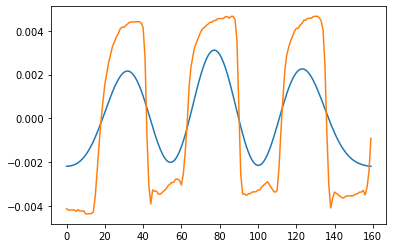

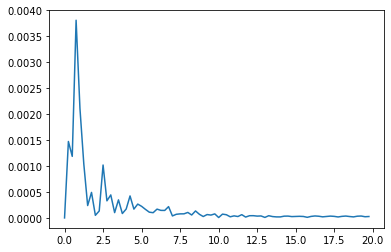

 7 Participant3/2021-07-13/rg_20210713-075054.csv ===========================
Index of row index:  7
Number of Peaks in time based:  6
AMP:  [0.         0.00095216 0.00093723 0.00271807 0.00604471 0.00210948
 0.00117217 0.00056114 0.00128695 0.00063498 0.00009815 0.00161113
 0.00025892 0.0004888  0.00093527 0.00024927 0.00046125 0.0005235
 0.00045943 0.00046428 0.00030733 0.00028719 0.00034114 0.00009173
 0.00034329 0.00025466 0.00005045 0.00017579 0.00009274 0.0003133
 0.00004387 0.00008043 0.00010123 0.00014906 0.00014306 0.00005584
 0.00004463 0.00009812 0.00008593 0.00004649 0.00003693 0.00003659
 0.00009026 0.00001595 0.00008043 0.00003916 0.00005599 0.00002645
 0.00004854 0.00006518 0.00002989 0.00004868 0.0000132  0.00001411
 0.00007966 0.00003711 0.00006724 0.00001038 0.00004331 0.00009409
 0.00002998 0.00005716 0.00002558 0.00002287 0.0000783  0.00003217
 0.00004842 0.00002035 0.00003279 0.00006809 0.00002944 0.00003275
 0.00002171 0.00003368 0.0000481  0.00001263 0.00002106 0

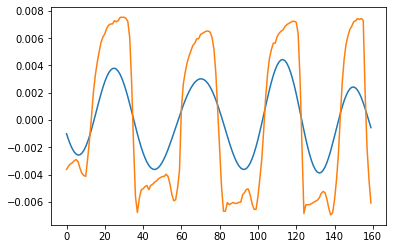

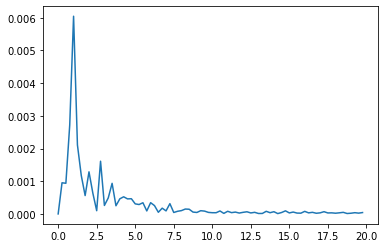

 9 Participant3/2021-07-09/rg_20210709-083010.csv ===========================
Index of row index:  9
Number of Peaks in time based:  21
AMP:  [0.         0.00187438 0.00068559 0.00189515 0.00739767 0.00146152
 0.00074063 0.00135333 0.00108427 0.00118868 0.0008087  0.00095958
 0.00067521 0.00093238 0.0007031  0.0007362  0.00055556 0.0002603
 0.00056125 0.00008313 0.00075079 0.00027755 0.00036937 0.00018954
 0.00025868 0.0002426  0.00024432 0.00019203 0.00034956 0.00022641
 0.00018266 0.00019076 0.00021538 0.00021905 0.00016952 0.00006176
 0.00008176 0.00016714 0.00015842 0.00016787 0.00010063 0.00016254
 0.00015036 0.00011119 0.00012115 0.00014115 0.00016733 0.00007029
 0.00016406 0.00011279 0.00011795 0.00011191 0.00012082 0.00008126
 0.00008496 0.00005797 0.00017814 0.00012698 0.00005836 0.00009701
 0.00010748 0.00006535 0.00010056 0.00011681 0.00007195 0.00007512
 0.00010051 0.00008799 0.00007989 0.00006683 0.00007362 0.00003384
 0.00005044 0.00007643 0.00012321 0.00006909 0.00009424

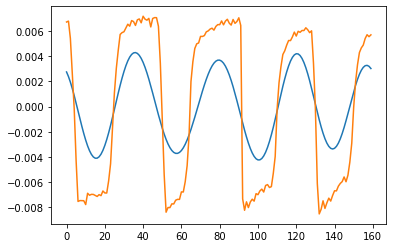

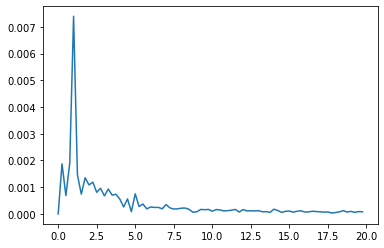

 10 Participant3/2021-07-09/rg_20210709-093033.csv ===========================
Index of row index:  10
Number of Peaks in time based:  15
AMP:  [0.         0.00034147 0.00009946 0.0001167  0.00022404 0.00004007
 0.0000374  0.00016866 0.00019665 0.00029405 0.00004245 0.00000827
 0.00000661 0.00002564 0.00003105 0.00002881 0.00004259 0.00007388
 0.00007853 0.00001869 0.00002008 0.00000693 0.00000893 0.00001151
 0.00001294 0.00001335 0.00001665 0.00000926 0.00001264 0.00000768
 0.00001045 0.00000808 0.00001092 0.00000782 0.00000225 0.00000728
 0.00000812 0.00000301 0.00000997 0.00000704 0.00000745 0.00000641
 0.00000563 0.0000024  0.0000126  0.00000315 0.0000051  0.00000477
 0.00000816 0.00000637 0.0000063  0.00000537 0.00000931 0.00000551
 0.00000512 0.00000774 0.00000675 0.00000805 0.00000492 0.00001292
 0.00001058 0.00000432 0.00000345 0.00000953 0.00000446 0.00000159
 0.00000086 0.00000831 0.00000144 0.00000225 0.00000883 0.00000546
 0.0000067  0.00000323 0.00000872 0.00000399 0.00000

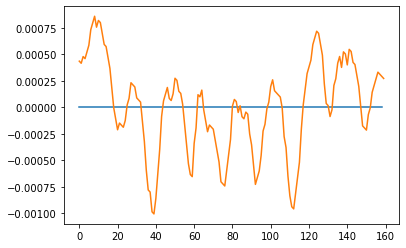

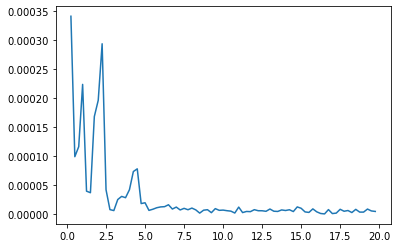

 11 Participant3/2021-07-09/rg_20210709-135557.csv ===========================
Index of row index:  11
Number of Peaks in time based:  20
AMP:  [0.         0.00048679 0.0011452  0.0020987  0.00700876 0.00142859
 0.00065526 0.0002288  0.00085707 0.0008044  0.00065097 0.00118052
 0.00090717 0.0005109  0.00041916 0.00030635 0.00034277 0.00037515
 0.00053356 0.00035107 0.00027979 0.00020212 0.00042515 0.00008383
 0.00022864 0.00005514 0.00028384 0.0000798  0.00021268 0.00008452
 0.00026594 0.00008915 0.00019311 0.00008945 0.00014245 0.00004084
 0.00012068 0.00013643 0.00009647 0.00011878 0.00004331 0.00002731
 0.00010926 0.00006833 0.00005903 0.00010411 0.00008775 0.00008807
 0.00008695 0.00003839 0.00005937 0.00003822 0.00007269 0.00001181
 0.00006584 0.00001701 0.00011316 0.00002081 0.00007483 0.00009118
 0.00006418 0.0000367  0.00006529 0.0000462  0.00005241 0.00002139
 0.00005784 0.0000573  0.00003667 0.00004877 0.00004634 0.00005488
 0.00002514 0.00006584 0.00006436 0.00003762 0.00001

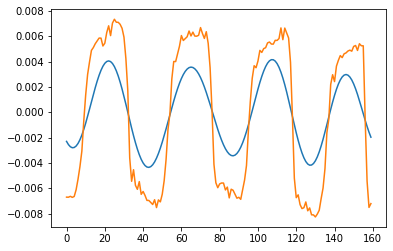

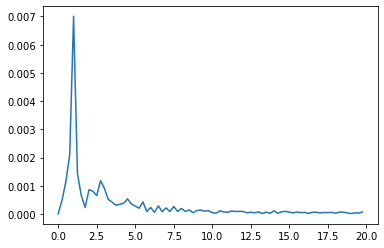

 12 Participant3/2021-07-08/rg_20210708-130053.csv ===========================
Index of row index:  12
Number of Peaks in time based:  14
AMP:  [0.         0.00062143 0.0022591  0.00794513 0.00165425 0.00124707
 0.00122064 0.00065226 0.00117345 0.00139089 0.00072533 0.00142145
 0.0004293  0.00036429 0.00032633 0.00031949 0.00034189 0.0006689
 0.00044175 0.00002529 0.00005937 0.00026535 0.00020554 0.00014263
 0.00030204 0.00010038 0.00013698 0.00017683 0.00008967 0.00011743
 0.00014007 0.00000704 0.00013879 0.00004382 0.0000145  0.00007474
 0.00006457 0.00004717 0.00003525 0.00001531 0.00004524 0.00000633
 0.00004579 0.00001702 0.00003756 0.00004309 0.00002938 0.00000516
 0.00001808 0.00000562 0.00002538 0.00001267 0.00000836 0.0000141
 0.00002263 0.00003371 0.00005412 0.00001917 0.00002396 0.00003065
 0.00001412 0.00002461 0.00002035 0.00000968 0.00001647 0.00002051
 0.00001699 0.00000306 0.00003697 0.00002362 0.00001433 0.00002631
 0.000018   0.00002803 0.00001427 0.00001595 0.0000117

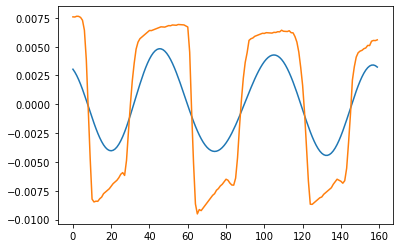

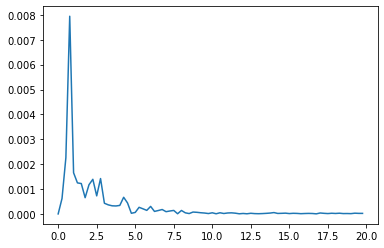

 14 Participant3/2021-07-16/rg_20210716-075517.csv ===========================
Index of row index:  14
Number of Peaks in time based:  24
AMP:  [0.         0.00017391 0.00009203 0.00022378 0.00051181 0.00006112
 0.00002362 0.00016502 0.00016242 0.00011284 0.0000308  0.00002427
 0.00000994 0.00003546 0.0000226  0.00001738 0.00001324 0.00002534
 0.00003167 0.00002402 0.00000382 0.00000923 0.00002107 0.00001802
 0.0000274  0.0000128  0.00001779 0.00000936 0.00002568 0.00001318
 0.00001161 0.00000823 0.00000932 0.00002814 0.00000827 0.0000104
 0.00000673 0.00001582 0.00000975 0.00000949 0.00000475 0.00001151
 0.00000159 0.00001811 0.00000865 0.00001468 0.00000165 0.00001402
 0.00000688 0.00001068 0.00001354 0.00002308 0.00000736 0.00000351
 0.00001317 0.00001442 0.0000065  0.00001446 0.0000088  0.00001354
 0.0000086  0.00000405 0.00001081 0.00000686 0.00001283 0.00000237
 0.00000184 0.00000389 0.00001286 0.00000883 0.00001475 0.00001554
 0.00000949 0.00001277 0.00000724 0.00000665 0.000004

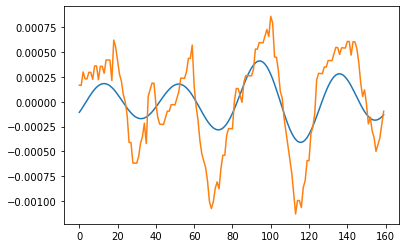

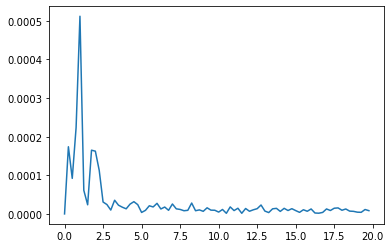

 15 Participant3/2021-07-16/rg_20210716-091019.csv ===========================
Index of row index:  15
Number of Peaks in time based:  4
AMP:  [0.         0.00042541 0.00043148 0.00139998 0.0019393  0.00072615
 0.0004159  0.00096584 0.00013425 0.00021742 0.00015155 0.00040665
 0.00020504 0.00011289 0.00037634 0.00005814 0.00006401 0.00006191
 0.00006656 0.00005396 0.00001776 0.00002767 0.00010543 0.00011955
 0.00003229 0.00007504 0.00004762 0.00005909 0.00005474 0.00002323
 0.00001382 0.00003806 0.00004681 0.00005157 0.00003932 0.00002742
 0.00004505 0.00000284 0.00003114 0.00003031 0.00004604 0.00005606
 0.00001486 0.00002648 0.00004368 0.00001254 0.00003157 0.00001054
 0.00001634 0.00003399 0.00001508 0.00001581 0.00003023 0.00002146
 0.00002609 0.00001475 0.00002265 0.00003211 0.00003709 0.00003875
 0.00001247 0.00002256 0.00002922 0.00002688 0.00001425 0.00001142
 0.00002349 0.00002062 0.00002706 0.00001265 0.00001705 0.00002557
 0.0000093  0.00001847 0.00002218 0.00002503 0.000025

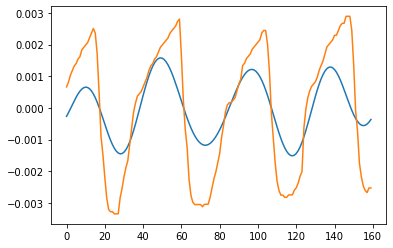

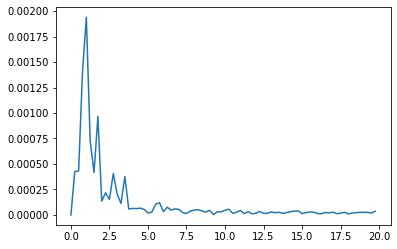

 16 Participant3/2021-07-11/rg_20210711-154554.csv ===========================
Index of row index:  16
Number of Peaks in time based:  6
AMP:  [0.         0.00014514 0.00012527 0.00037246 0.00163765 0.00050795
 0.00031533 0.00033337 0.00025082 0.00008346 0.00006659 0.00011852
 0.00022929 0.00028284 0.00012026 0.00004503 0.00007153 0.00017364
 0.00009139 0.00000793 0.00003195 0.00013236 0.00003703 0.00008401
 0.00009511 0.00007232 0.00007592 0.00009398 0.00005145 0.00003323
 0.00001883 0.00003926 0.00002699 0.00007994 0.00004546 0.00007086
 0.00000349 0.00003865 0.00002236 0.00002528 0.00002881 0.00003367
 0.00003274 0.00000548 0.00005657 0.00003063 0.00000891 0.00002188
 0.00001712 0.0000264  0.00002788 0.00002794 0.00001091 0.00001242
 0.00002089 0.00001237 0.00002887 0.00001351 0.00001194 0.00001964
 0.00002486 0.00002378 0.00001818 0.00000576 0.00001097 0.00002562
 0.00003282 0.00000567 0.00001526 0.00000424 0.00000519 0.00003049
 0.00002186 0.00001807 0.00000377 0.00000969 0.000008

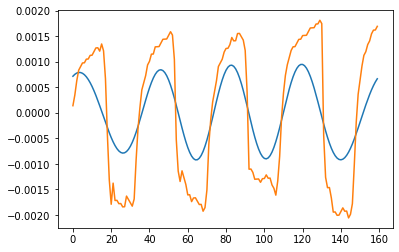

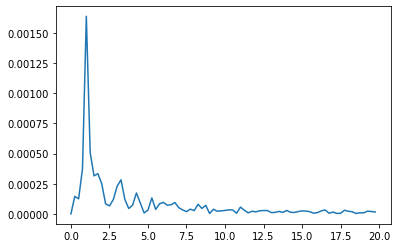

 17 Participant3/2021-07-11/rg_20210711-094656.csv ===========================
Index of row index:  17
Number of Peaks in time based:  21
AMP:  [0.         0.00020433 0.00021788 0.00039056 0.00079808 0.00021903
 0.00010292 0.00022749 0.00012532 0.00005635 0.00004552 0.0001016
 0.00001867 0.0000555  0.00004929 0.00007606 0.00003518 0.00002194
 0.00004546 0.00001075 0.00003699 0.00001268 0.00003971 0.00001457
 0.00001251 0.00001677 0.00000771 0.00002008 0.00000203 0.00002264
 0.0000056  0.00000859 0.00001009 0.000013   0.00000734 0.0000101
 0.00000111 0.00001185 0.00000451 0.00001328 0.00000431 0.00001219
 0.00000543 0.00000527 0.00001208 0.00000205 0.00000413 0.00000874
 0.00000901 0.00000466 0.00000612 0.00001589 0.00000458 0.00001721
 0.00000679 0.00000442 0.00000576 0.00000734 0.00000926 0.00000595
 0.00000757 0.00000548 0.00000867 0.00000622 0.00000894 0.00000756
 0.00001174 0.0000043  0.00000192 0.00001577 0.00000608 0.00000709
 0.00000634 0.00000224 0.00000756 0.00000897 0.0000057

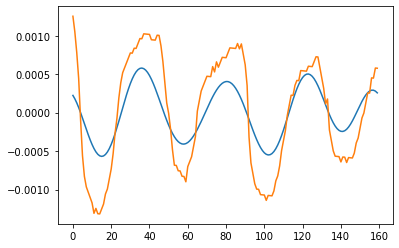

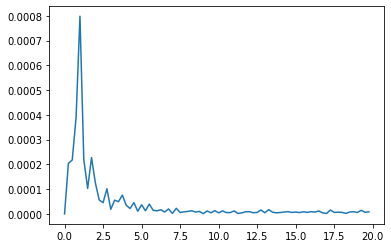

 18 Participant3/2021-07-10/rg_20210710-104537.csv ===========================
Index of row index:  18
Number of Peaks in time based:  14
AMP:  [0.         0.00096465 0.00107337 0.0021655  0.00943325 0.00305579
 0.00155761 0.00133768 0.00260074 0.00148291 0.00049149 0.00058626
 0.00036156 0.00150972 0.00096782 0.00042384 0.00082524 0.00154604
 0.00046938 0.0001967  0.00053592 0.0000927  0.00033765 0.00035082
 0.00072464 0.00047354 0.00035585 0.00046239 0.00036289 0.00049539
 0.00016202 0.00029913 0.00015594 0.00033142 0.00012044 0.0003483
 0.00005234 0.00042479 0.00012355 0.00012448 0.0001172  0.00021977
 0.00020667 0.00010387 0.00020802 0.00020444 0.00015244 0.00015121
 0.00011482 0.00004771 0.00014343 0.00019116 0.00005792 0.00006161
 0.00009434 0.00015192 0.00009538 0.0000878  0.00006702 0.00009692
 0.0000935  0.00005833 0.00001857 0.0000743  0.00012952 0.00004246
 0.0000626  0.00001895 0.00008852 0.00004192 0.00003431 0.0000905
 0.00007943 0.00000656 0.0000467  0.00005979 0.0001022

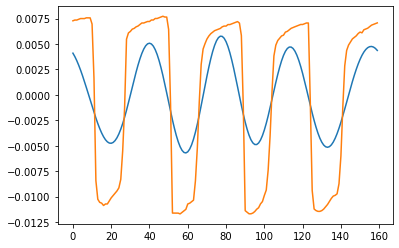

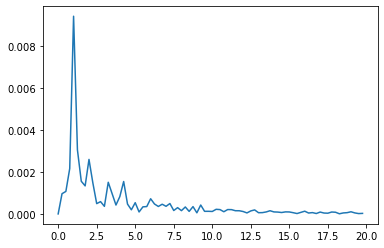

 19 Participant3/2021-07-10/rg_20210710-091053.csv ===========================
Index of row index:  19
Number of Peaks in time based:  5
AMP:  [0.         0.00044061 0.00076231 0.00089939 0.0122773  0.00062783
 0.00027752 0.0006583  0.00271566 0.00052742 0.00096009 0.00068843
 0.00238753 0.00018171 0.00027312 0.00051518 0.00083568 0.00019724
 0.00032253 0.00037523 0.0004447  0.00027808 0.00008895 0.0000472
 0.00036198 0.00011255 0.00003669 0.00009627 0.00014347 0.00003923
 0.00003874 0.00005862 0.00005376 0.00011772 0.00002697 0.00012555
 0.00009425 0.00002014 0.000113   0.00008984 0.00007975 0.0000293
 0.00012586 0.0001502  0.00004085 0.00007627 0.00005026 0.00011519
 0.00006848 0.00009702 0.00005518 0.00004309 0.00008382 0.00003176
 0.0001225  0.00005715 0.00005691 0.00000334 0.00002747 0.00008261
 0.00000634 0.00006417 0.00003739 0.00005344 0.00006338 0.00003379
 0.00011297 0.00002184 0.00004422 0.00003033 0.00002721 0.00009179
 0.00005105 0.00006201 0.00005206 0.00004345 0.00005709

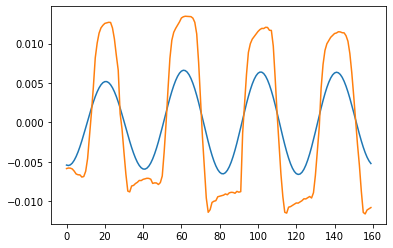

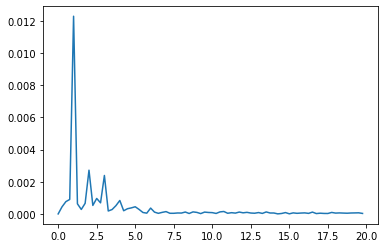

 20 Participant3/2021-07-12/lg_20210712-084406.csv ===========================
Index of row index:  20
Number of Peaks in time based:  23
AMP:  [0.         0.00073554 0.00059585 0.00121395 0.00384025 0.00089756
 0.00021705 0.00088158 0.00143103 0.00062864 0.0004308  0.00017069
 0.00022794 0.00017971 0.00017007 0.00035105 0.00011435 0.00020199
 0.000194   0.00017547 0.00014603 0.00009183 0.0000818  0.00016447
 0.00016964 0.00012209 0.00006029 0.00008307 0.00005968 0.0000781
 0.00006052 0.00007927 0.00014691 0.00012686 0.00002137 0.00005162
 0.00010141 0.00014999 0.00002947 0.00010909 0.00005557 0.00014787
 0.00003325 0.0001142  0.00001885 0.00011049 0.0000723  0.00007022
 0.00002584 0.00008647 0.00008481 0.00007066 0.00004085 0.00009144
 0.00008654 0.00005427 0.00004015 0.00008232 0.00005963 0.00005313
 0.00003907 0.00006791 0.00003932 0.00005514 0.00002012 0.00008444
 0.00003576 0.00005129 0.00004102 0.00007316 0.00003983 0.00004033
 0.00003731 0.00005995 0.00005018 0.00004235 0.000017

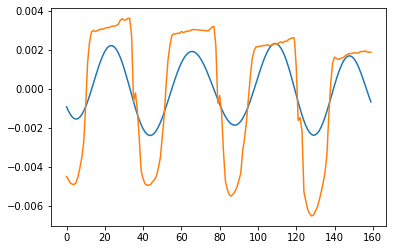

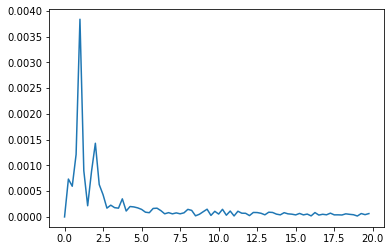

 21 Participant3/2021-07-12/lg_20210712-105043.csv ===========================
Index of row index:  21
Number of Peaks in time based:  23
AMP:  [0.         0.00014376 0.00023405 0.00062746 0.00087617 0.00048865
 0.00016238 0.00070272 0.00009021 0.00024269 0.00013723 0.00021774
 0.00021363 0.00012472 0.00012832 0.00007776 0.00010997 0.00011757
 0.0001269  0.00008222 0.00010055 0.00004059 0.00010031 0.00008486
 0.00004433 0.00005583 0.00004568 0.00005358 0.00005504 0.00004495
 0.00001902 0.00004174 0.00000324 0.00004493 0.00005159 0.00005046
 0.00004853 0.00003986 0.00005602 0.00003644 0.00002329 0.00003325
 0.00000846 0.00002003 0.00004078 0.00001856 0.00002993 0.00002942
 0.00002394 0.00002147 0.00001949 0.00002156 0.00003949 0.00000654
 0.0000258  0.00003006 0.00002034 0.00003503 0.00002432 0.00001338
 0.00001536 0.00000329 0.0000223  0.00003206 0.00000496 0.00003054
 0.0000265  0.00002387 0.00003869 0.00002132 0.0000092  0.00002022
 0.00000887 0.00001876 0.00002693 0.00001708 0.00002

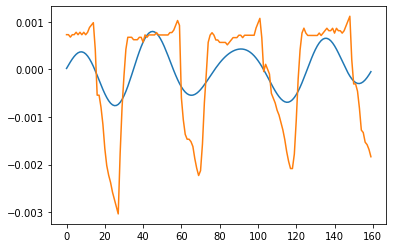

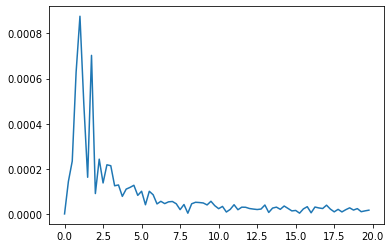

 22 Participant3/2021-07-15/lg_20210715-085044.csv ===========================
Index of row index:  22
Number of Peaks in time based:  20
AMP:  [0.         0.00016757 0.0002382  0.00153485 0.00031699 0.00005356
 0.0007172  0.00061879 0.00018231 0.00014951 0.00049752 0.00018345
 0.00005705 0.00022829 0.0001178  0.00008408 0.00011288 0.00009323
 0.00006173 0.00004554 0.00003949 0.00005438 0.00003135 0.0000252
 0.00005426 0.00002278 0.00005106 0.00004874 0.00002464 0.00005593
 0.00002706 0.0000144  0.00004362 0.00001958 0.00001681 0.00002038
 0.00002004 0.00001501 0.0000284  0.00003088 0.00001925 0.00002374
 0.00004108 0.00002192 0.00002067 0.0000364  0.00001522 0.00002312
 0.00002197 0.00002    0.00002564 0.00001118 0.00001307 0.00001876
 0.00001236 0.00000569 0.00001041 0.00000419 0.00000627 0.00000191
 0.00001085 0.00000424 0.00000418 0.00001592 0.0000229  0.00000657
 0.00001412 0.00002315 0.00001097 0.00001965 0.00001756 0.00001269
 0.0000224  0.00000689 0.00000403 0.0000242  0.000002

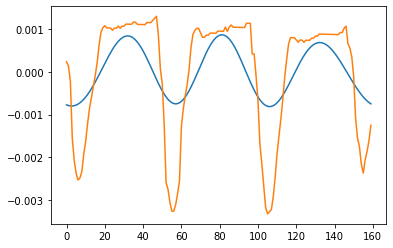

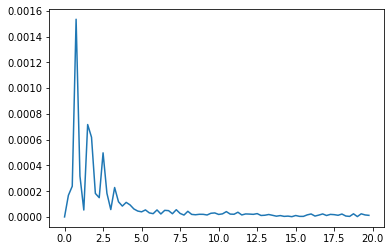

 23 Participant3/2021-07-15/lg_20210715-074541.csv ===========================
Index of row index:  23
Number of Peaks in time based:  8
AMP:  [0.         0.00051831 0.00026761 0.0022067  0.0020976  0.00070172
 0.00080813 0.00121599 0.00054802 0.00026952 0.00048448 0.00033453
 0.00023319 0.00014131 0.00032732 0.0002251  0.00008751 0.00008778
 0.0002074  0.00009638 0.00013819 0.00006128 0.00017734 0.00016604
 0.00008144 0.00002049 0.00005314 0.00021691 0.0001226  0.00006935
 0.0000397  0.00010715 0.00009357 0.00011426 0.0000447  0.00009854
 0.00003272 0.00013311 0.00003331 0.00012389 0.00005546 0.00010396
 0.00005063 0.0000782  0.00005971 0.00012883 0.00002155 0.0000404
 0.00001931 0.00012708 0.00005644 0.0000621  0.00005507 0.00008046
 0.00003965 0.00008765 0.00004838 0.00005447 0.00003251 0.00006911
 0.00003295 0.00005117 0.00007721 0.00005348 0.00000488 0.00005351
 0.00007327 0.00006402 0.0000152  0.00001727 0.00005117 0.00005819
 0.00007012 0.00000848 0.00004762 0.00002492 0.0000630

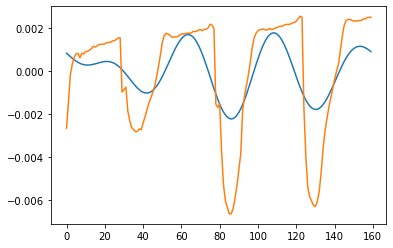

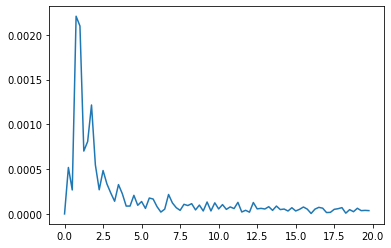

 24 Participant3/2021-07-14/lg_20210714-074534.csv ===========================
Index of row index:  24
Number of Peaks in time based:  17
AMP:  [0.         0.00223793 0.00300682 0.00780173 0.00380174 0.00098805
 0.00183659 0.00478054 0.00108725 0.00168262 0.00134967 0.00026398
 0.00085328 0.00086134 0.00063932 0.00079126 0.00092229 0.00053222
 0.00061614 0.00043734 0.00042153 0.00043766 0.000269   0.00043985
 0.00004722 0.0004     0.00031717 0.00019335 0.00056608 0.00018743
 0.00033976 0.00038083 0.00012241 0.00016513 0.00025533 0.00034335
 0.00024175 0.00040091 0.00038931 0.00029705 0.00027324 0.00019751
 0.00010758 0.00018448 0.000175   0.00005524 0.0003185  0.00017795
 0.00004536 0.00028708 0.00001547 0.00009853 0.00017253 0.00010013
 0.00004784 0.00008214 0.00013698 0.0000903  0.00010157 0.00006351
 0.00021498 0.00008891 0.00007596 0.00020628 0.00005188 0.00008246
 0.00017532 0.00009361 0.00007629 0.00013311 0.00017437 0.00012609
 0.00014236 0.00020754 0.00017168 0.00014998 0.00023

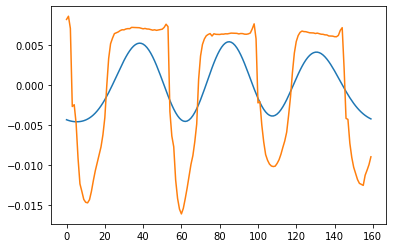

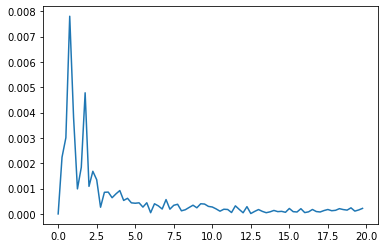

 25 Participant3/2021-07-14/lg_20210714-104520.csv ===========================
Index of row index:  25
Number of Peaks in time based:  11
AMP:  [0.         0.000198   0.00022346 0.00029513 0.00089238 0.00011368
 0.00010993 0.00019974 0.00031947 0.00011488 0.00005705 0.00011959
 0.00003922 0.00003044 0.00002376 0.00008841 0.00006951 0.00004901
 0.00004453 0.00002055 0.00002001 0.00003492 0.00002547 0.00003343
 0.00001022 0.00002055 0.00002719 0.0000132  0.00001247 0.00002568
 0.00002134 0.00001105 0.00000609 0.00001245 0.0000259  0.00001375
 0.00000803 0.00001792 0.00002066 0.00001143 0.0000128  0.00002462
 0.00000853 0.00000751 0.00000399 0.00001342 0.00000648 0.0000057
 0.00001196 0.00001307 0.00001466 0.0000191  0.00001801 0.00000642
 0.00000793 0.00001153 0.00000988 0.00000844 0.00000381 0.0000127
 0.00001772 0.00000145 0.00000624 0.00002115 0.00001486 0.00000584
 0.00001329 0.00000571 0.00000117 0.00000613 0.00000483 0.00001537
 0.00001183 0.00001566 0.00001149 0.00001081 0.0000049

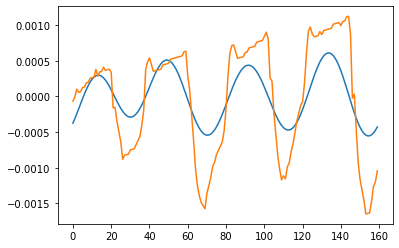

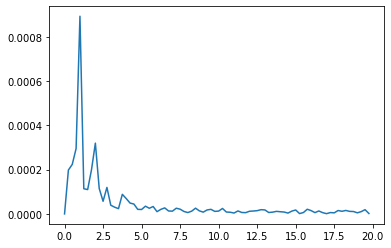

 26 Participant3/2021-07-13/lg_20210713-104541.csv ===========================
Index of row index:  26
Number of Peaks in time based:  17
AMP:  [0.         0.00031355 0.00024422 0.00110336 0.00040013 0.00033024
 0.00056452 0.00032043 0.00029908 0.00020114 0.00015324 0.00011597
 0.00004333 0.00004404 0.00006897 0.0000435  0.0000551  0.000119
 0.00006516 0.00005029 0.00008637 0.0000482  0.00002124 0.00004002
 0.0000117  0.00000971 0.00001758 0.00001503 0.00003359 0.00001588
 0.00002412 0.00003975 0.00001467 0.00001901 0.00002572 0.00001101
 0.00000611 0.00000667 0.00001389 0.00000275 0.00000926 0.00002759
 0.00001466 0.00000954 0.00002003 0.00001741 0.00001326 0.00001964
 0.00001522 0.00001679 0.00000911 0.00000733 0.00001911 0.00000272
 0.00000928 0.00002436 0.00000458 0.00000626 0.00002208 0.00001655
 0.00001114 0.00000812 0.00001152 0.00001026 0.00000163 0.00000296
 0.00000731 0.00000406 0.00001061 0.00000918 0.00000795 0.00000345
 0.00000527 0.00000412 0.00000386 0.00000358 0.0000078

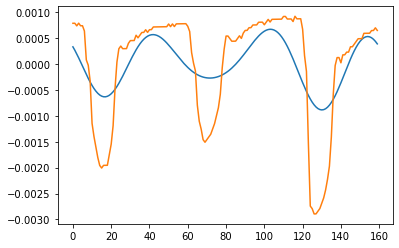

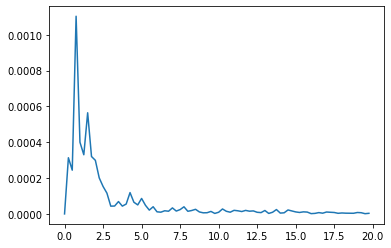

 27 Participant3/2021-07-13/lg_20210713-075054.csv ===========================
Index of row index:  27
Number of Peaks in time based:  14
AMP:  [0.         0.0004742  0.00024683 0.00219267 0.00098848 0.00063879
 0.00104177 0.00072859 0.00037328 0.0001547  0.000244   0.00014579
 0.00014131 0.00019652 0.00009853 0.00008299 0.00009734 0.00011322
 0.00009808 0.00007488 0.00002069 0.00005108 0.00007866 0.00002737
 0.0000089  0.00005545 0.00004625 0.00002649 0.00007176 0.00002314
 0.00000639 0.00006085 0.00005548 0.00001178 0.00004383 0.00005431
 0.00003132 0.00003834 0.000063   0.00000869 0.00002388 0.00007628
 0.00001435 0.00000985 0.00003947 0.00004091 0.00003664 0.00003329
 0.00003747 0.00002596 0.00003019 0.00004748 0.00002149 0.00001628
 0.00002544 0.00000621 0.00003644 0.00000368 0.00002792 0.00002833
 0.00001249 0.00002326 0.00000815 0.00003418 0.00002422 0.00000807
 0.00003229 0.00001179 0.00001838 0.00003977 0.00000952 0.00002058
 0.00002035 0.00003191 0.00003646 0.0000156  0.00004

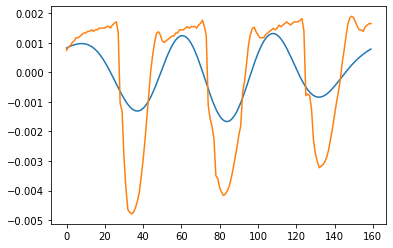

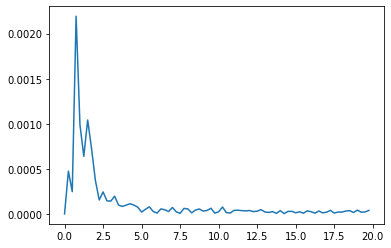

 28 Participant3/2021-07-09/lg_20210709-083010.csv ===========================
Index of row index:  28
Number of Peaks in time based:  35
AMP:  [0.         0.00018007 0.00028598 0.0006786  0.00047117 0.00032279
 0.00014419 0.00028401 0.0001354  0.00009328 0.00002502 0.00001547
 0.00006217 0.00011016 0.00007555 0.00006923 0.00001107 0.00010217
 0.00002024 0.00004521 0.00007899 0.0000217  0.00006043 0.00003578
 0.0000196  0.00003028 0.00003097 0.00004387 0.00002683 0.0000357
 0.00001268 0.00001732 0.0000365  0.00003222 0.00002645 0.00001662
 0.00003328 0.00001968 0.00003137 0.00003392 0.00003553 0.00002032
 0.00003129 0.00002455 0.00001448 0.00000814 0.00000547 0.00001346
 0.00001861 0.00001455 0.0000131  0.00001239 0.00002706 0.00002466
 0.00001695 0.00003121 0.00001263 0.00002316 0.00002839 0.0000272
 0.00003165 0.00002547 0.0000106  0.00001427 0.00001181 0.00004262
 0.00003545 0.00003012 0.0000381  0.00003573 0.00002518 0.00001377
 0.00001411 0.00005953 0.00005943 0.00002413 0.0000487

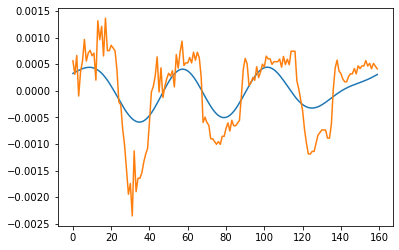

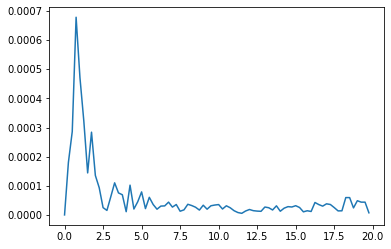

 30 Participant3/2021-07-09/lg_20210709-135557.csv ===========================
Index of row index:  30
Number of Peaks in time based:  16
AMP:  [0.         0.00153534 0.00084428 0.0003173  0.00875015 0.00163464
 0.00136616 0.00042626 0.00286124 0.0006658  0.00026715 0.00023543
 0.00083731 0.00032371 0.00069087 0.00056119 0.00066023 0.00045546
 0.00035358 0.00020398 0.0004203  0.00025362 0.0001846  0.00019512
 0.00019106 0.0003426  0.00024426 0.00011971 0.00024647 0.00025276
 0.00012097 0.00011231 0.00010161 0.00019794 0.00021284 0.00013525
 0.00018356 0.00018632 0.0001673  0.00015026 0.00008577 0.00014748
 0.00014011 0.00015624 0.00009613 0.00012863 0.00015754 0.00020363
 0.00006916 0.00011305 0.00010742 0.00019579 0.00009152 0.00008844
 0.00009734 0.00019428 0.00011165 0.00007164 0.00010182 0.00018555
 0.00011252 0.00009511 0.00003975 0.00012137 0.00013566 0.00008449
 0.0001031  0.00011639 0.00011832 0.00009605 0.00005981 0.00011155
 0.00009655 0.0001     0.00004766 0.00009909 0.00013

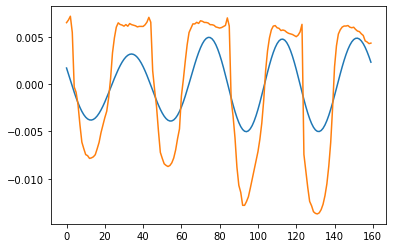

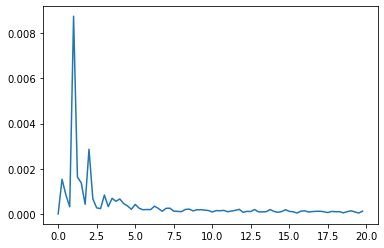

 33 Participant3/2021-07-08/lg_20210708-130053.csv ===========================
Index of row index:  33
Number of Peaks in time based:  18
AMP:  [0.         0.00030421 0.00023725 0.00023748 0.00000656 0.00013828
 0.00029675 0.00055861 0.00020006 0.00028918 0.00018837 0.00011505
 0.00007729 0.00014715 0.00045339 0.00043126 0.00017627 0.00015337
 0.00008243 0.00007964 0.00009407 0.00007814 0.00038025 0.00009716
 0.00008657 0.00005518 0.0000652  0.00014136 0.00010555 0.00015911
 0.00007754 0.00001686 0.00008696 0.00005989 0.00004349 0.00007794
 0.00004091 0.00005413 0.00007021 0.00004886 0.00009136 0.00002537
 0.00004562 0.00003506 0.00007453 0.00005993 0.00007954 0.00003784
 0.00000984 0.00005656 0.00000995 0.00001156 0.0000626  0.00002712
 0.00006207 0.00001458 0.00002041 0.00003858 0.00004031 0.00001258
 0.00002574 0.00003258 0.00004446 0.00005252 0.00004105 0.00001528
 0.00002378 0.00003087 0.00003945 0.00001021 0.00002937 0.00001589
 0.00001209 0.0000217  0.0000051  0.00002353 0.00001

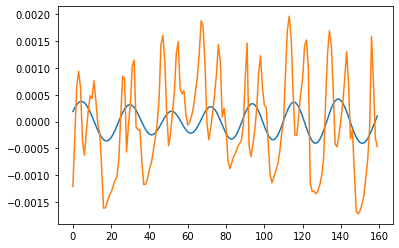

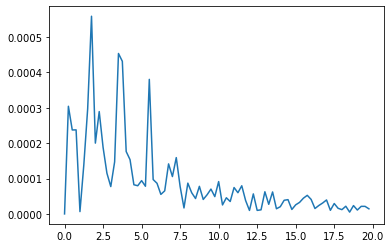

 34 Participant3/2021-07-16/lg_20210716-075517.csv ===========================
Index of row index:  34
Number of Peaks in time based:  21
AMP:  [0.         0.00020436 0.00038481 0.00046555 0.00177154 0.00043558
 0.00006856 0.00016777 0.00099514 0.00019693 0.00012381 0.00010756
 0.00004179 0.00012307 0.0000909  0.0000775  0.00040721 0.00013286
 0.00014362 0.00003667 0.00010824 0.00008991 0.00009334 0.00008917
 0.00014034 0.00008453 0.00010637 0.0000379  0.00004501 0.00001399
 0.00003108 0.00007783 0.00005705 0.00005117 0.00006865 0.00004289
 0.00001415 0.00000897 0.00005056 0.0000533  0.0000555  0.00002193
 0.00004789 0.00002745 0.00007617 0.00003009 0.00007589 0.00004952
 0.00003687 0.0000372  0.00005242 0.00002974 0.00005389 0.00003266
 0.00005829 0.0000473  0.00005844 0.00003887 0.00006192 0.00001948
 0.00002485 0.00002945 0.00003492 0.00003622 0.00005427 0.00003662
 0.00006767 0.00003468 0.00000815 0.00002437 0.00001387 0.00002574
 0.00003567 0.00003763 0.00005784 0.00001241 0.00000

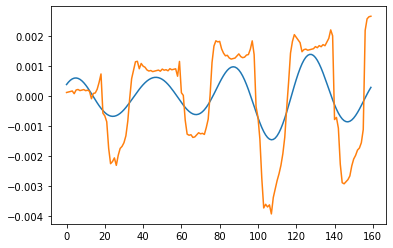

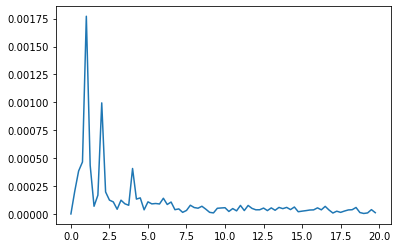

 35 Participant3/2021-07-16/lg_20210716-091019.csv ===========================
Index of row index:  35
Number of Peaks in time based:  21
AMP:  [0.         0.00154954 0.001284   0.00679677 0.00395813 0.00204796
 0.00240562 0.00310025 0.0008469  0.00042805 0.00080094 0.00025561
 0.00063755 0.00092108 0.00055194 0.00058758 0.00049635 0.0005887
 0.00028917 0.00026627 0.00004025 0.0001793  0.00040578 0.00041403
 0.00012285 0.00030768 0.00012649 0.00022056 0.00033498 0.00020641
 0.00002046 0.00022854 0.00035469 0.0000926  0.00006599 0.00028629
 0.00005928 0.00016474 0.00025598 0.0002802  0.00011326 0.00022113
 0.00025243 0.00005683 0.00006046 0.00022276 0.00015032 0.00017036
 0.00019703 0.00023324 0.00018559 0.00011299 0.00022007 0.00007203
 0.00015624 0.00010677 0.00015191 0.00023516 0.00016903 0.00014579
 0.00018545 0.00011087 0.00015277 0.00008029 0.00015385 0.00003191
 0.00003936 0.00024467 0.00008893 0.00005928 0.00008377 0.00012171
 0.00009139 0.00004555 0.00013155 0.00003778 0.000095

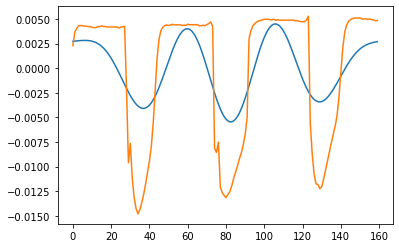

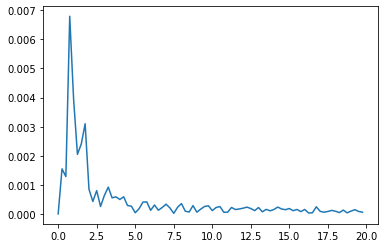

 36 Participant3/2021-07-11/lg_20210711-154554.csv ===========================
Index of row index:  36
Number of Peaks in time based:  24
AMP:  [0.         0.00048484 0.00060169 0.00204042 0.00115795 0.00052727
 0.00076671 0.00178476 0.00048384 0.00054151 0.00092537 0.00027225
 0.00025719 0.00010923 0.00029962 0.00018966 0.00008693 0.00005102
 0.00014319 0.0000683  0.00004039 0.00007898 0.00001598 0.00005152
 0.00007204 0.00001867 0.00003794 0.00001704 0.00004131 0.00002264
 0.00002748 0.00005046 0.00003963 0.00001933 0.00002402 0.00006993
 0.00002478 0.000014   0.00006361 0.00003334 0.00001398 0.00006889
 0.00006624 0.0000611  0.00008235 0.00006764 0.00005588 0.00006652
 0.00003573 0.00003822 0.00004241 0.00001869 0.00000648 0.00004767
 0.00001446 0.00001676 0.0000281  0.00001619 0.00001108 0.00003217
 0.00000747 0.00001192 0.00000826 0.00001337 0.00000202 0.00002902
 0.00001791 0.00002159 0.00002876 0.00002537 0.00004856 0.00001188
 0.00003983 0.00005509 0.00001566 0.00001296 0.00007

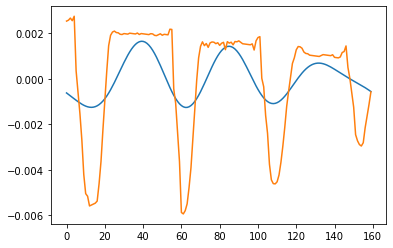

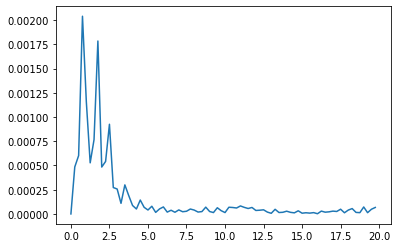

 37 Participant3/2021-07-11/lg_20210711-094656.csv ===========================
Index of row index:  37
Number of Peaks in time based:  25
AMP:  [0.         0.00018105 0.00009162 0.00011738 0.00063239 0.00017795
 0.00011883 0.00010932 0.00030601 0.00014512 0.00011418 0.00005716
 0.0000816  0.00004392 0.00004865 0.00002378 0.00007364 0.00003144
 0.00002801 0.0000169  0.00002211 0.00002817 0.00001915 0.00002281
 0.00001553 0.00002702 0.0000322  0.00002074 0.00001352 0.00001644
 0.00000676 0.00001557 0.00001365 0.00002206 0.00001825 0.00001089
 0.00002075 0.00001795 0.00001259 0.00001519 0.00001997 0.00002347
 0.00001856 0.00000968 0.00001117 0.00001904 0.00000191 0.00000316
 0.00002131 0.00002829 0.00000854 0.00001095 0.00001031 0.00002617
 0.00002165 0.00001735 0.00002395 0.00001075 0.00001059 0.00001831
 0.00000265 0.00001704 0.00000611 0.00000573 0.00001685 0.00000702
 0.00000127 0.00000923 0.00000449 0.00002161 0.00001071 0.00000686
 0.00002125 0.00000421 0.00000823 0.00001883 0.00001

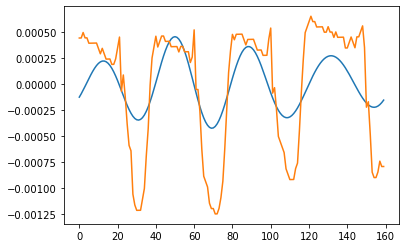

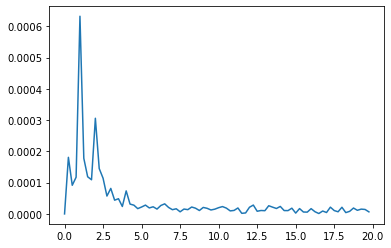

 38 Participant3/2021-07-10/lg_20210710-104537.csv ===========================
Index of row index:  38
Number of Peaks in time based:  21
AMP:  [0.         0.00066849 0.00116069 0.00320626 0.00429753 0.00174273
 0.00092461 0.00258672 0.00119658 0.00118567 0.00074058 0.00054205
 0.00044893 0.00058245 0.00015184 0.00030803 0.00026119 0.00003787
 0.00038212 0.00024594 0.0000947  0.00028599 0.00019097 0.00011051
 0.00003483 0.00001477 0.00011617 0.00016683 0.00017645 0.0001036
 0.0000599  0.00015494 0.00006105 0.00002277 0.00008801 0.00003756
 0.00011344 0.00008173 0.00004189 0.00008421 0.0002008  0.00010674
 0.00004554 0.00008524 0.00002927 0.00006034 0.0000114  0.00004409
 0.00004438 0.00009163 0.00008508 0.00004189 0.00007928 0.00010431
 0.00004852 0.00002447 0.00002571 0.00005229 0.00009088 0.00007324
 0.0000449  0.00007324 0.00006773 0.00007282 0.00006534 0.00003474
 0.0000654  0.00006234 0.00006646 0.00001238 0.00003353 0.00005408
 0.00008586 0.00006915 0.00002641 0.00012054 0.000088

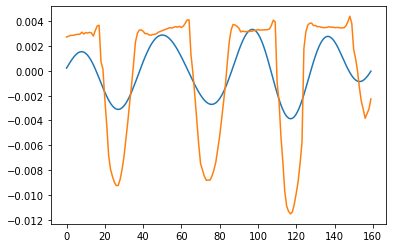

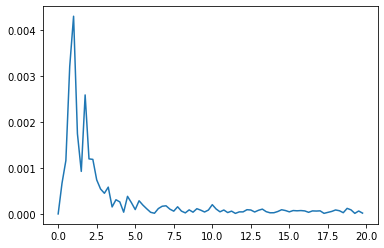

 39 Participant3/2021-07-10/lg_20210710-091053.csv ===========================
Index of row index:  39
Number of Peaks in time based:  11
AMP:  [0.         0.00214192 0.00372266 0.00031329 0.01740365 0.00127383
 0.00107919 0.00083766 0.0054426  0.00080759 0.00101966 0.00043256
 0.00198822 0.00017841 0.00094556 0.00044761 0.00190306 0.00022169
 0.00011985 0.00043649 0.00078607 0.00018575 0.00051292 0.00022671
 0.00102905 0.00018829 0.00008361 0.00039459 0.00045275 0.00012505
 0.00034158 0.00014052 0.00051804 0.00013119 0.00014107 0.00034569
 0.0004775  0.00011254 0.00015829 0.00008823 0.00043473 0.00005443
 0.00008641 0.00019429 0.00040022 0.0001274  0.00013215 0.00004541
 0.00045473 0.00009306 0.00009917 0.00018124 0.00033783 0.00008649
 0.00010624 0.00008033 0.00035327 0.00005587 0.00012527 0.00016723
 0.00024664 0.00012175 0.00005032 0.00013967 0.00031916 0.0001113
 0.00015864 0.00011851 0.00022434 0.00009015 0.00005712 0.00018753
 0.00030009 0.00012584 0.00011975 0.00002986 0.000182

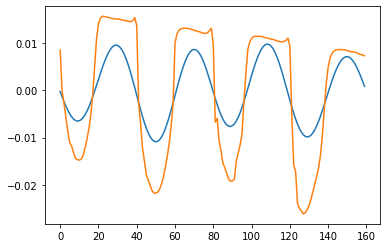

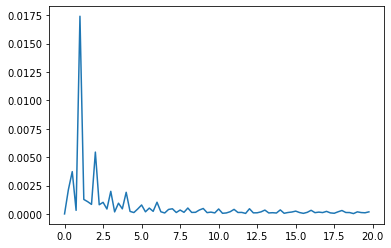

In [110]:
results_p3,peak2peak_diff_freq_list3,peak2peak_diff_time_list3 = read_iotex_data("Participant3","results_p3.csv")


 0 Participant4/2021-10-28/rg_20211028-175651.csv ===========================
Index of row index:  0
Number of Peaks in time based:  6
AMP:  [0.         0.00102721 0.00107827 0.00155023 0.00230847 0.00447177
 0.00065845 0.00067923 0.00071859 0.000306   0.00034089 0.00032332
 0.00062712 0.00023252 0.00072914 0.00026411 0.00044953 0.00023475
 0.00014533 0.00003067 0.00004279 0.00013758 0.00026912 0.00019724
 0.00009578 0.00009712 0.0001084  0.00007839 0.00007467 0.0000552
 0.00005663 0.00012377 0.00002062 0.00004027 0.00004256 0.00004947
 0.00004804 0.00005099 0.00001616 0.00002426 0.00002848 0.0000691
 0.00003337 0.00005269 0.00004293 0.00005423 0.00003543 0.00003825
 0.00004332 0.00003398 0.00005678 0.00004517 0.00005266 0.00002152
 0.00000621 0.00003218 0.00001506 0.00002954 0.00005167 0.00002013
 0.00002298 0.00000956 0.00001163 0.00003931 0.00003465 0.00004668
 0.00001742 0.00002703 0.00002671 0.00002942 0.00000684 0.00000382
 0.00002555 0.00001095 0.00004072 0.00004184 0.000031   0

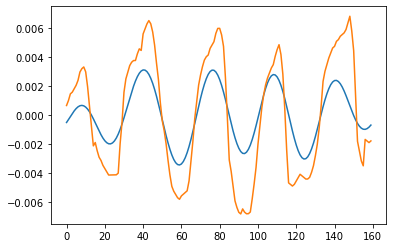

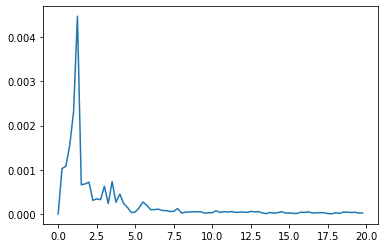

 1 Participant4/2021-10-21/rg_20211021-165751.csv ===========================
Index of row index:  1
Number of Peaks in time based:  14
AMP:  [0.         0.00024843 0.00015058 0.00071702 0.00045254 0.00594773
 0.00068172 0.00063597 0.00039152 0.00014668 0.00119428 0.00027098
 0.00021159 0.0003573  0.00045289 0.00109147 0.0004797  0.0004003
 0.00033986 0.00025897 0.00040107 0.00029176 0.0002997  0.00019563
 0.00020697 0.00010738 0.00025873 0.0002101  0.00021384 0.00014719
 0.00006832 0.00019425 0.00009598 0.00005571 0.00010511 0.0001192
 0.00013274 0.00008619 0.00004861 0.0000685  0.00016867 0.00005741
 0.00006587 0.00002414 0.00006357 0.00015543 0.00008042 0.00005763
 0.00002932 0.00004669 0.00010618 0.00007705 0.00004111 0.0000361
 0.00001823 0.00011353 0.00003829 0.00006156 0.00004644 0.00007069
 0.00009909 0.00007049 0.00007397 0.00005836 0.00004139 0.00010258
 0.00005013 0.00002927 0.00004278 0.00001832 0.00005663 0.0000325
 0.00003348 0.00002106 0.00006409 0.00008376 0.00003094 0.

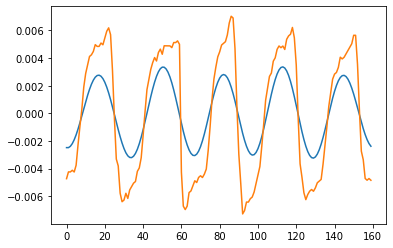

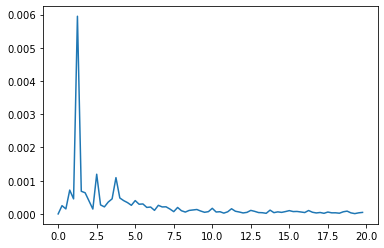

 2 Participant4/2021-10-19/rg_20211019-172844.csv ===========================
Index of row index:  2
Number of Peaks in time based:  13
AMP:  [0.         0.00028364 0.00015346 0.00061375 0.0007351  0.00024573
 0.00086586 0.00165035 0.0006435  0.00009528 0.00028302 0.00029218
 0.00014955 0.00009819 0.0002783  0.00025769 0.00035849 0.00020232
 0.00012886 0.00019248 0.00007725 0.00005382 0.00003778 0.00013611
 0.00002915 0.00010971 0.00008528 0.00017634 0.00015241 0.00007096
 0.0001107  0.0001227  0.00003433 0.00010365 0.00002999 0.00006586
 0.00006165 0.00002553 0.00004921 0.00002763 0.00007139 0.0000776
 0.0000341  0.00001146 0.00000884 0.0000801  0.00004739 0.00002612
 0.00002465 0.00002295 0.00004007 0.00006095 0.00001136 0.00004267
 0.00004426 0.00007341 0.00000929 0.00006189 0.00002067 0.00001505
 0.00009689 0.00002151 0.00003822 0.00002183 0.00003956 0.00005999
 0.00003544 0.00000611 0.00006158 0.00000508 0.00003541 0.00001937
 0.00001197 0.00001541 0.00000794 0.00001485 0.00001955

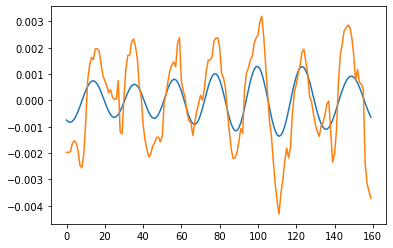

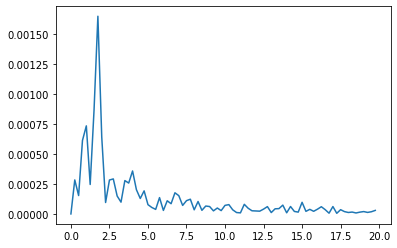

 3 Participant4/2021-10-19/rg_20211019-214518.csv ===========================
Index of row index:  3
 5 Participant4/2021-10-27/rg_20211027-184737.csv ===========================
Index of row index:  5
Number of Peaks in time based:  10
AMP:  [0.         0.00100388 0.00067256 0.00019611 0.00102032 0.00600132
 0.00329152 0.00175305 0.00050963 0.00081514 0.00005453 0.00148486
 0.00041231 0.00085427 0.00045031 0.00079982 0.0010801  0.00061719
 0.00066839 0.00072542 0.00047733 0.00013995 0.00008365 0.00023367
 0.000225   0.00036611 0.00018165 0.00046153 0.00025462 0.0000921
 0.00027897 0.00012457 0.00016992 0.0001714  0.00020895 0.00012482
 0.00019636 0.00012298 0.00019258 0.0001169  0.00005395 0.00011341
 0.00009989 0.00012265 0.00009061 0.00009999 0.00014015 0.00011807
 0.00007566 0.00008163 0.00009554 0.00013006 0.00013003 0.00009
 0.0001026  0.00015581 0.00012725 0.00011697 0.00009603 0.000106
 0.00014247 0.00009    0.00012364 0.00012173 0.00010143 0.00010966
 0.00010054 0.00010728 0.0

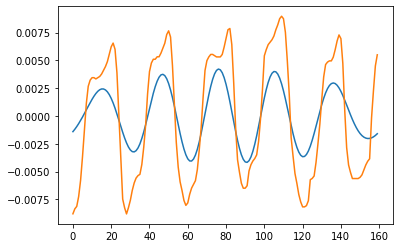

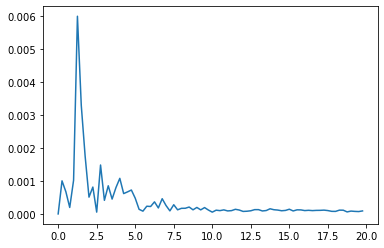

 6 Participant4/2021-10-18/rg_20211018-184648.csv ===========================
Index of row index:  6
Number of Peaks in time based:  6
AMP:  [0.         0.00016786 0.00097018 0.00178403 0.00234579 0.0077058
 0.0011797  0.00066398 0.00053487 0.00067213 0.00132584 0.0002771
 0.00020769 0.00087887 0.00119331 0.00103363 0.00013752 0.0001459
 0.00035427 0.00027064 0.00027848 0.0001254  0.00019177 0.00017851
 0.00048314 0.00014785 0.00017553 0.0001502  0.0001799  0.00028758
 0.00005676 0.00011399 0.00004316 0.00007774 0.00012482 0.00006383
 0.00008938 0.00003372 0.00002371 0.00011898 0.0000897  0.00006639
 0.00005094 0.00004606 0.00003428 0.00010583 0.0000258  0.00008655
 0.00002179 0.0000505  0.00008996 0.00006374 0.00006722 0.00005683
 0.0000156  0.00004036 0.00001949 0.00008136 0.00005871 0.00004979
 0.0000492  0.00007918 0.00006023 0.00009114 0.00007891 0.00001853
 0.00006192 0.00002474 0.00008554 0.00002397 0.00005177 0.00003935
 0.00001898 0.00002939 0.00007194 0.0000684  0.00004932 0.

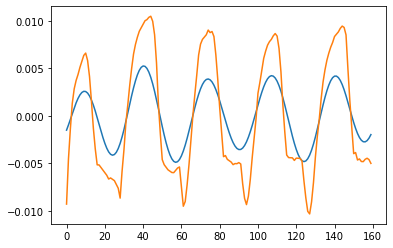

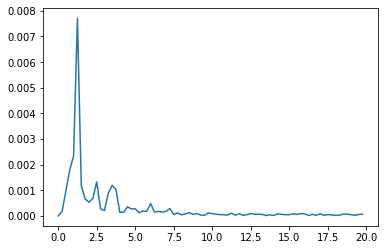

 7 Participant4/2021-10-20/rg_20211020-190820.csv ===========================
Index of row index:  7
Number of Peaks in time based:  14
AMP:  [0.         0.00041639 0.00069919 0.00127915 0.00131129 0.00452191
 0.00205413 0.00083902 0.0004685  0.00051615 0.00079166 0.00014972
 0.00019658 0.00053378 0.0000381  0.00023423 0.00094355 0.0003737
 0.00039823 0.00014948 0.0001187  0.00030168 0.00026799 0.00020079
 0.00021818 0.00019787 0.00015573 0.00021246 0.00008571 0.00025573
 0.00004087 0.00007445 0.00009053 0.00005496 0.00013506 0.00004198
 0.00008516 0.0000454  0.00011217 0.00007737 0.00006752 0.00004472
 0.00006663 0.00008666 0.00005437 0.00005672 0.00006004 0.0000425
 0.00001832 0.00004041 0.00003703 0.00006878 0.00003596 0.00001781
 0.0000345  0.00003162 0.00003726 0.00002026 0.00000403 0.00003215
 0.00004129 0.0000465  0.00005295 0.0000137  0.0000372  0.00001271
 0.0000351  0.00003368 0.00002008 0.00001985 0.00003709 0.00004798
 0.00001175 0.00002412 0.00000181 0.0000323  0.00003303 

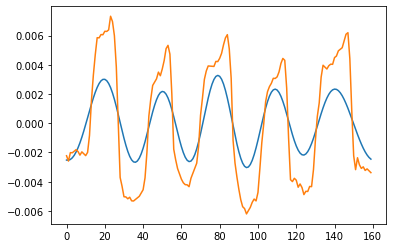

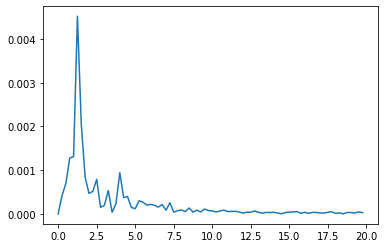

 8 Participant4/2021-10-20/rg_20211020-105349.csv ===========================
Index of row index:  8
Number of Peaks in time based:  8
AMP:  [0.         0.00149513 0.00043841 0.00098427 0.00057857 0.00204978
 0.00422829 0.00155319 0.00128506 0.00024333 0.0008373  0.00011557
 0.00092051 0.00064642 0.00069078 0.00090507 0.00033156 0.00041518
 0.00035764 0.00013324 0.00049096 0.0003669  0.00018538 0.0000638
 0.00034235 0.0001898  0.00036506 0.00028024 0.0002618  0.00027195
 0.00024343 0.00011254 0.0001433  0.00017651 0.00011892 0.00020566
 0.00015207 0.00012155 0.00010846 0.00010391 0.00001527 0.00010797
 0.00019334 0.00009862 0.00009263 0.00005846 0.0001024  0.00013714
 0.00012553 0.00008544 0.00009873 0.00011795 0.0000792  0.00008152
 0.00010093 0.00015575 0.0000968  0.00008508 0.00006038 0.00009805
 0.00014586 0.00009474 0.00006453 0.0000829  0.00008835 0.00013124
 0.00007695 0.00007084 0.00008435 0.00010051 0.00010136 0.00008543
 0.00007576 0.00008314 0.00008304 0.00004481 0.00008001 

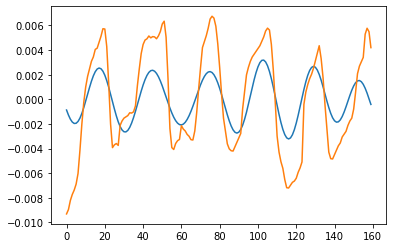

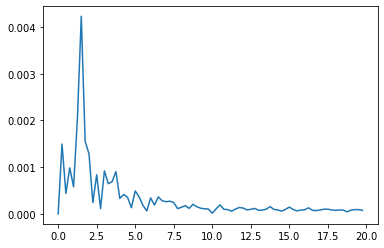

 9 Participant4/2021-10-29/rg_20211029-153037.csv ===========================
Index of row index:  9
Number of Peaks in time based:  10
AMP:  [0.         0.00059799 0.00079576 0.0004923  0.00122823 0.00070514
 0.00264678 0.00317497 0.00099312 0.00008137 0.00026388 0.00062184
 0.00049522 0.00036375 0.00023618 0.00046758 0.00020432 0.00031824
 0.0003858  0.00030821 0.00034745 0.0003502  0.00026259 0.00005135
 0.00016609 0.00018139 0.00024493 0.00019568 0.00021743 0.00013733
 0.00011434 0.0002009  0.00007295 0.0001421  0.00003812 0.00004595
 0.00013792 0.00004198 0.00007582 0.00004577 0.0000642  0.00007618
 0.0001049  0.00004345 0.00005412 0.00001856 0.00008729 0.00003302
 0.00008284 0.00004878 0.00003598 0.00005334 0.00004013 0.00008045
 0.00002749 0.00001364 0.00005124 0.00004422 0.00004444 0.00003408
 0.00000877 0.00006952 0.00004216 0.00004881 0.00006436 0.0000197
 0.00004236 0.00002599 0.00004873 0.00004689 0.00002371 0.00006679
 0.00002483 0.00005914 0.00004849 0.00003376 0.00006002

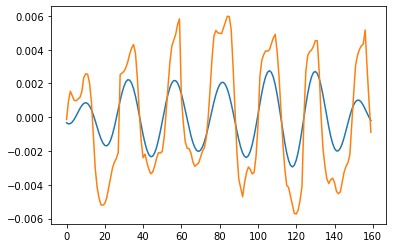

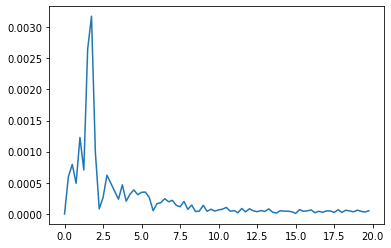

 10 Participant4/2021-10-29/rg_20211029-182954.csv ===========================
Index of row index:  10
Number of Peaks in time based:  6
AMP:  [0.         0.00134706 0.00098415 0.00070229 0.00088661 0.0014505
 0.00247557 0.00055857 0.00036739 0.00027785 0.0002995  0.00065626
 0.0003628  0.00016787 0.00012461 0.00023947 0.00020736 0.00031376
 0.00026462 0.0002041  0.00013632 0.00005037 0.00013024 0.00018106
 0.00009193 0.00006132 0.00010773 0.00003611 0.0000699  0.00018966
 0.00008243 0.00005634 0.00004278 0.00007186 0.00004716 0.00005131
 0.00005233 0.00003988 0.00003096 0.00008303 0.00002309 0.00004944
 0.0000222  0.00005655 0.00003801 0.00002322 0.00005017 0.00003674
 0.00003357 0.00003    0.00002051 0.00006802 0.00002052 0.00001571
 0.00004899 0.00005064 0.00003116 0.00005145 0.00002097 0.00004642
 0.00002786 0.00001573 0.00002092 0.0000325  0.00003973 0.00003064
 0.00003456 0.00003126 0.00002098 0.00003747 0.00001385 0.00003086
 0.00002435 0.00004524 0.00003719 0.00001683 0.0000184

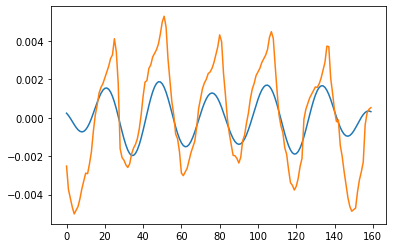

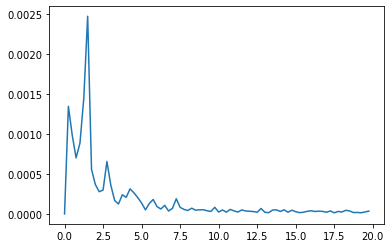

 11 Participant4/2021-10-30/rg_20211030-185943.csv ===========================
Index of row index:  11
Number of Peaks in time based:  8
AMP:  [0.         0.00087703 0.00068624 0.00027514 0.00015958 0.00536689
 0.00115556 0.00146373 0.00050615 0.00013875 0.00107829 0.00149677
 0.00104653 0.00045416 0.00015065 0.00055578 0.00049653 0.00035473
 0.00029167 0.0006165  0.00042915 0.00105591 0.00032512 0.00027053
 0.00021893 0.00008216 0.00029631 0.00008345 0.00017002 0.00020743
 0.00042979 0.00031716 0.00021945 0.00016223 0.00007688 0.00017941
 0.00016794 0.00016797 0.00014277 0.00010089 0.00017563 0.00018275
 0.00009375 0.00009597 0.00006907 0.00020681 0.00016391 0.00007446
 0.00003044 0.00011706 0.00004098 0.00012844 0.00006404 0.00004816
 0.00012647 0.00010221 0.00014723 0.00005372 0.00002264 0.00007617
 0.00004272 0.00011401 0.00005128 0.0000479  0.000105   0.00005528
 0.00015472 0.00006377 0.00004256 0.00006738 0.00003382 0.00010803
 0.00006634 0.00004658 0.00007246 0.00005628 0.000085

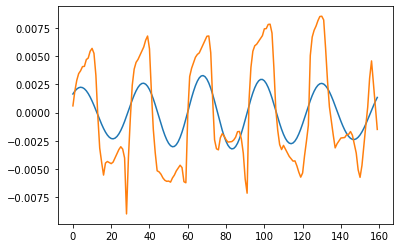

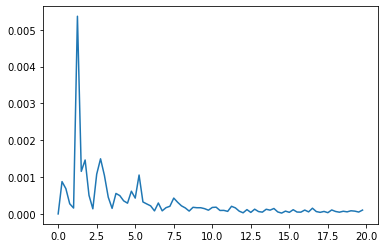

 12 Participant4/2021-10-30/rg_20211030-095315.csv ===========================
Index of row index:  12
Number of Peaks in time based:  10
AMP:  [0.         0.00014815 0.00008498 0.00028395 0.00082889 0.00429475
 0.00044069 0.00028912 0.00060239 0.00058577 0.00092147 0.00012074
 0.00035432 0.00051333 0.00033234 0.00110642 0.00027462 0.00016559
 0.00008439 0.00014815 0.00036682 0.00031642 0.00022682 0.00019283
 0.00031495 0.00044288 0.00018296 0.0001216  0.00004625 0.00016973
 0.0002496  0.00006549 0.00013468 0.0000724  0.00010578 0.00015483
 0.00004863 0.00005128 0.00010754 0.00002204 0.00013452 0.00003784
 0.00001838 0.00006906 0.00000453 0.0001446  0.000084   0.00005093
 0.00004401 0.00003712 0.00011752 0.00007482 0.00004306 0.00006998
 0.00005262 0.00014528 0.0000573  0.00004006 0.00002711 0.00007029
 0.00009805 0.00007962 0.00002739 0.00000455 0.00007394 0.00011096
 0.00001439 0.00005516 0.00002298 0.00005148 0.0000653  0.00003097
 0.00004273 0.00003888 0.00003737 0.00006269 0.00001

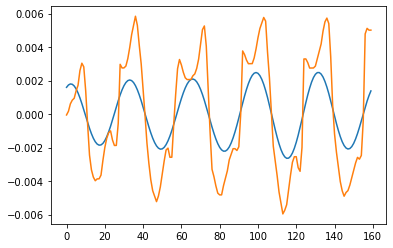

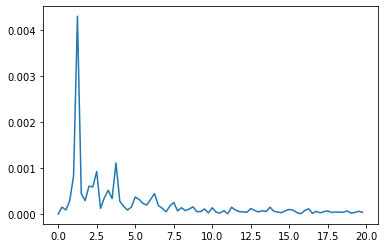

 13 Participant4/2021-10-31/rg_20211031-133028.csv ===========================
Index of row index:  13
Number of Peaks in time based:  9
AMP:  [0.         0.00134568 0.00078231 0.00049081 0.00128704 0.00215534
 0.00216756 0.00093368 0.00035864 0.00003546 0.00036306 0.00017403
 0.00061322 0.00037068 0.00030608 0.00059587 0.00062676 0.00022693
 0.00011045 0.00022489 0.00033067 0.00003622 0.00025705 0.00006981
 0.00011054 0.00017145 0.00017076 0.00005025 0.00012265 0.00025128
 0.00015435 0.00004654 0.00014795 0.00001728 0.00011902 0.00004649
 0.0000764  0.00003795 0.00009005 0.00006956 0.00003582 0.00006196
 0.0000726  0.00004748 0.00001179 0.00008188 0.00008556 0.0000526
 0.00010528 0.00000278 0.00005055 0.00010255 0.00005121 0.00005518
 0.00004751 0.00010573 0.00008194 0.00004326 0.00008232 0.00004615
 0.00012739 0.00005541 0.0000798  0.0000492  0.0000795  0.00007026
 0.00006494 0.00003194 0.00006365 0.00008155 0.00007079 0.00002522
 0.00005912 0.0000146  0.0000511  0.00004468 0.0000304

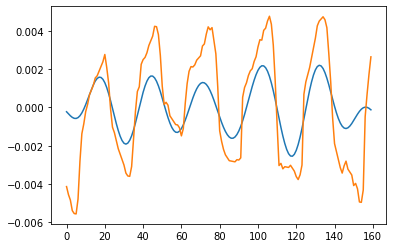

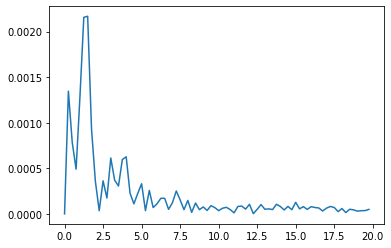

 14 Participant4/2021-10-31/rg_20211031-190553.csv ===========================
Index of row index:  14
Number of Peaks in time based:  7
AMP:  [0.         0.00009687 0.00145426 0.0023131  0.00076554 0.00362057
 0.00182998 0.00035054 0.00029634 0.00061017 0.00026173 0.00141733
 0.0004008  0.0005123  0.00018712 0.00027734 0.00037758 0.00057983
 0.00035231 0.00014808 0.00027908 0.00026835 0.00028474 0.00011974
 0.00016194 0.00012669 0.0002022  0.00018798 0.00009093 0.00020943
 0.0000309  0.00014341 0.00015037 0.00005815 0.00005426 0.00008303
 0.00007878 0.00010558 0.00005464 0.00001277 0.00010728 0.00003372
 0.00007885 0.00005849 0.00002806 0.0000648  0.00011751 0.00000816
 0.00008096 0.00003321 0.0000816  0.00011251 0.00005766 0.00008665
 0.00005324 0.00006587 0.00013222 0.00007241 0.00007021 0.00006877
 0.00003973 0.00011782 0.0000808  0.00005773 0.0000764  0.00007637
 0.00006239 0.00008449 0.00001896 0.00009391 0.00004251 0.00005106
 0.00006222 0.00000861 0.0000543  0.00004852 0.000028

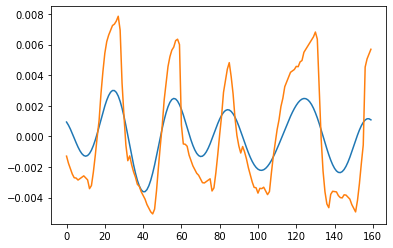

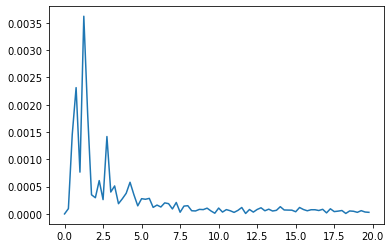

 15 Participant4/2021-10-22/rg_20211022-133556.csv ===========================
Index of row index:  15
Number of Peaks in time based:  14
AMP:  [0.         0.00052006 0.00053269 0.00105806 0.000511   0.00130269
 0.00316682 0.00043186 0.00106523 0.00056906 0.0002914  0.00048167
 0.00074966 0.00009479 0.00072257 0.00049633 0.00041516 0.00019567
 0.00025275 0.00025254 0.00014253 0.00041489 0.00041736 0.00008981
 0.00019661 0.00024982 0.00024355 0.00009929 0.00023737 0.00028904
 0.00025559 0.00016336 0.00010955 0.00019183 0.00014077 0.00008407
 0.00007729 0.00008505 0.00010222 0.00010525 0.00013602 0.00004655
 0.00017897 0.0000793  0.00004356 0.00011134 0.00004257 0.00005518
 0.00010047 0.0000546  0.0000584  0.00007202 0.00004291 0.00006555
 0.00012472 0.00004862 0.00009688 0.00006795 0.00005558 0.00011222
 0.00004548 0.00011349 0.00003226 0.00005238 0.00011845 0.00005288
 0.00008732 0.00004542 0.00008546 0.00002691 0.0000803  0.00012325
 0.00007258 0.00006096 0.00004362 0.00007318 0.00008

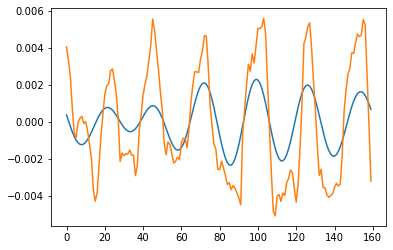

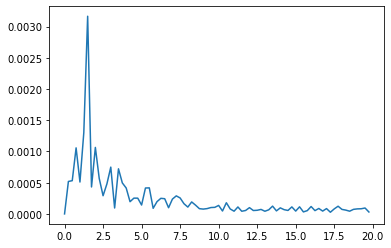

 16 Participant4/2021-10-22/rg_20211022-053129.csv ===========================
Index of row index:  16
Number of Peaks in time based:  13
AMP:  [0.         0.00024024 0.00042909 0.00044826 0.00062057 0.00015312
 0.00084561 0.00071485 0.0020114  0.00017661 0.00045408 0.00030534
 0.00049927 0.00010948 0.0005492  0.0003946  0.0014153  0.00022496
 0.00059183 0.00005331 0.00023049 0.00035138 0.00017459 0.00006233
 0.00017289 0.00010225 0.0001597  0.00015582 0.00024896 0.00017435
 0.00016237 0.00014167 0.00023526 0.00007705 0.00011783 0.00013648
 0.00002354 0.00015736 0.00002309 0.00005461 0.00004489 0.00005121
 0.00001655 0.00002709 0.00002761 0.00005211 0.00005068 0.00001909
 0.00004222 0.00003554 0.00003    0.0000167  0.00006092 0.00005221
 0.00003538 0.00002005 0.00004701 0.00003277 0.00007946 0.00001767
 0.00008318 0.00002441 0.00002541 0.00001689 0.00003483 0.00003645
 0.00001787 0.00008345 0.00002434 0.00001044 0.00003112 0.00003241
 0.0000371  0.00002061 0.00004916 0.00001433 0.00004

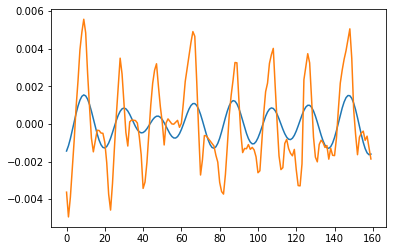

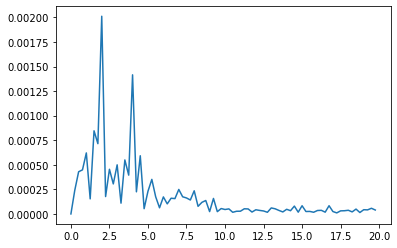

 17 Participant4/2021-10-23/rg_20211023-190114.csv ===========================
Index of row index:  17
Number of Peaks in time based:  7
AMP:  [0.         0.00117681 0.00057222 0.00110997 0.00087434 0.00146784
 0.00573118 0.00359423 0.0021315  0.00053267 0.00051319 0.00010386
 0.00078216 0.00105245 0.0009159  0.00024839 0.00029625 0.00030939
 0.00091575 0.00020289 0.00026271 0.00018679 0.00016685 0.00040136
 0.00022051 0.00025973 0.00019327 0.00006901 0.00014821 0.00015908
 0.000162   0.00006484 0.00011573 0.00013834 0.00007243 0.00014618
 0.00010043 0.00003332 0.00012234 0.00017389 0.00008872 0.00006786
 0.00000281 0.00004422 0.0001304  0.00010086 0.00008362 0.00011688
 0.00004056 0.00010219 0.00006818 0.0000596  0.00005551 0.00009394
 0.00010686 0.00010813 0.00005378 0.00010343 0.00011745 0.00008168
 0.00006579 0.00008092 0.00006334 0.0001086  0.0000689  0.00010336
 0.00013392 0.00008709 0.00007198 0.00007043 0.00007205 0.00011416
 0.00006461 0.00006735 0.00006697 0.00001545 0.000079

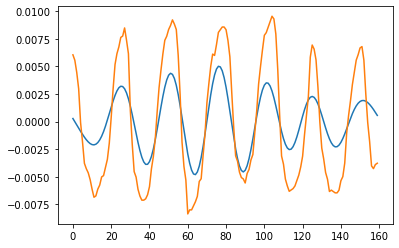

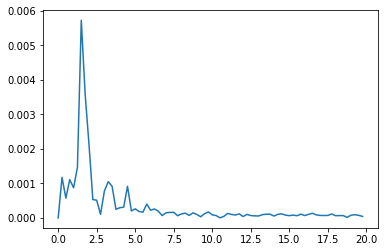

 18 Participant4/2021-10-24/rg_20211024-093205.csv ===========================
Index of row index:  18
Number of Peaks in time based:  9
AMP:  [0.         0.00203905 0.00009109 0.00132228 0.00049269 0.00227542
 0.0027487  0.00042257 0.00046965 0.00094878 0.00089552 0.00065186
 0.00060506 0.00095238 0.00058287 0.00006202 0.0009065  0.0005735
 0.00060565 0.00028397 0.00037257 0.00024037 0.00024952 0.0001749
 0.00030134 0.00019907 0.00012452 0.00040583 0.00029143 0.00038754
 0.00026348 0.00032296 0.00008846 0.00016665 0.00021581 0.0002037
 0.00021274 0.00007517 0.00020358 0.00014405 0.00012627 0.0002179
 0.00005638 0.00008735 0.00009982 0.00006057 0.00013383 0.00006177
 0.00011137 0.0000614  0.00006801 0.00008479 0.00010044 0.00006139
 0.00003777 0.00010134 0.00009494 0.0000681  0.00006594 0.00009502
 0.00008778 0.00002144 0.00012298 0.00006753 0.00013883 0.00009696
 0.00005073 0.00011136 0.00005202 0.00008488 0.0000877  0.00006358
 0.00008601 0.0000515  0.00010455 0.00006615 0.0000956  0

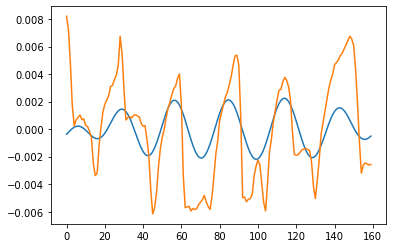

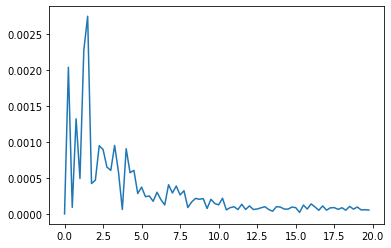

 19 Participant4/2021-10-28/lg_20211028-115244.csv ===========================
Index of row index:  19
Number of Peaks in time based:  7
AMP:  [0.         0.0001339  0.00089353 0.00062416 0.00087909 0.00139241
 0.00289715 0.00100648 0.00010546 0.00045723 0.00012791 0.00012324
 0.0003465  0.00030444 0.00022761 0.00023587 0.00016302 0.00015181
 0.00005768 0.00012287 0.00009889 0.00006896 0.00011497 0.0001159
 0.00006463 0.00010069 0.00004089 0.00005345 0.00001017 0.00006832
 0.0000367  0.00008025 0.00003506 0.00002873 0.00003885 0.00001192
 0.00001186 0.00005075 0.00004225 0.00001068 0.00001298 0.00004555
 0.00003397 0.00002631 0.0000257  0.00002228 0.00001114 0.00003762
 0.00002858 0.00003217 0.00001841 0.00000884 0.00001079 0.00002379
 0.00001968 0.00002747 0.00001883 0.00001212 0.00001891 0.00001712
 0.00001636 0.00002021 0.00000481 0.0000129  0.00001852 0.00001733
 0.00001777 0.00000384 0.00001968 0.00001429 0.00000728 0.00001163
 0.00000978 0.00001722 0.00001082 0.00001757 0.0000270

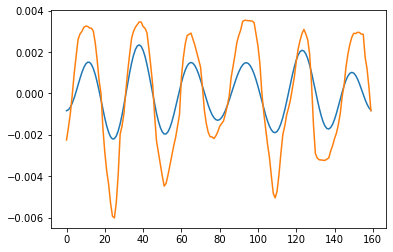

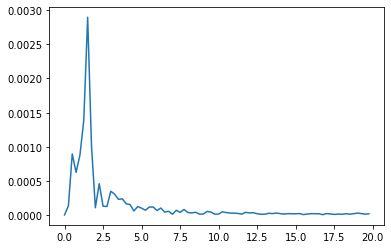

 20 Participant4/2021-10-28/lg_20211028-175651.csv ===========================
Index of row index:  20
Number of Peaks in time based:  6
AMP:  [0.         0.00008397 0.00026246 0.00009614 0.00029744 0.00046135
 0.00218119 0.00007829 0.00012724 0.00016228 0.00012324 0.00018016
 0.00037934 0.00031714 0.00020643 0.00008811 0.00013267 0.0002131
 0.00019729 0.00008029 0.00014665 0.00002939 0.00004958 0.0000651
 0.00002687 0.00012007 0.00010543 0.00004625 0.00002644 0.00004344
 0.00005214 0.00002544 0.00007024 0.00002289 0.00003283 0.00003185
 0.00003859 0.00001597 0.0000604  0.00004124 0.000008   0.00002464
 0.00001834 0.00004001 0.00004256 0.00004636 0.00002061 0.00002423
 0.00001538 0.00001862 0.00000407 0.00001419 0.00002921 0.00001086
 0.00001464 0.00001485 0.00000195 0.00002436 0.00000272 0.0000099
 0.00002005 0.00000802 0.00001568 0.00001967 0.00001056 0.00000385
 0.00002337 0.00001381 0.00003149 0.00000997 0.00001296 0.00002199
 0.00000851 0.00002345 0.00001585 0.00001705 0.00001332 

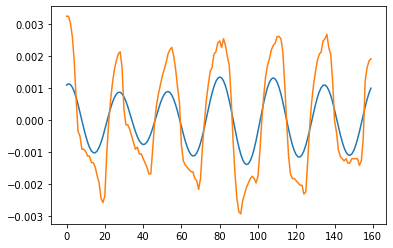

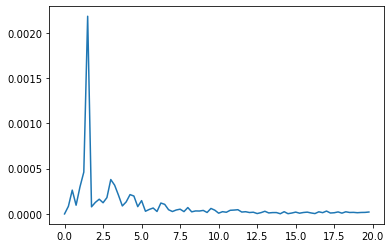

 21 Participant4/2021-10-21/lg_20211021-165751.csv ===========================
Index of row index:  21
Number of Peaks in time based:  13
AMP:  [0.         0.00017273 0.00037973 0.00034383 0.00027979 0.0007646
 0.00159519 0.00031903 0.00013872 0.00020404 0.0000653  0.00026549
 0.00019924 0.00019149 0.00023944 0.00010934 0.00002056 0.00029491
 0.00005474 0.00008974 0.00006677 0.00003314 0.00009932 0.00010834
 0.0000328  0.00007102 0.00001331 0.00006233 0.00008293 0.00003507
 0.00004595 0.00005972 0.00001723 0.00005939 0.00005408 0.00002974
 0.00002149 0.00003992 0.00001807 0.00006978 0.00001688 0.00002837
 0.00004382 0.00002317 0.00003523 0.00001212 0.00004873 0.00000777
 0.0000187  0.00003086 0.0000302  0.00004348 0.00001282 0.00000264
 0.00003959 0.00004544 0.00002165 0.00004813 0.00001654 0.00002029
 0.00004816 0.00000988 0.00003016 0.00001013 0.00001566 0.00004306
 0.0000005  0.00001398 0.00002626 0.0000086  0.00001276 0.00002361
 0.000017   0.00002708 0.0000219  0.00001744 0.000019

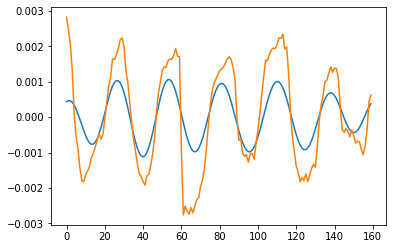

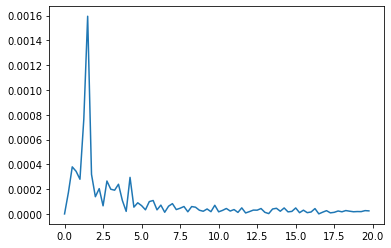

 22 Participant4/2021-10-19/lg_20211019-172844.csv ===========================
Index of row index:  22
Number of Peaks in time based:  15
AMP:  [0.         0.00078341 0.00021607 0.00048373 0.00056727 0.00038051
 0.00124732 0.00355038 0.00045162 0.00045824 0.00018705 0.00023721
 0.00030947 0.00017172 0.00015774 0.00019359 0.00018493 0.00049138
 0.00039117 0.00049631 0.00096222 0.00022684 0.00023086 0.00014779
 0.00017071 0.00024192 0.0000812  0.00016961 0.00016139 0.00011407
 0.0001473  0.00010658 0.00006178 0.00013548 0.00008146 0.00010781
 0.00001331 0.00011009 0.00005991 0.0000709  0.00012654 0.00002535
 0.00009264 0.00001518 0.00002747 0.00008567 0.00006249 0.00005387
 0.00001035 0.00004197 0.00007985 0.00001291 0.00006811 0.00001257
 0.00005069 0.00005852 0.00001776 0.00008495 0.00003843 0.00008815
 0.00007446 0.00004239 0.00005027 0.00005798 0.00004191 0.00008606
 0.00003478 0.00003651 0.00006579 0.00003735 0.0000943  0.00002398
 0.00000785 0.000056   0.00003558 0.00003841 0.00002

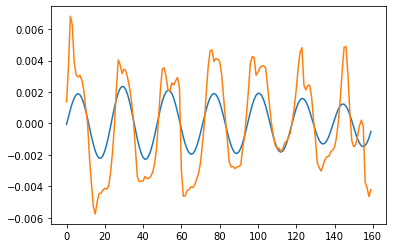

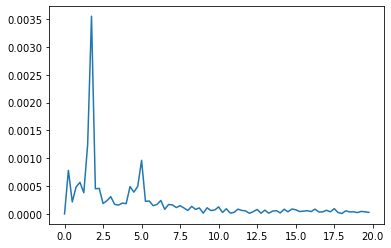

 23 Participant4/2021-10-19/lg_20211019-214518.csv ===========================
Index of row index:  23
 25 Participant4/2021-10-27/lg_20211027-184737.csv ===========================
Index of row index:  25
Number of Peaks in time based:  10
AMP:  [0.         0.00008066 0.00015113 0.00018706 0.00036096 0.00063189
 0.00113945 0.00021223 0.00023214 0.00015199 0.00018642 0.00044958
 0.0001856  0.00013486 0.00020165 0.00009656 0.00016896 0.00016223
 0.00009349 0.00006121 0.0000372  0.00004774 0.00008612 0.00004553
 0.00006533 0.00002773 0.00002893 0.00002247 0.00005192 0.00003792
 0.00002117 0.00005409 0.00006078 0.00004305 0.00001942 0.00001789
 0.00001566 0.00002183 0.00002156 0.00002178 0.00003278 0.00002063
 0.00005692 0.00000861 0.00001923 0.00001119 0.00001587 0.00002339
 0.0000193  0.0000251  0.00001246 0.00002933 0.00000252 0.00000491
 0.00003429 0.00004251 0.00002337 0.000021   0.00001372 0.00001906
 0.00001757 0.00003491 0.00000447 0.0000201  0.00002058 0.00001787
 0.0000209  0.00

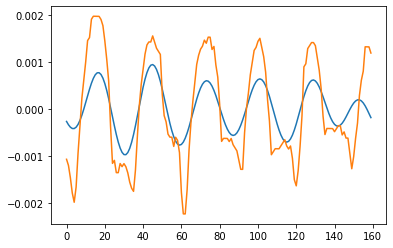

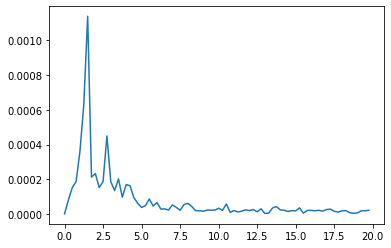

 26 Participant4/2021-10-18/lg_20211018-184648.csv ===========================
Index of row index:  26
Number of Peaks in time based:  7
AMP:  [0.         0.00082204 0.00055973 0.00098218 0.00051828 0.00362511
 0.00018623 0.00003274 0.00043061 0.00052031 0.0009272  0.00026085
 0.00024394 0.00021985 0.00012233 0.00054542 0.00012143 0.00004924
 0.00004249 0.00019572 0.00007617 0.00009934 0.00012297 0.00002621
 0.00009229 0.00012239 0.00002385 0.00006918 0.00003119 0.00006276
 0.00005099 0.00003703 0.00005125 0.00005544 0.00010208 0.00005262
 0.00002405 0.00004794 0.000028   0.00004385 0.0000153  0.00000254
 0.00001606 0.00000718 0.00004581 0.00003831 0.00001679 0.00002186
 0.00000156 0.00001579 0.00003669 0.00003308 0.00002154 0.00001662
 0.00002882 0.00002945 0.00001902 0.00002568 0.00001609 0.00000229
 0.00000297 0.00001089 0.0000101  0.00000357 0.00001203 0.00003387
 0.00002147 0.00001533 0.00000809 0.00000698 0.00001685 0.0000057
 0.00001316 0.00001809 0.00001923 0.00000564 0.0000069

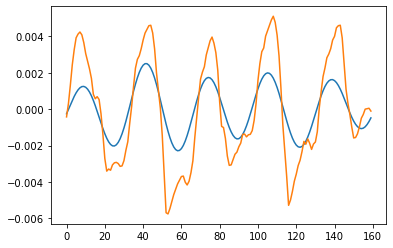

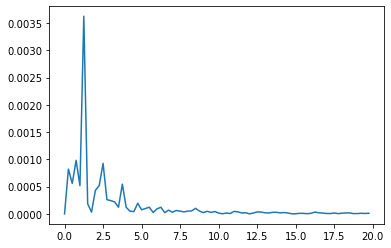

 28 Participant4/2021-10-20/lg_20211020-105349.csv ===========================
Index of row index:  28
Number of Peaks in time based:  15
AMP:  [0.         0.00027954 0.00095849 0.00023989 0.00085848 0.00085367
 0.00142571 0.00155611 0.00052636 0.00027319 0.00038898 0.00031403
 0.00020568 0.00025235 0.0000962  0.00009059 0.00000784 0.0000803
 0.00021657 0.0001889  0.00007959 0.00007102 0.00002536 0.00010838
 0.0000549  0.00008401 0.0001119  0.00008243 0.00008231 0.00010358
 0.00009486 0.00005672 0.00001384 0.00004128 0.00006494 0.00000448
 0.00002009 0.00006684 0.00006878 0.00003395 0.00003312 0.00004072
 0.00008284 0.000018   0.0000586  0.00005876 0.00001186 0.00004673
 0.0000567  0.00002957 0.00007423 0.00000484 0.00005046 0.00001102
 0.00002644 0.00004364 0.00003547 0.00003035 0.00001075 0.00001611
 0.000039   0.0000058  0.00002916 0.00003434 0.00004843 0.00000466
 0.00005643 0.0000267  0.00004303 0.00002651 0.00004805 0.00002144
 0.00003072 0.00001751 0.00001918 0.00001199 0.000033

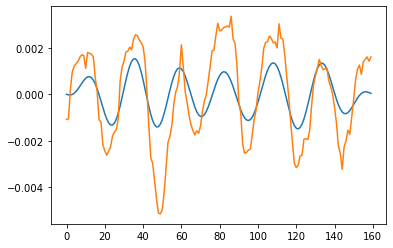

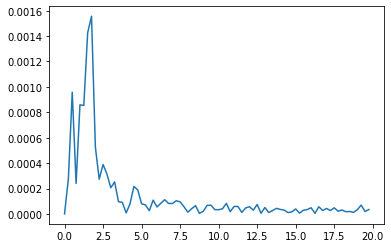

 29 Participant4/2021-10-29/lg_20211029-153037.csv ===========================
Index of row index:  29
 30 Participant4/2021-10-29/lg_20211029-182954.csv ===========================
Index of row index:  30
Number of Peaks in time based:  7
AMP:  [0.         0.00068789 0.0017441  0.00210715 0.00163066 0.00254047
 0.00459607 0.0016112  0.00136955 0.00105791 0.00074225 0.00282313
 0.00060682 0.00087496 0.00043458 0.00025553 0.00073809 0.00033951
 0.00020196 0.00017225 0.00006055 0.00017212 0.00004079 0.00008332
 0.00022472 0.0000498  0.00012765 0.00013552 0.00010934 0.0000768
 0.00011324 0.00010231 0.00002502 0.00004197 0.00007009 0.00007961
 0.000153   0.00002213 0.00006932 0.00011155 0.00007354 0.00007961
 0.0000198  0.00001045 0.00004653 0.00001948 0.0000396  0.00000917
 0.00002469 0.00004791 0.00005061 0.00006239 0.00001568 0.00003783
 0.00009003 0.00002665 0.00003282 0.00000717 0.00002895 0.00006182
 0.00003983 0.00005316 0.00001009 0.00002351 0.00005657 0.00003093
 0.00004174 0.0000

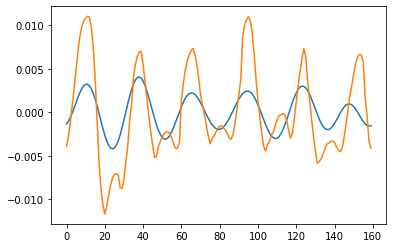

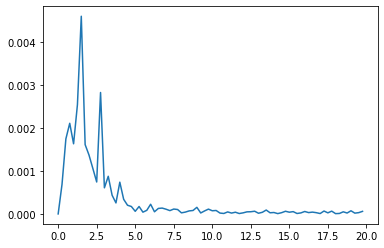

 31 Participant4/2021-10-30/lg_20211030-185943.csv ===========================
Index of row index:  31
Number of Peaks in time based:  10
AMP:  [0.         0.00066088 0.00168671 0.00076252 0.00207288 0.00189794
 0.00242113 0.00076083 0.0003706  0.00028714 0.00040992 0.00044901
 0.00038556 0.00014643 0.00030074 0.00068545 0.00047943 0.00086305
 0.00023913 0.00032396 0.00019942 0.00019253 0.00019025 0.00023085
 0.00014579 0.00020612 0.00019474 0.00012564 0.00020036 0.00018937
 0.00013432 0.00007217 0.00009225 0.00015586 0.00009653 0.00013548
 0.0000567  0.00008768 0.00006077 0.00008553 0.00013079 0.00007242
 0.00007697 0.00008925 0.00007924 0.00009839 0.0000788  0.00002858
 0.00005465 0.00003206 0.00004207 0.00010549 0.00005619 0.00009335
 0.00005445 0.00005368 0.00010126 0.00005427 0.00006641 0.00007023
 0.00001526 0.00006867 0.00006823 0.00004297 0.00010168 0.00003663
 0.00004736 0.00005414 0.00003933 0.00008942 0.00006661 0.00001584
 0.0000484  0.00002789 0.00008213 0.00008447 0.00004

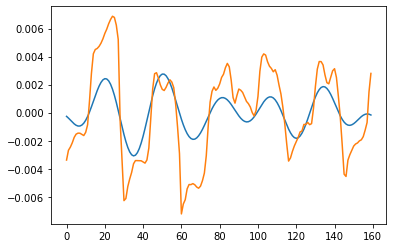

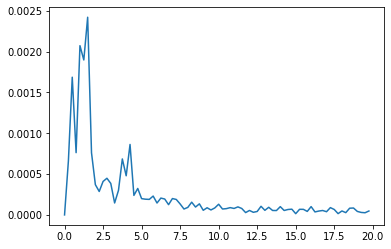

 32 Participant4/2021-10-30/lg_20211030-095315.csv ===========================
Index of row index:  32
Number of Peaks in time based:  9
AMP:  [0.         0.00053695 0.00048098 0.00040304 0.00063795 0.00078878
 0.00387736 0.00116554 0.00057076 0.00011888 0.00052847 0.00015669
 0.00173021 0.00030064 0.00052212 0.0002818  0.00014995 0.00025029
 0.00031804 0.00054328 0.00024957 0.00009938 0.00024303 0.0000194
 0.00028692 0.00029985 0.00010854 0.00002342 0.00011168 0.00002077
 0.00007516 0.00017883 0.00006653 0.00006059 0.00003284 0.00005115
 0.00007762 0.00015615 0.00002646 0.00009677 0.00005334 0.00005095
 0.00001888 0.00009941 0.00002474 0.00005564 0.00002737 0.00004558
 0.00001948 0.0000711  0.00004077 0.00007997 0.00003539 0.00004217
 0.00001733 0.00006792 0.00003075 0.00001633 0.0000212  0.00004491
 0.00003085 0.0000301  0.00001654 0.00003019 0.00003129 0.00004504
 0.00002733 0.00000885 0.00000676 0.00000285 0.00001818 0.00001826
 0.00000981 0.00000603 0.00001297 0.00003336 0.0000185

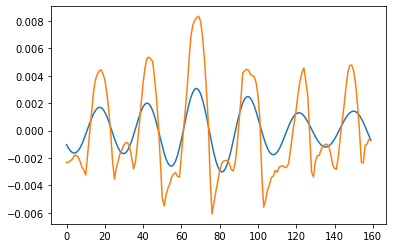

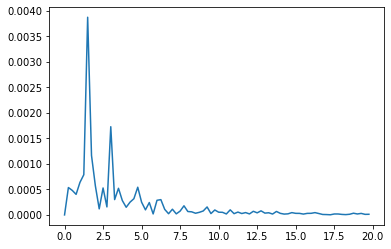

 33 Participant4/2021-10-31/lg_20211031-190553.csv ===========================
Index of row index:  33
Number of Peaks in time based:  7
AMP:  [0.         0.00140874 0.0009048  0.00041572 0.00130505 0.00459729
 0.00317551 0.00169313 0.00034444 0.00069854 0.0010475  0.00246457
 0.00084232 0.00006738 0.00016946 0.00013955 0.00095565 0.00005074
 0.00013893 0.00015559 0.00006796 0.00013001 0.00031302 0.0002415
 0.00015412 0.00010327 0.00025454 0.00007177 0.0000447  0.0001952
 0.00012157 0.00016961 0.00005587 0.00012052 0.00011608 0.00005414
 0.00008778 0.00005624 0.00011356 0.00006498 0.0000259  0.00002134
 0.00003058 0.00012504 0.00006021 0.00002675 0.00003014 0.00008049
 0.00006026 0.00005515 0.00004935 0.00007604 0.00007428 0.00008565
 0.00004839 0.00002687 0.00004557 0.00009839 0.00009274 0.00003479
 0.00006745 0.00009994 0.00005677 0.00003829 0.00007798 0.00004869
 0.00006777 0.00005023 0.00005747 0.00002101 0.00005932 0.00005908
 0.00006528 0.00003295 0.00002988 0.00002305 0.00003702

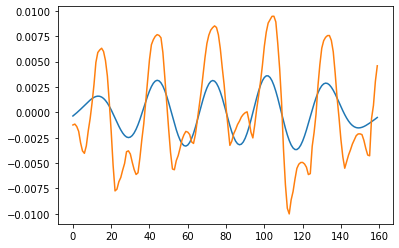

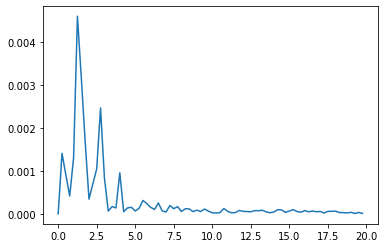

 34 Participant4/2021-10-31/lg_20211031-133028.csv ===========================
Index of row index:  34
Number of Peaks in time based:  8
AMP:  [0.         0.00176609 0.00066234 0.00054628 0.00105149 0.005356
 0.00855149 0.00296901 0.00138254 0.00090542 0.00121209 0.00357867
 0.00176344 0.00093122 0.00067101 0.00108752 0.00088391 0.00112279
 0.00021011 0.00042463 0.00058271 0.00022018 0.00091512 0.00033372
 0.00053581 0.00067781 0.00016801 0.00046225 0.00027324 0.00047574
 0.00025852 0.00024742 0.00040691 0.00008993 0.00024458 0.00008685
 0.00017644 0.00024004 0.00011634 0.00027168 0.00000715 0.00030575
 0.00024454 0.00017701 0.00021485 0.0000928  0.00034651 0.00002895
 0.00015034 0.00012034 0.00012208 0.0002633  0.00003705 0.00014768
 0.00011372 0.00017074 0.00016725 0.00009626 0.00019972 0.00012335
 0.00016506 0.00009914 0.00010939 0.00012461 0.00016067 0.00011547
 0.0000354  0.00017148 0.00013216 0.00015486 0.00016806 0.00010115
 0.00015178 0.00012499 0.00018918 0.00008614 0.00014168

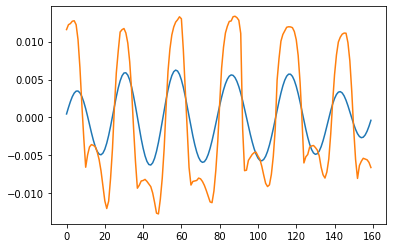

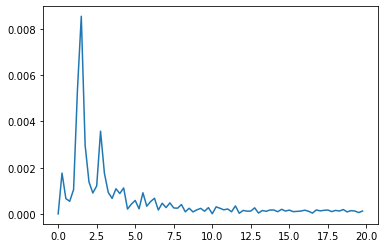

 35 Participant4/2021-10-22/lg_20211022-053129.csv ===========================
Index of row index:  35
Number of Peaks in time based:  13
AMP:  [0.         0.0006566  0.00022489 0.0001964  0.000481   0.00024538
 0.0003272  0.00162473 0.00009863 0.00022066 0.00027589 0.00002539
 0.0001912  0.00009713 0.0002668  0.0001162  0.00005383 0.0000934
 0.00007355 0.00015072 0.00001497 0.0001714  0.00010102 0.00008331
 0.0001118  0.00009519 0.00009229 0.00010428 0.00006663 0.00010693
 0.00005649 0.00003692 0.00003876 0.0000654  0.00002585 0.00002744
 0.00006052 0.00001705 0.00005762 0.00003318 0.00004032 0.00007521
 0.00001672 0.00006118 0.00001281 0.00002826 0.00003384 0.0000457
 0.00000758 0.00003623 0.00001072 0.00000755 0.00002    0.00002199
 0.00000707 0.00001369 0.00000604 0.00001834 0.00001562 0.00000769
 0.00001476 0.00001031 0.00002575 0.00000182 0.00003244 0.00001304
 0.00001624 0.00001285 0.00001044 0.00002062 0.0000071  0.00002339
 0.00001287 0.00002778 0.00001557 0.00002331 0.0000241

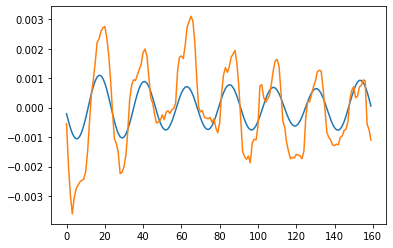

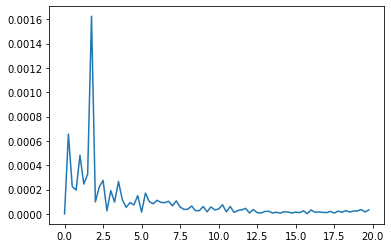

 36 Participant4/2021-10-22/lg_20211022-133556.csv ===========================
Index of row index:  36
Number of Peaks in time based:  15
AMP:  [0.         0.00211852 0.0003263  0.00026652 0.0005041  0.00079981
 0.0020426  0.00029965 0.00051432 0.00019416 0.00024231 0.00024258
 0.00063869 0.00016222 0.00013366 0.00017158 0.00037261 0.00061247
 0.00034258 0.0000812  0.00029352 0.00031004 0.00015367 0.00034957
 0.00014014 0.00003743 0.00015372 0.00005483 0.00018265 0.00013384
 0.00008119 0.00003632 0.00007731 0.00004202 0.00002572 0.00008507
 0.00007405 0.00001651 0.00005335 0.00005599 0.00003822 0.00005055
 0.00005803 0.0000527  0.00000575 0.00003661 0.0000516  0.00002559
 0.00005856 0.00002593 0.0000168  0.00000943 0.00000969 0.0000406
 0.00002616 0.00004031 0.00001067 0.00004266 0.00002698 0.00003572
 0.00002338 0.00001443 0.00002794 0.00004291 0.00001569 0.00001918
 0.00002488 0.00003682 0.00001697 0.00001737 0.00001513 0.00002263
 0.000044   0.00001188 0.0000315  0.00000052 0.000014

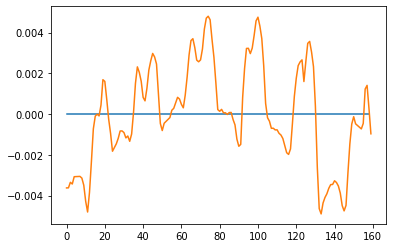

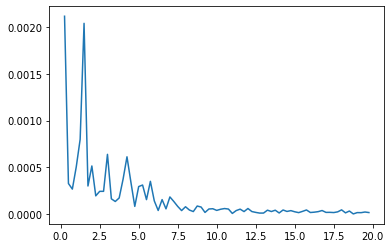

 37 Participant4/2021-10-23/lg_20211023-190114.csv ===========================
Index of row index:  37
Number of Peaks in time based:  14
AMP:  [0.         0.0003225  0.00079784 0.00064075 0.00051015 0.00060753
 0.00316593 0.00056452 0.00075745 0.00020807 0.00057706 0.00046785
 0.00087798 0.00024877 0.00045753 0.00015575 0.00035144 0.00024698
 0.00035969 0.00016209 0.00018158 0.00010769 0.00016013 0.00021069
 0.00011731 0.00004414 0.00004799 0.00001888 0.0000997  0.00002997
 0.00002219 0.00004931 0.00005629 0.000027   0.00003081 0.00002426
 0.00009293 0.0000128  0.00004618 0.00001739 0.00002995 0.0000432
 0.00002378 0.00002612 0.00001725 0.00001835 0.00002477 0.00004376
 0.00000327 0.00002978 0.0000213  0.00001906 0.0000452  0.00000472
 0.00004799 0.00001029 0.00001891 0.00002528 0.00001762 0.00003002
 0.00003271 0.00001102 0.00001634 0.0000295  0.00001623 0.00001313
 0.00003483 0.00001615 0.00001285 0.00000436 0.00002485 0.00001228
 0.00001285 0.00002085 0.00000253 0.00000996 0.000036

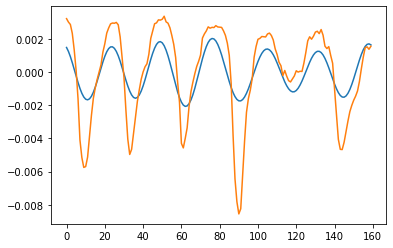

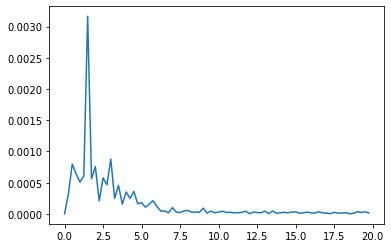

 38 Participant4/2021-10-24/lg_20211024-093205.csv ===========================
Index of row index:  38
Number of Peaks in time based:  10
AMP:  [0.         0.00012006 0.00029978 0.00028059 0.00022595 0.00160277
 0.00202683 0.00043597 0.00005574 0.00034474 0.00038678 0.00084788
 0.0012017  0.00058643 0.00044459 0.00038554 0.00026508 0.00072703
 0.00041561 0.00020679 0.00030283 0.00024545 0.00020913 0.00044826
 0.0001008  0.00023074 0.00019437 0.00013822 0.00022372 0.00005287
 0.00008886 0.0000431  0.00014679 0.00011097 0.00008773 0.00014397
 0.00007196 0.00008294 0.00011383 0.0000272  0.00006637 0.0001591
 0.00001639 0.00013343 0.0000488  0.00007491 0.00009639 0.00007436
 0.00001703 0.00011784 0.00004711 0.00006204 0.00012207 0.00004831
 0.00008846 0.00002467 0.00004524 0.00007089 0.00005149 0.00003567
 0.00003584 0.00001887 0.00002817 0.00003698 0.00003734 0.00002003
 0.00004867 0.00004795 0.00003164 0.00003807 0.00003079 0.00002401
 0.00004026 0.00004586 0.00001911 0.00003789 0.000016

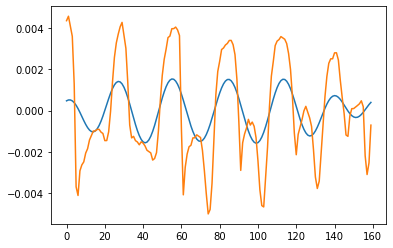

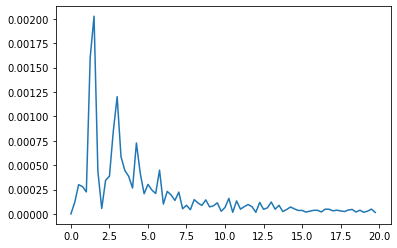

In [111]:
results_p4,peak2peak_diff_freq_list4,peak2peak_diff_time_list4 = read_iotex_data("Participant4","results_p4.csv")


In [93]:

results_p1 =results_p1[results_p1["Method1_TimeBased"] != -911]
fig = go.Figure()
fig.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["HumanRater1"],
    name='HumanRater1',
    marker_color='red'
))
fig.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["RandomPeaks"],
    name='RandomPeaks',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["Method1_TimeBased"],
    name='Method1_TimeBased',
    marker_color='blue'
))
fig.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["Method3_FreqBased"],
    name='Method3_FreqBased',
    marker_color='green'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=results_p1[results_p1["width_threshold"] !=-911]["width_threshold"],  name="(P1) Width Threshold ",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2[results_p2["width_threshold"] !=-911]["width_threshold"], name="(P2) Width Threshold",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3[results_p3["width_threshold"] !=-911]["width_threshold"],  name="(P3) Width Threshold",marker_color = "green"))
fig.add_trace(go.Box(y=results_p4[results_p4["width_threshold"] !=-911]["width_threshold"],  name="(P4) Width Threshold",marker_color = "yellow"))
fig.update_traces( )
fig.show()


In [ ]:
fig = go.Figure()
fig.add_trace(go.Box(y=results_p1["DominantFreq"],  name="(P1) DominantFreq",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2["DominantFreq"], name="(P2) DominantFreq",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3["DominantFreq"],  name="(P3) DominantFreq",marker_color = "green"))
fig.add_trace(go.Box(y=results_p4["DominantFreq"],  name="(P4)DominantFreq",marker_color = "yellow"))
fig.update_traces(jitter=0)
fig.update_layout(title='Dominant Frequency')
fig.show()

In [ ]:


fig = go.Figure()
fig.add_trace(go.Box(y=results_p1["HumanRater1"],  name="(P1) HumanRater1",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p1["HumanRater2"], name="(P1) HumanRater2",marker_color = "purple"))
fig.add_trace(go.Box(y=results_p2["HumanRater1"],  name="(P2) HumanRater1",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p2["HumanRater2"], name="(P2) HumanRater2",marker_color = "blue"))
fig.add_trace(go.Box(y=results_p3["HumanRater1"],  name="(P3) HumanRater1",marker_color = "green"))
fig.add_trace(go.Box(y=results_p3["HumanRater2"], name="(P3) HumanRater2",marker_color = "green"))
fig.update_traces(boxpoints='all', jitter=0)
fig.show()


## Plots for Time Based Peak Detection Results (p2p difference)

In [39]:
def peak2_peak_figures(list_of_numbers2,mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text):
    fig2 = go.Figure([
        go.Scatter(
            name='Mean Peak to peak',
            x=list_of_numbers2,
            y=mean_peak2peak_diff_freq_list2,
            mode='lines',
            line=dict(color='rgb(31, 119, 180)'),
        ),
        go.Scatter(
            name='Upper Bound',
            x=list_of_numbers2,
            y=max_peak2peak_diff_freq_list2,
            mode='lines',
    #         marker=dict(color="#444"),
    #         line=dict(width=0),
    #         showlegend=False
        ),
        go.Scatter(
            name='Lower Bound',
            x=list_of_numbers2,
            y=min_peak2peak_diff_freq_list2,
    #         marker=dict(color="#444"),
    #         line=dict(width=0),
            mode='lines',
    #         fillcolor='rgba(68, 68, 68, 0.3)',
    #         fill='tonexty',
    #         showlegend=False
        )
    ])
    fig2.update_layout(
        xaxis_title='Number of Sessions Left & Right Glove',
        yaxis_title='Peak to peak distance(diff of amplitude)',
        title = title_text,
        hovermode="x",
    #     font=dict(
    #         size=30,
    #     )
    )
    return fig2


In [40]:

list_of_numbers_time1 = list(range(0, len(peak2peak_diff_time_list1)))
mean_peak2peak_diff_time_list1 = peak2peak_diff_time_list1.mean(axis=1)
max_peak2peak_diff_time_list1 = peak2peak_diff_time_list1.max(axis=1)
min_peak2peak_diff_time_list1 = peak2peak_diff_time_list1.min(axis=1)

# print(len(list_of_numbers_time),len(peak2peak_diff_time_list))
title_text1 ='Participant 1: Peak to Peak difference in amplitude (Time Based)'
# peak2_peak_figures(list_of_numbers2,mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text)

fig2 =peak2_peak_figures(list_of_numbers_time1,mean_peak2peak_diff_time_list1,max_peak2peak_diff_time_list1,min_peak2peak_diff_time_list1,title_text1)
fig2.show()


In [41]:


mean_peak2peak_diff_time_list2 = peak2peak_diff_time_list2.mean(axis=1)
max_peak2peak_diff_time_list2 = peak2peak_diff_time_list2.max(axis=1)
min_peak2peak_diff_time_list2 = peak2peak_diff_time_list2.min(axis=1)

list_of_numbers_time2 = list(range(0, len(peak2peak_diff_time_list2)))
print(len(list_of_numbers_time2),len(peak2peak_diff_time_list2))
title_text2 ='Participant 2: Peak to Peak difference in amplitude (Time Based)'

fig2 =peak2_peak_figures(list_of_numbers_time2,mean_peak2peak_diff_time_list2,max_peak2peak_diff_time_list2,min_peak2peak_diff_time_list2,title_text2)
fig2.show()


23 23


In [42]:


mean_peak2peak_diff_time_list3 = peak2peak_diff_time_list3.mean(axis=1)
max_peak2peak_diff_time_list3 = peak2peak_diff_time_list3.max(axis=1)
min_peak2peak_diff_time_list3 = peak2peak_diff_time_list3.min(axis=1)

list_of_numbers_time3 = list(range(0, len(peak2peak_diff_time_list3)))
print(len(list_of_numbers_time2),len(peak2peak_diff_time_list2))
title_text3 ='Participant 3: Peak to Peak difference in amplitude (Time Based)'

fig2 =peak2_peak_figures(list_of_numbers_time3,mean_peak2peak_diff_time_list3,max_peak2peak_diff_time_list3,min_peak2peak_diff_time_list3,title_text3)
fig2.show()


23 23


In [43]:


mean_peak2peak_diff_time_list4 = peak2peak_diff_time_list4.mean(axis=1)
max_peak2peak_diff_time_list4 = peak2peak_diff_time_list4.max(axis=1)
min_peak2peak_diff_time_list4 = peak2peak_diff_time_list4.min(axis=1)

list_of_numbers_time4 = list(range(0, len(peak2peak_diff_time_list4)))
print(len(list_of_numbers_time2),len(peak2peak_diff_time_list4))
title_text4 ='Participant 4: Peak to Peak difference in amplitude (Time Based)'

fig2 = peak2_peak_figures(list_of_numbers_time4,mean_peak2peak_diff_time_list4,max_peak2peak_diff_time_list4,min_peak2peak_diff_time_list4,title_text4)
fig2.show()



23 33


## Dominant Frequency

In [94]:
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq1 = list(range(0, len(peak2peak_diff_freq_list1)))

mean_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.mean(axis=1)
max_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.max(axis=1)
min_peak2peak_diff_freq_list1 = peak2peak_diff_freq_list1.min(axis=1)
title_text5 ='Participant 1: Peak to Peak difference in amplitude (Freq Based)'
 
fig2 = peak2_peak_figures(peak2peak_diff_freq_list1["filename"],mean_peak2peak_diff_freq_list1,max_peak2peak_diff_freq_list1,min_peak2peak_diff_freq_list1,title_text5)
fig2.show()


/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [95]:
peak2peak_diff_freq_list2

,0,1,2,3,4,5,6,filename
0,-0.000171,3.505544e-04,-0.000158,-8.375268e-05,0.000212,-3.835761e-04,0.000359,rg_20210706-105513.csv
1,-0.000128,4.122871e-04,-0.000400,7.541471e-05,0.000146,-2.614576e-04,NaN,rg_20210706-095943.csv
2,0.000435,-1.388372e-04,0.000077,-6.426492e-05,-0.000072,7.716638e-05,-0.000013,rg_20210701-001106.csv
3,0.000219,-2.142875e-04,-0.000049,-2.087192e-04,0.000128,3.134505e-05,NaN,rg_20210701-092555.csv
4,0.000045,NaN,NaN,NaN,NaN,NaN,NaN,rg_20210708-213728.csv
5,-0.000010,6.300329e-05,-0.000292,3.193841e-07,-0.000605,6.688767e-04,NaN,rg_20210628-153436.csv
6,0.000357,-4.255089e-04,-0.000344,-4.052984e-04,0.000265,1.197189e-04,-0.000412,rg_20210628-151121.csv
7,0.000081,2.057448e-07,0.000286,-1.534007e-04,0.000139,-1.534007e-04,0.000073,rg_20210704-080419.csv
8,0.000136,1.363623e-04,-0.000014,-2.371877e-04,-0.000088,1.342786e-04,0.000282,rg_20210702-144253.csv
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rg_20210702-171944.csv


In [96]:
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq_2 = list(range(0, len(peak2peak_diff_freq_list2)))

mean_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.mean(axis=1)
max_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.max(axis=1)
min_peak2peak_diff_freq_list2 = peak2peak_diff_freq_list2.min(axis=1)
title_text6 ='Participant 2: Peak to Peak difference in amplitude (Freq Based)'
fig2 = peak2_peak_figures(peak2peak_diff_freq_list2["filename"],mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text6)
fig2.show()



/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [97]:
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers3 = list(range(0, len(peak2peak_diff_freq_list3)))
print(len(list_of_numbers3),len(peak2peak_diff_freq_list3))

mean_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.mean(axis=1)
max_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.max(axis=1)
min_peak2peak_diff_freq_list3 = peak2peak_diff_freq_list3.min(axis=1)
title_text7 ='Participant 3: Peak to Peak difference in amplitude (Freq Based)'

fig2 = peak2_peak_figures(list_of_numbers_freq_2,mean_peak2peak_diff_freq_list2,max_peak2peak_diff_freq_list2,min_peak2peak_diff_freq_list2,title_text7)
fig2.show()



35 35


/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [98]:
# np.arrange(1,3,len(mean_peak2peak_diff_freq_list))
list_of_numbers_freq4 = list(range(0, len(peak2peak_diff_freq_list4)))
# print(len(list_of_numbers4),len(peak2peak_diff_freq_list4))

mean_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.mean(axis=1)
max_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.max(axis=1)
min_peak2peak_diff_freq_list4 = peak2peak_diff_freq_list4.min(axis=1)
title_text8 ='Participant 4: Peak to Peak difference in amplitude (Freq Based)'


fig2 = peak2_peak_figures(list_of_numbers_freq4,mean_peak2peak_diff_freq_list4,max_peak2peak_diff_freq_list4,min_peak2peak_diff_freq_list4,title_text8)
fig2.show()


/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/Users/shehjarsadhu/opt/anaconda3/envs/edear/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [99]:
df = results_p3[results_p3["HumanRater1"].str.contains("MARK") == False]
df_int =df[df["HumanRater1"].str.contains("HARD") == False]
df_int =df[df["HumanRater1"].str.contains("SIGNAL") == False]
df2 = results_p2[results_p2["HumanRater1"].str.contains("MARK") == False]
df_int2 =df2[df2["HumanRater1"].str.contains("HARD") == False]
df_int2 =df2[df2["HumanRater1"].str.contains("SIGNAL") == False]


In [ ]:
mHeader = ["HumanRating", "TimeBased","FrequencyBased"]
p_4_mean = [results_p4[results_p4["Method1_TimeBased"]!=-911]["Human Rater"].mean(),results_p4[results_p4["Method1_TimeBased"]!=-911]["Method1_TimeBased"].mean(),results_p4[results_p4["Method3_FreqBased"]!=-911]["Method3_FreqBased"].mean()]
p4_std = [results_p4[results_p4["Method1_TimeBased"]!=-911]["Human Rater"].std(),results_p4[results_p4["Method1_TimeBased"]!=-911]["Method1_TimeBased"].std(),results_p4[results_p4["Method3_FreqBased"]!=-911]["Method3_FreqBased"].std()]
p3_mean = [pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["HumanRater1"]).mean() ,pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int[df_int["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]

p3_std = [pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["HumanRater1"]).std(),pd.to_numeric(df_int[df_int["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int[df_int["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]

p2_mean = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).mean(),pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean()]
p2_std = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).std(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).std()]


p1_mean = [pd.to_numeric(results_p1[results_p1["Method1_TimeBased"]!=-911]["HumanRater1"]).mean(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).mean(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).mean() ]
p1_std = [pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["HumanRater1"]).std(), pd.to_numeric(df_int2[df_int2["Method1_TimeBased"]!=-911]["Method1_TimeBased"]).std(),pd.to_numeric(df_int2[df_int2["Method3_FreqBased"]!=-911]["Method3_FreqBased"]).std()]



In [ ]:
pd.DataFrame([mHeader,p_4_mean,p4_std,p3_mean,p3_std,p2_mean,p2_std,p1_mean,p1_std])


In [ ]:
# ===========================================================================================================================
# ========================================= STOP HERE File Writes ==================================================================================
# ===========================================================================================================================
results_p1.to_csv(root_results_write + "results_p1.csv")
results_p2.to_csv(root_results_write + "results_p2.csv")
results_p3.to_csv(root_results_write + "results_p3.csv")



# Results Anlaysis

In [ ]:
results_p1.columns

In [ ]:
results_p1["FileName"].shape

In [ ]:
results_p1 = results_p1[results_p1.Method1_TimeBased != -911.0]

results_p1 = results_p1.drop(["Method3_DominantFreqUpperBound","Method3_DominantFreqLowerBound"],axis=1)


In [ ]:
results_p1.columns

In [ ]:
fig3= go.Figure()
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y=results_p1["Human Rater"],
    name='Human Rater',
    marker_color='green'
))
                  
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y= results_p1["Method1_TimeBased"],#results_p1[results_p1.Method1_TimeBased !=-911.0],
    name='Time Based',
    marker_color='blue'
))
fig3.add_trace(go.Bar(
    x=results_p1["FileName"],
    y= results_p1["Method3_FreqBased"], #results_p1[results_p1.Method3_FreqBased !=-911.0],
    name='Frequency Based',
    marker_color='indianred'
))

fig3.show()
# True Positive Rate (sensitivity) - TP/TP+FN
# True Negative Rate (specificity) - TN/TN+FP



In [ ]:
fig= go.Figure()
fig.add_trace(go.Scatter(
    x=results_p1["FileName"],
    y= results_p1["SNR_mean_std"], #results_p1[results_p1.Method3_FreqBased !=-911.0],
    name='Frequency Based',
    marker_color='#17becf'
))

### Plotting stuff

In [ ]:
fig2 = make_subplots(rows=7, cols=1, vertical_spacing = 0.13,subplot_titles=(
        #str(column_id)+": Number of Peaks- " +str(len(indices)) + "<br>" + "Width: " + str(width) + " Distance: "+ str(heigth) + " Prominance: "+ str(prominance),"Filtered Signal"," Peak Widthds <br> " + "Mean: "+str(results_half[0].mean()),"Peak Prominances <br> Mean: " +str(peak_prominence[0].mean()),"Valley Widths Mean: " + str(valley_widths[0].mean()),"Raw FFT","Filtered FFT "))


In [ ]:
fig2.add_trace(go.Scatter(y = normalized_arr.ravel(),marker_color='teal'), 1, 1)

fig2.add_trace(go.Scatter(
    x=valley_idx,
    y=[normalized_arr.ravel()[j] for j in valley_idx],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        symbol='circle'
    ),
        name='Detectd valleys'
),1,1)
    # indices
fig2.add_trace(go.Scatter(
    x=indices,
    y=peaks,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        symbol='circle'
    ),
        name='Detectd Peaks'
    ),1,1)


In [ ]:
fig2.add_trace(go.Scatter(y = filtered_sig.real,marker_color='teal'), 2, 1)
fig2.add_trace(go.Scatter(
    x=filt_indices,
    y=filt_peaks,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        symbol='circle'
    ),
        name='Detectd Peaks'
    ),2,1)

In [ ]:

fig2.add_trace(go.Scatter(y =normalized_arr.ravel(),marker_color='teal',name=""), 3, 1)
fig2.add_trace(go.Scatter(
    x=filt_indices,
    y=[normalized_arr.ravel()[j] for j in filt_indices],
    mode='markers',
        marker=dict(
            size=5,
            color='blue',
            symbol='circle'
        ),
            name='Detectd Peaks'
        ),3,1)
fig2.add_trace(go.Bar(x=np.arange(0,len(results_half[0])), y=results_half[0],text=results_half[0],
textposition='auto',marker_color='blue', name='Detectd Peaks (Peak Width)'), 4, 1)


In [ ]:
#fig2.add_trace(go.Bar(x=np.arange(0,len(peak_prominence[0])), y=peak_prominence[0],text=peak_prominence[0],
#        textposition='auto',marker_color='blue',name='Detectd Peaks'), 5, 1)
# fig2.add_trace(go.Bar(x=np.arange(0,len(valley_widths[0])), y=valley_widths[0],text=valley_widths[0],
#         textposition='auto',marker_color='red',name='Detectd Valleys'), 6, 1)
fig2.add_trace(go.Scatter(x = filtered_frequency,y = filtered_amplitude,marker_color='teal'), 6, 1)
fig2.add_trace(go.Scatter(x = filt_f,y = filt_P1,marker_color='teal'), 7, 1)
# fig2.update_yaxes(title_text="Voltage", title_font_family="IBM Plex San", row=1, col=1)
# fig2.update_xaxes(title_text="Number of Samples",row=1, col=1)
# fig2.update_yaxes(title_text="Peak Width", title_font_family="IBM Plex San", row=3, col=1)
# fig2.update_xaxes(title_text="Number of Peaks",row=2, col=1)
# fig2.update_yaxes(title_text="Peak Prominance", title_font_family="IBM Plex San", row=4, col=1)
# fig2.update_xaxes(title_text="Number of peaks",row=3, col=1)
    
# fig2.update_yaxes(title_text="Number of Peaks", title_font_family="IBM Plex San", row=5, col=1)
# fig2.update_xaxes(title_text="Frequency in Hz",row=4, col=1)
large_rockwell_template = dict(
layout=go.Layout(title_font=dict(family="Rockwell")))
fig2.update_layout(
    font_family="IBM Plex Sans",
    title= "" ,
    template=large_rockwell_template,height=900, width=1000)



In [ ]:
results_p4 = read_iotex_data("Participant4")

In [ ]:

dset_path = "/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/"
# file_id = []
for i in range(1):
    pno = i+1
    print("Part No: {}".format(pno))
    # csv_files = glob.glob('C:/Users/dan95/Desktop/Participant1/**/*.csv',recursive=True)
    dset_csv_fpath = dset_path +'/Participant'+str(pno)+'/**/*.csv'
    # print("dset_csv_fpath: ",dset_csv_fpath)
    label_text_fpath = dset_path +'/Participant'+str(pno)+ "/**/*.txt"
    print("label_text_fpath: ", label_text_fpath)
    csv_files = glob.glob(dset_csv_fpath,recursive=True)
    #print("csv_files: ",csv_files)
    text_files = glob.glob(label_text_fpath,recursive=True)
    rg_files = [s for s in csv_files if "rg_" in s]
    lg_files = [s for s in csv_files if "lg_" in s]
    #print("rg_files: ",rg_files)
    #print("len(rg_files),rg_files: ",len(rg_files),rg_files)
    all_sessions = []
    for file, text_file in zip(rg_files,text_files):
        print("file: ",file)
        with open(text_file) as f:
            lines = f.readlines()
       # print("medication state: ",lines[5],lines[4])
        df = pd.read_csv(file)
        df =df[df["activity"]==1]
#         df_peaks_valleys, peak_indexs, valley_idxs,peak_points = peaks_and_valleys(df)
#         print("file.split [12]: ",file.split("/")[11])
#         #df.to_csv(dset_path +'/Participant'+str(pno) + "/"+ file.split("/")[12] + "/" + file.split("/")[13] + "_peak_results.csv",index=0)
#         rise_time_arr  = rise_time(peak_indexs,valley_idxs)
#         print("peak_points,rise_time_arr: ",len(peak_points),len(rise_time_arr))
#         # print("rise_time_arr: ",rise_time_arr)
#        # print("rise_time_arr: ", rise_time_arr)
#         # create a list of medication statius same length as rise_time array.
#         med_status = [lines[4]] * len(peak_points) 
#         # gets the dates of the participants. 
#         date_list = [file.split("/")[11]] * len(peak_points)
#         file_id = [file.split("/")[12]] *len(peak_points)
#         session1 = pd.DataFrame(
#             {#'rise_time_arr_seconds': rise_time_arr,
#             'peak_amplitude': peak_points,
#              'med_status': med_status,
#             'date_list': date_list,
#             'file_id_session_num': file_id
#             })
#         all_sessions.append(session1)
#     all_sessions_df = pd.concat(all_sessions)
# all_sessions_df.to_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/Participant1/peak_amplitudes.csv",index=0)

### Create a list of file paths
- to coordinate with the med on off status.

In [ ]:
# list all files ending with a .txt.
all_files_txt = glob.glob("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/*")

#print("all_files_txt = ",all_files_txt,len(all_files_txt))
participant_list = []
date_list = []
num_task = []
file_paths_lg = []
counter_lg = 0
file_paths_rg = []
file_paths_txt = []
participant_list_lg = []
date_list_lg_all = []
file_name_lg_all = []
participant_list_rg = []
date_list_rg_all = []
file_name_rg_all = []
participant_list_txt = []
date_list_txt_all = []
file_name_txt_all = []
# Read Files.
for full_path in all_files_txt:
    #print("ROOT FOLDER PATH ",full_path)
    all_folder_dates =  glob.glob(full_path + "/*")
    #print(all_folder_dates) 
    # Get a list of dates based on Participant ID
    for dates_folder in all_folder_dates:
        d_split = dates_folder.split("/")
        #print("d_split == \n",d_split[9],d_split[10])
        participant_list.append(d_split[9])
        date_list.append(d_split[10])
        #list all .csvfiles in that dates folder.
        dates_folder_files = glob.glob(dates_folder + "/*")
        for i in dates_folder_files:
            #print(i.split("/"))
            file_name = i.split("/")[12]
            if file_name.startswith("lg"):
                print("LG",i.split("/")[9],i.split("/")[10] , file_name)
                counter_lg+=1
                print("counter_lg = \n",counter_lg)
                print(i)
                participant_list_lg.append(i.split("/")[10])
                date_list_lg_all.append(i.split("/")[11])
                file_name_lg_all.append(i.split("/")[12])
                #num_task.append(counter_lg)
                file_paths_lg.append(i)
            if file_name.startswith("rg"):
                participant_list_rg.append(i.split("/")[10])
                date_list_rg_all.append(i.split("/")[11])
                file_paths_rg.append(i.split("/")[12])
            if file_name.endswith(".txt"):
                participant_list_txt.append(i.split("/")[10])
                date_list_txt_all.append(i.split("/")[11])
                file_paths_txt.append(i.split("/")[12])
        num_task.append(counter_lg)
        counter_lg = 0 # Reset counting fils after each date is visited.


In [ ]:
print(len(participant_list_lg),len(date_list_lg_all),len(file_name_lg_all))
print(len(participant_list_rg),len(date_list_rg_all),len(file_paths_rg))
print(len(participant_list_txt),len(date_list_txt_all),len(file_paths_txt))

In [ ]:
df_file_paths_lg = pd.DataFrame(
    {'ParticipantList': participant_list_lg,
     'DateList': date_list_lg_all,
     "FileName":file_name_lg_all 
    })
df_file_paths_rg = pd.DataFrame(
    {'ParticipantList': participant_list_rg,
     'DateList': date_list_rg_all,
     "FileName":file_paths_rg 
    })
df_file_paths_txt = pd.DataFrame(
    {'ParticipantList': participant_list_txt,
     'DateList': date_list_txt_all,
     "FileName":file_paths_txt 
    })

In [ ]:
str_filetime = df_file_paths_rg.iloc[0]["FileName_RightGlove"].split("-")[1].split(".")[0]
str_filetime[:2] # Take only the first hour.

In [ ]:
str_filetime_info = df_file_paths_txt.iloc[1]["FileName_InfoGlove"].split("-")[1].split("_")[0]
str_filetime_info[:2]

In [ ]:
if int(str_filetime[:2]) == int(str_filetime_info[:2]):
    print((df_file_paths_rg.iloc[0]["FileName_RightGlove"] ,df_file_paths_txt.iloc[0]["FileName_InfoGlove"]))

In [ ]:
df_file_paths_txt["DateList"].unique()[0]

In [ ]:
# make a subset of the df by date first.
df_file_paths_txt_subset_day = df_file_paths_txt[df_file_paths_txt["DateList"]==df_file_paths_txt["DateList"].unique()[0]]

df_file_paths_txt_subset_day

In [ ]:
df_file_paths_rg_subset_day


In [ ]:
len(df_file_paths_rg["DateList"].unique())
len(df_file_paths_txt["DateList"].unique())


In [ ]:
def file_list(df_file_paths_rg,df_file_paths_txt,pid):
    rg_fp = []
    meds_fp = []
    new_date_list = []
    participant_id =pid 
    part_uniq_day = df_file_paths_txt[df_file_paths_txt["ParticipantList"]==participant_id]["DateList"].unique()
    for idx, day in enumerate(part_uniq_day):
        df_file_paths_rg_subset_day = df_file_paths_rg[df_file_paths_rg["ParticipantList"]==participant_id]
        df_file_paths_txt_subset_day = df_file_paths_txt[df_file_paths_txt["ParticipantList"]==participant_id]
        print("Unique Day :================",df_file_paths_rg["DateList"].unique()[idx],"================")
        df_file_paths_rg_subset_day =  df_file_paths_rg_subset_day[ df_file_paths_rg_subset_day["DateList"]== df_file_paths_rg_subset_day["DateList"].unique()[idx]]
        df_file_paths_txt_subset_day = df_file_paths_txt_subset_day[df_file_paths_txt_subset_day["DateList"]==df_file_paths_txt_subset_day["DateList"].unique()[idx]]
        print(df_file_paths_txt_subset_day)
        for index, row in df_file_paths_txt_subset_day.iterrows():
            str_filetime_info = df_file_paths_txt.iloc[index]["FileName"].split("-")[1].split("_")[0]
            for index2, row2 in df_file_paths_rg_subset_day.iterrows():
                str_filetime_rg = df_file_paths_rg.iloc[index2]["FileName"].split("-")[1].split(".")[0]
                #print("int(str_filetime_info=",int(str_filetime_info[:2]))
                #print("int(str_filetime_rg=",int(str_filetime_rg[:2]))
                if int(str_filetime_rg[:2]) == int(str_filetime_info[:2]):
                    print("Matching pairs for Meds",(str_filetime_rg ,str_filetime_info))
                    print("Matching File Paths for Meds",(df_file_paths_rg.iloc[index2]["FileName"],df_file_paths_txt.iloc[index]["FileName"].split("-")[1]))
                    rg_fp.append(df_file_paths_rg.iloc[index2]["FileName"])
                    meds_fp.append(df_file_paths_txt.iloc[index]["FileName"].split("-")[1])
                    new_date_list.append(df_file_paths_rg.iloc[index2]["DateList"])
    return rg_fp, meds_fp, new_date_list
                

In [ ]:
rg_fp, meds_fp, new_date_list = file_list(df_file_paths_rg,df_file_paths_txt,"Participant4")

In [ ]:
# lg_fp, meds_fp2, new_lg_date_list = file_list(df_file_paths_lg,df_file_paths_txt)


In [ ]:

df_file_paths_rg_info_sync = pd.DataFrame({
     'DateList': new_date_list,
     "FileName":rg_fp ,
    "FileName_InfoGlove":meds_fp })

df_file_paths_lg_info_sync = pd.DataFrame({
     'DateList': new_lg_date_list,
     "FileName":lg_fp ,
    "FileName_InfoGlove":meds_fp2 })

result = pd.concat([df_file_paths_rg_info_sync,df_file_paths_lg_info_sync])


In [ ]:
result

In [ ]:
result.to_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/info_sync_filepaths_p4.csv",index=0)


In [ ]:
#df_file_paths.to_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/iotex-glove/lg_file_path.csv",index=0)
print(len(participant_list),len(date_list),len(num_task),len(file_paths_lg),len(file_paths_rg))
df_dates_pid = pd.DataFrame(
    {'ParticipantList': participant_list,
     'DateList': date_list,
     "NumTasks":num_task 
    })
# df_dates_pid.to_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/iotex-glove/pd_dates_list.csv",index=0)

### 


In [ ]:
# print("file_path: ",file_path)
df_lg = pd.read_csv("/Users/shehjarsadhu/Desktop/UniversityOfRhodeIsland/Graduate/WBL/Project_IOTEX/iotex-glove/PD/Participant3/2021-07-12/rg_20210712-105043.csv")

# Sbuset the data  by Activity.
df_lg_activity = df_lg[df_lg["activity"]==1] 
start_idx = 100
end_idx = start_idx+160 
df_lg_activity_subset = df_lg_activity[start_idx:end_idx]
print("df_lg_activity_subset.size[0]: ",len(df_lg_activity_subset))
time_steps = np.linspace(0, 64, len(df_lg_activity_subset))
print("time_steps: ----",len(time_steps),time_steps)



In [ ]:
normalized_arr = signal.detrend(preprocessing.normalize([df_lg_activity_subset["index"]])) #df_lg_activity[column_id]#



In [ ]:
indices,properties_peaks = find_peaks(normalized_arr.ravel(), height=np.quantile(normalized_arr, 0.50))
peaks =[normalized_arr.ravel()[j] for j in indices]
time_peaks = [time_steps[j] for j in indices]


In [ ]:
peak_widths = peak_widths(normalized_arr.ravel(), indices, rel_height=0.5)
quantiles_normalized_arr = np.quantile(normalized_arr, 0.50) # Threshold - get the 50% quantile for the index finger data.



In [ ]:

plt.plot(normalized_arr.ravel())
plt.plot(indices, normalized_arr.ravel()[indices], "x")
plt.hlines(*peak_widths[1:] , color="C2")
plt.show()


In [ ]:
frequency,amplitude,sample_freq = my_fft(normalized_arr)
high_freq_fft = sample_freq.copy()

In [ ]:
    fig2 = make_subplots(rows=2, cols=1, vertical_spacing = 0.13,subplot_titles=(
        #str(column_id)+": Number of Peaks- " +str(len(indices)) + "<br>" + "Width: " + str(width) + " Distance: "+ str(heigth) + " Prominance: "+ str(prominance),"Filtered Signal"," Peak Widthds <br> " + "Mean: "+str(results_half[0].mean()),"Peak Prominances <br> Mean: " +str(peak_prominence[0].mean()),"Valley Widths Mean: " + str(valley_widths[0].mean()),"Raw FFT","Filtered FFT "
        )
        )
        #signal.detrend(normalized_arr.ravel())
    fig2.add_trace(go.Scatter(x=time_steps ,y = signal.detrend(normalized_arr.ravel()) ,marker_color='teal'), 1, 1)
    fig2.add_trace(go.Scatter(
    x=time_peaks,
    y=peaks,
    mode='markers',
    marker=dict(
        size=5,
        color='blue',
        symbol='circle'
    ),
        name='Detectd Peaks'
    ),1,1),
#     fig2.add_hline(y=*peak_widths[1:])

  
    fig2.add_trace(go.Bar(x=np.arange(0,len(results_half[0])), y=results_half[0],text=results_half[0],
            textposition='auto',marker_color='blue', name='Detectd Peaks (Peak Width) , Mean: ' + str(results_half[0].mean())), 2, 1)

    large_rockwell_template = dict(
    layout=go.Layout(title_font=dict(family="Rockwell")))
    fig2.update_layout(
        font_family="IBM Plex Sans",
        title= "" ,
        template=large_rockwell_template,height=500, width=1000)